# Formula 1 PitStop Prediction with Machine Learning



## Introduction

Formula 1 is the pinnacle of motorsport racing. The cars, engineered to perfection, are the fastest ever produced, with an impeccable powertrain performance, energy efficiency and aerodynamical characteristics. The drivers, also known as F1 pilots, undergo the most brutal physical and mental preparation in order to extract the maximum out of those cars and win races.
But, being the fastest is not the only variable that is to be taken into account to win a race. A great pitstop strategy can win races. In 2024, at the Italian Grand Prix, Mclaren had the fastest car, but Ferrari made the correct pitstop strategy of doing a 1 stop while Mclaren did a 2 stop. The result, Ferrari's Charles Leclerc won the race, which was a special moment as it was Ferrari's home race.

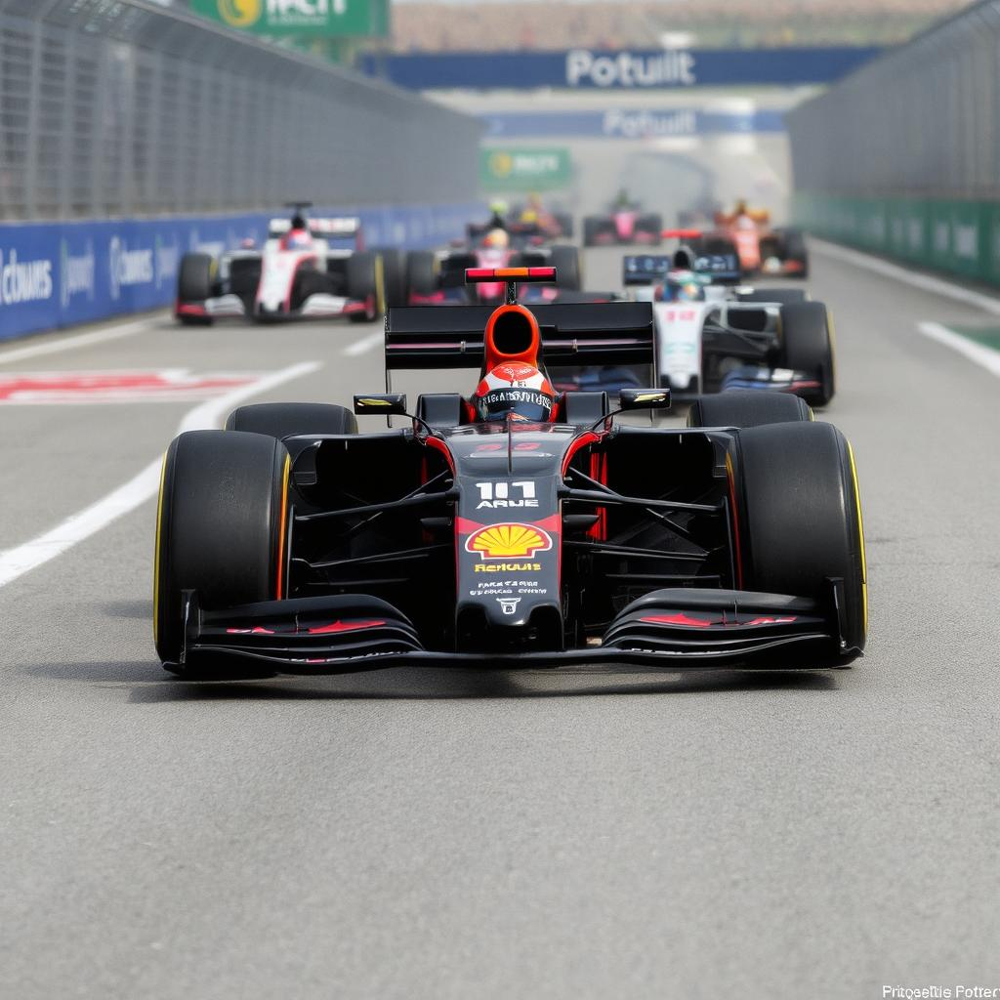

## Objective

The goal of this notebook is to predict the number of pitstops that should be made during the race. Specifically, we will perform EDA **(Exploratory Data Analysis)** to identify and visualise the factors contributing to pitstop prediction. This analysis will later help us to build a **Machine Learning Model** to predict the number of pitstops that should be made during a race.

This is a **Multi-class Classification problem**. We will use Weighted precision(as we want our predictions to be as precise and true as possible), which accounts for class imbalances and indicates the degree of agreement whether the model is good at predicting or not, since in formula 1 if a pitstop strategy is correct, it could lead to desired results which then leads to additional points and millions of pounds in profit.


## Libraries



In [1]:
import warnings
warnings.simplefilter(action='ignore',category=FutureWarning)

import numpy as np
import pandas as pd
pd.set_option('display.max_columns',None)

#Data Visualisation Libraries
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import seaborn as sns
sns.set_style('darkgrid')

#Statistics
from scipy.stats import chi2_contingency
from imblearn.over_sampling import SMOTE

#Machine Learning
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import learning_curve

from sklearn.preprocessing import LabelEncoder, StandardScaler,MinMaxScaler, label_binarize

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import accuracy_score, recall_score, precision_score,auc,roc_auc_score, roc_curve
from sklearn.metrics import classification_report, confusion_matrix,f1_score

print('Libraries Imported!')



Libraries Imported!


# Parameters and Variables

It is convinient to set some default parameters and variables for the whole notebook

In [2]:
font_size = 20
plt.rcParams['axes.labelsize'] = font_size
plt.rcParams['axes.titlesize'] = font_size + 2
plt.rcParams['xtick.labelsize'] = font_size - 2
plt.rcParams['ytick.labelsize'] = font_size - 2
plt.rcParams['legend.fontsize'] = font_size - 2

colors = ['#00A5E0','#DD403A','#D5CABD','#7A6F86','#C34A36']
colors_cat = ['#E8907E','#D5CABD','#7A6F86','#C34A36','#B0A8B9','#845EC2',
'#8f9aaa','#FFB86F','#63BAAA','#9D88B3','#38c4e3']
colors_comp = ['steelblue','seagreen','black','darkorange','purple','firebrick','slategrey']

random_state = 42
scoring_metric = 'precision_weighted'
comparison_dict, comparison_test_dict = {},{}

print('Default Parameters and Variables Set!')

Default Parameters and Variables Set!


# Functions

Since we will reuse parts of the code, it is important to define some functions

**plot_continuous()**

In [3]:
def plot_continuous(feature):
  ''' Plot a histogram and a boxplot for the Pitstop
  distributions for a specified feature'''
  df_func = train_df.copy()
  df_func['Pit Stops'] = df_func['Pit Stops'].astype('category')

  fig, (ax1,ax2) = plt.subplots(2,figsize=(10,8),sharex=True,gridspec_kw={'height_ratios':(.7,.3)})


  for df, color, label in zip([df_0_stop,df_1_stop,df_2_stop,df_3_stop,df_4_stop],colors,['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop']):
    sns.histplot(data=df,
                 x=feature,
                 bins=20,
                 color=color,
                 alpha=0.66,
                 edgecolor='steelblue',
                 label=label,
                 kde=False,
                 ax=ax1)
    ax1.legend()

    sns.boxplot(x=feature,y='Pit Stops',data=df_func,palette=colors,ax=ax2)
    ax2.set_ylabel('')
    ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])

    plt.tight_layout()

print('Function Defined!')

Function Defined!


**plot_categorical()**

In [4]:
def plot_categorical(feature):
  '''   For a categorical feature, plot a countplot
  for the total counts of each category next to a barplot for the pitstop rate'''

  fig, (ax1,ax2) = plt.subplots(1,2,figsize=(12,6))

  df_copy = train_df.copy()

  df_copy['Constructor Name'] = df_copy['Constructor Name'].str[:2] #To make it look less cluttered
  df_copy['Driver ID'] = df_copy['Driver ID'].str[:1]
  df_copy['Race Name'] = df_copy['Race Name'].str[:1]


  sns.countplot(x=feature,
                hue='Pit Stops',
                data=df_copy,
                palette=colors,
                ax=ax1)

  ax1.set_ylabel('Count')
  ax1.legend()

  sns.barplot(x=feature,
              y='Pit Stops',
              data=df_copy,
              palette=colors,
              ax=ax2)

  ax2.set_ylabel('Pit Stop Rate')

  plt.tight_layout()

print('Function Defined!')


Function Defined!


**plot_conf_mx()**

In [5]:
def plot_conf_mx(cm,ax):
  ''' plot a confusion matrix in the specified axes object'''

  sns.heatmap(cm,
              annot=True,
              cbar = False,
              annot_kws={'fontsize':30},
              ax=ax)

  ax.set_xlabel('Predicted')
  ax.set_xticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
  ax.set_ylabel('Actual')
  ax.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])


print('Function Defined!')


Function Defined!


**plot_learning_curve()**

In [6]:
def plot_learning_curve(estimator,X,y,ax,cv=None,train_sizes=np.linspace(0.1,1.0,5)):
  ''' Plot a learning curve for the specified estimator'''

  train_sizes,train_scores,test_scores = learning_curve(estimator,
                                                        X,
                                                        y,
                                                        cv=5,
                                                        n_jobs=-1,
                                                        train_sizes=train_sizes,
                                                        scoring=scoring_metric)

  train_scores_mean = np.mean(train_scores,axis=1)
  train_scores_std = np.std(train_scores,axis=1)

  test_scores_mean = np.mean(test_scores,axis=1)
  test_scores_std = np.std(test_scores,axis=1)

  ax.fill_between(train_sizes,
                  train_scores_mean - train_scores_std,
                  train_scores_mean + train_scores_std,
                  alpha=0.1,
                  color='dodgerblue')

  ax.fill_between(train_sizes,
                  test_scores_mean + test_scores_std,
                  test_scores_mean - test_scores_std,
                  alpha=0.1,
                  color='darkorange')

  ax.plot(train_sizes,
          train_scores_mean,
          color='dodgerblue',
          marker='o',
          linestyle='--',
          label='Training Score')

  ax.plot(train_sizes,
          test_scores_mean,
          color='darkorange',
          marker = 'o',
          linestyle = '--',
          label = 'Cross Validation Score')

  ax.set_xlabel('Training Examples')
  ax.set_ylabel('Weighted Precision Score')
  ax.legend(loc='best',fontsize=14)


print('Function Defined!')

Function Defined!


**clf_performance()**

In [7]:
def clf_performance(classifier, classifier_name, classifier_name_abv):
    ''' Display the Overall performance of the classifier with this function '''

    print(classifier_name)
    print('--------------')
    print('Best Score ({})'.format(scoring_metric) + str(np.round(classifier.best_score_, 3)))

    print('Best Parameters')
    for key, value in classifier.best_params_.items():
        print('    {} : {}'.format(key, value))

    # Predict probabilities and classes using cross-validation
    y_pred_pp = cross_val_predict(estimator=classifier.best_estimator_,
                                  X=X_train,
                                  y=y_train,
                                  cv=5,
                                  method='predict_proba')
    num_classes = y_pred_pp.shape[1]  # Number of classes
    thresholds = [0.4] * num_classes  # Adjust these thresholds as needed

     # Apply custom thresholds to determine predicted classes
    y_pred = np.array([
    np.argmax([prob if prob > thresholds[i] else 0 for i, prob in enumerate(row)])
    for row in y_pred_pp
    ])


    # Calculate the confusion matrix (normalize to True for percentage)
    cm = confusion_matrix(y_train, y_pred, normalize='true')

    # Calculate the ROC AUC for each class using One-vs-Rest (OvR)
    y_train_bin = label_binarize(y_train, classes=np.unique(y_train))  # Binarize labels for OvR
    roc_auc = {}
    fpr, tpr = {}, {}
    for i in range(y_train_bin.shape[1]):
        fpr[i], tpr[i], _ = roc_curve(y_train_bin[:, i], y_pred_pp[:, i])
        roc_auc[i] = roc_auc_score(y_train_bin[:, i], y_pred_pp[:, i])

    # Calculate weighted metrics
    accuracy = accuracy_score(y_train, y_pred)
    precision = precision_score(y_train, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_train, y_pred, average='weighted', zero_division=0)
    roc_auc_avg = np.mean(list(roc_auc.values()))  # Average ROC AUC for all classes

    # Store evaluation metrics in comparison_dict
    comparison_dict[classifier_name_abv] = [
        accuracy,
        precision,
        recall,
        roc_auc_avg,
        fpr,
        tpr
    ]

    # Plot confusion matrix
    fig, ax1 = plt.subplots(figsize=(12, 12))
    sns.heatmap(cm,
                annot=True,
                cmap='Blues',
                annot_kws={'fontsize': 14},
                ax=ax1)
    ax1.set_xlabel('Predicted', fontsize=14)
    ax1.set_ylabel('Actual', fontsize=14)
    ax1.set_title('Confusion Matrix', fontsize=16)

    plt.tight_layout()
    plt.show()


**plot_feature_imp()**

In [8]:
def plot_feature_imp(classifer,classifier_name,color,ax):
  ''' Plot the feature importances for a classifier in terms of a bar plot'''

  importances = pd.DataFrame({'Feature':X_train_smote.columns,
                              'Importance':np.round(classifer.best_estimator_.feature_importances_,3)})

  importances = importances.sort_values('Importance',ascending=False).set_index('Feature')

  importances.plot.barh(color=color,
                        edgecolor='firebrick',
                        legend=False,
                        ax=ax)

  ax.set_title(classifier_name)
  ax.set_xlabel('Importance')

print('Function Defined!')

Function Defined!


**plot_roc_curve()**

In [9]:
def plot_roc_curve(classifier,X,y):
  # Colors for plotting
  colors_comp = ['steelblue', 'darkgray', 'cadetblue', 'bisque', 'purple']

  # Create figure
  fig, ax = plt.subplots(figsize=(10, 7))

  # Get predicted probabilities using cross-validation
  y_pred_pp = cross_val_predict(
    classifier,
    X,
    y,
    cv=5,
    method='predict_proba'
  )

  # Binarize labels for One-vs-Rest
  y_train_bin = label_binarize(y, classes=np.unique(y))

  # Initialize variables
  fpr, tpr, roc_auc = {}, {}, {}

  # Calculate the ROC AUC for each class
  for i in range(y_train_bin.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(y_train_bin[:, i], y_pred_pp[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    ax.plot(
        fpr[i],
        tpr[i],
        color=colors_comp[i % len(colors_comp)],
        label=f'Class {i}: AUC={roc_auc[i]:.3f}'
    )

  # Calculate micro-average ROC curve and AUC
  fpr_micro, tpr_micro, _ = roc_curve(y_train_bin.ravel(), y_pred_pp.ravel())
  roc_auc_micro = auc(fpr_micro, tpr_micro)
  ax.plot(
    fpr_micro,
    tpr_micro,
    color='black',
    linestyle='--',
    label=f'Micro Avg: AUC={roc_auc_micro:.3f}'
  )

  # Plot baseline
  ax.plot([0, 1], [0, 1], 'k--', label='Baseline')

  # Customize plot
  ax.set_title('ROC Curve for Multi-Class Classification', fontsize=16)
  ax.set_xlabel('False Positive Rate', fontsize=14)
  ax.set_ylabel('True Positive Rate', fontsize=14)
  ax.set_xticks([0, 0.25, 0.5, 0.75, 1])
  ax.set_yticks([0, 0.25, 0.5, 0.75, 1])
  ax.legend(fontsize=12)
  ax.grid(alpha=0.5)

  plt.tight_layout()
  plt.show()

print('Function Defined!')


Function Defined!


**test_func()**

In [10]:
def test_func(classifier, classifier_name, ax, comparison_test_dict):
    '''Assess the performance on the test set and plot the confusion matrix.'''

    # Make predictions
    y_pred = classifier.predict(X_test)

    # Compute probabilities (if available) for ROC AUC
    if hasattr(classifier, "predict_proba"):
        y_pred_proba = classifier.predict_proba(X_test)
        roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class='ovr', average='weighted')
    else:
        roc_auc = None  # Set to None if probabilities are not available

    # Compute normalized confusion matrix
    cm = confusion_matrix(y_test, y_pred, normalize='true')

    # Update metrics dictionary
    comparison_test_dict[classifier_name] = {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average='weighted'),
        "Recall": recall_score(y_test, y_pred, average='weighted'),
        "ROC_AUC": roc_auc,
    }

    # Plot the confusion matrix
    sns.heatmap(
        cm,
        annot=True,
        annot_kws={'fontsize': 24},
        cmap='Blues',
        cbar=False,
        ax=ax
    )

    # Dynamic class labels
    if hasattr(classifier, "classes_"):
        class_labels = classifier.classes_
    else:
        class_labels = sorted(set(y_test))  # Fallback if classes_ not available

    ax.set_title(classifier_name)
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_xticklabels(class_labels)
    ax.set_yticklabels(class_labels)

print('Function Defined!!')


Function Defined!!


# A Quick Look at our Data

We start by importing the dataset as a pandas DataFrame

In [11]:
df = pd.read_csv(r'C:\Users\NATHAN\Downloads\f1_combined_data_final.csv')

print('Dataset Imported Successfully')
print('It contains {} rows and {} columns'.format(df.shape[0],df.shape[1]))
df.head()

Dataset Imported Successfully
It contains 18162 rows and 31 columns


,Year,Round_x,Race Name,Lap Number,Driver ID,Position,Lap Time,Round_y,Driver Name,Constructor Name,Grid Position,Final Position,Time_x,Fastest Lap Time,Points,Status,Number of Laps,Round,Lap,Stop,Time_y,Duration,Date,Latitude,Longitude,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2019,1,Australian Grand Prix,1,bottas,1,1:33.813,1.0,Valtteri Bottas,Mercedes,2.0,1.0,1:25:27.325,1:25.580,26.0,Finished,58.0,1.0,23.0,1.0,16:47:33,22.014,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
1,2019,1,Australian Grand Prix,1,hamilton,2,1:34.887,1.0,Lewis Hamilton,Mercedes,1.0,2.0,+20.886,1:26.057,18.0,Finished,58.0,1.0,15.0,1.0,16:35:52,21.515,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
2,2019,1,Australian Grand Prix,1,vettel,3,1:35.626,1.0,Sebastian Vettel,Ferrari,3.0,4.0,+57.109,1:27.954,12.0,Finished,58.0,1.0,14.0,1.0,16:34:28,21.995,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
3,2019,1,Australian Grand Prix,1,max_verstappen,4,1:36.291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,25.0,1.0,16:50:47,21.157,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
4,2019,1,Australian Grand Prix,1,leclerc,5,1:37.042,1.0,Charles Leclerc,Ferrari,5.0,5.0,+58.203,1:26.926,10.0,Finished,58.0,1.0,28.0,1.0,16:55:26,22.306,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1


This dataset consists of 18000+ rows and 31 columns including 'Pit Stops' which is the target variable and indicates the number of pitstops made by an individual driver during a race.

There is a 0 pit stop category as well, which is not a feasible prediction as in formula 1 it's mandatory that the driver makes atleast one stop. I tried dropping those records but it resulted in loss of important information so we will keep the data, and perform a post processing step before deployment, so that the model provides predictions as accurate as possible

In [12]:

print('The shape of the dataset is: ({},{})'.format(df.shape[0],df.shape[1]))
df.head()

The shape of the dataset is: (18162,31)


,Year,Round_x,Race Name,Lap Number,Driver ID,Position,Lap Time,Round_y,Driver Name,Constructor Name,Grid Position,Final Position,Time_x,Fastest Lap Time,Points,Status,Number of Laps,Round,Lap,Stop,Time_y,Duration,Date,Latitude,Longitude,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2019,1,Australian Grand Prix,1,bottas,1,1:33.813,1.0,Valtteri Bottas,Mercedes,2.0,1.0,1:25:27.325,1:25.580,26.0,Finished,58.0,1.0,23.0,1.0,16:47:33,22.014,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
1,2019,1,Australian Grand Prix,1,hamilton,2,1:34.887,1.0,Lewis Hamilton,Mercedes,1.0,2.0,+20.886,1:26.057,18.0,Finished,58.0,1.0,15.0,1.0,16:35:52,21.515,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
2,2019,1,Australian Grand Prix,1,vettel,3,1:35.626,1.0,Sebastian Vettel,Ferrari,3.0,4.0,+57.109,1:27.954,12.0,Finished,58.0,1.0,14.0,1.0,16:34:28,21.995,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
3,2019,1,Australian Grand Prix,1,max_verstappen,4,1:36.291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,25.0,1.0,16:50:47,21.157,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
4,2019,1,Australian Grand Prix,1,leclerc,5,1:37.042,1.0,Charles Leclerc,Ferrari,5.0,5.0,+58.203,1:26.926,10.0,Finished,58.0,1.0,28.0,1.0,16:55:26,22.306,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1


The info() method can give us valuable information such as the number of non-null values and the type of each feature

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18162 entries, 0 to 18161
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              18162 non-null  int64  
 1   Round_x           18162 non-null  int64  
 2   Race Name         18162 non-null  object 
 3   Lap Number        18162 non-null  int64  
 4   Driver ID         18162 non-null  object 
 5   Position          18162 non-null  int64  
 6   Lap Time          18162 non-null  object 
 7   Round_y           14138 non-null  float64
 8   Driver Name       14138 non-null  object 
 9   Constructor Name  14138 non-null  object 
 10  Grid Position     14138 non-null  float64
 11  Final Position    14138 non-null  float64
 12  Time_x            8572 non-null   object 
 13  Fastest Lap Time  13966 non-null  object 
 14  Points            14138 non-null  float64
 15  Status            14138 non-null  object 
 16  Number of Laps    14138 non-null  float6

###Getting the percentage of missing values

In [14]:
#checking the percentage of missing values for the 15 columns which have them
missing_values = df.isnull().sum().sort_values(ascending=False)
missing_values_percent = ((df.isnull().sum()*100)/df.shape[0]).sort_values(ascending=False)

missing_df = pd.concat([missing_values,missing_values_percent],axis=1,keys=['Missing Values','Missing Values Percent'])
missing_df.head(15).style.background_gradient(cmap='Blues',axis=0)

,Missing Values,Missing Values Percent
Time_x,9590,52.802555
Fastest Lap Time,4196,23.103182
Status,4024,22.156150
Driver Name,4024,22.156150
Number of Laps,4024,22.156150
Points,4024,22.156150
Grid Position,4024,22.156150
Constructor Name,4024,22.156150
Final Position,4024,22.156150
Round_y,4024,22.156150


* Since time_x is unique for each and every driver for each and every race and half of the data is missing, we can drop it
* We can also drop driver name as it is unique most of the time
* We can also drop Round as it does not hold much info
* Since we have Pit Stop data as the target variable, we can afford to drop Stop which contains stop number for each driver, which won't be required in our use case
* We can also drop time_y as it the timestamp for the stop made, which won't correlate to our target variable
* Rest of the missing values will be dealt via imputation based on their specificity


The describe method gives us a statistical summary of the numerical features

In [15]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,18162.0,2021.623610,1.699412,2019.0000,2020.00000,2022.00000,2023.0000,2024.0000
Round_x,18162.0,11.250028,6.246473,1.0000,6.00000,11.00000,16.0000,23.0000
Lap Number,18162.0,3.087380,1.489540,1.0000,2.00000,3.00000,4.0000,7.0000
Position,18162.0,10.165015,5.724857,1.0000,5.00000,10.00000,15.0000,20.0000
Round_y,14138.0,11.258877,6.256086,1.0000,6.00000,11.00000,16.0000,23.0000
Grid Position,14138.0,10.086434,5.761134,0.0000,5.00000,10.00000,15.0000,20.0000
Final Position,14138.0,10.322252,5.480052,1.0000,6.00000,10.00000,15.0000,20.0000
Points,14138.0,4.883223,6.759036,0.0000,0.00000,1.00000,8.0000,26.0000
Number of Laps,14138.0,57.410737,13.348247,1.0000,52.00000,57.00000,69.0000,87.0000
Round,17671.0,11.203101,6.203793,1.0000,6.00000,11.00000,16.0000,22.0000


* The mean number of pitstops is 1.6 and standard deviation is 0.6 which means most of the time, teams either do a one stop or a two stop
* The mean humidity percentage is 75.97 which means that 3/4 of the time there is a chance of rain which could lead to more than just 1 stop
* The average Lap value is 21 which means that drivers come into the pits mostly after 20 laps or so and a standard deviation of 13 shows that they may come in early into the pits either due to degradation or an issue, and later into the pits if they want to stay out on those tyres to just do a 1 stop


In [16]:
#dropping the features which are not required
df.drop(['Time_x','Time_y','Driver Name','Round','Round_x','Round_y','Stop'],axis=1,inplace=True)
print('The shape of the dataset is: ({},{})'.format(df.shape[0],df.shape[1]))
df.head()

The shape of the dataset is: (18162,24)


,Year,Race Name,Lap Number,Driver ID,Position,Lap Time,Constructor Name,Grid Position,Final Position,Fastest Lap Time,Points,Status,Number of Laps,Lap,Duration,Date,Latitude,Longitude,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2019,Australian Grand Prix,1,bottas,1,1:33.813,Mercedes,2.0,1.0,1:25.580,26.0,Finished,58.0,23.0,22.014,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
1,2019,Australian Grand Prix,1,hamilton,2,1:34.887,Mercedes,1.0,2.0,1:26.057,18.0,Finished,58.0,15.0,21.515,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
2,2019,Australian Grand Prix,1,vettel,3,1:35.626,Ferrari,3.0,4.0,1:27.954,12.0,Finished,58.0,14.0,21.995,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
3,2019,Australian Grand Prix,1,max_verstappen,4,1:36.291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.0,21.157,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1
4,2019,Australian Grand Prix,1,leclerc,5,1:37.042,Ferrari,5.0,5.0,1:26.926,10.0,Finished,58.0,28.0,22.306,2019-03-17,-37.8497,144.968,broken clouds,17.76,67,0.89,No rain,1


**EDA(Exploratory Data Analysis)** will help us identify the dataset better, but before we go any further, we need to split the dataset into train and test splits. We will perform analysis and model creation only the **train** set and evaluate our model on the **test** set. This prevents **data leakage** which in turn prevents the Machine learning model from being **biased**.

# Creating a Test Set

We will split a dataset into a train and test set using scikit-learn's train_test_split() function, which implements random sampling. Our dataset is large enough, especially relative to the number of features, so we do not risk introducing **sampling bias**

In [17]:
train_df,test_df = train_test_split(df,test_size=0.2,random_state=random_state)

train_df.reset_index(drop=True,inplace=True)
test_df.reset_index(drop=True,inplace=True)

print('Train set: ({},{})'.format(train_df.shape[0],train_df.shape[1]))
print('Test set: ({},{})'.format(test_df.shape[0],test_df.shape[1]))

Train set: (14529,24)
Test set: (3633,24)


# Exploratory Data Analysis

## Target Variable : Pit Stops

As we have seen earlier, the target variable can take on 5 possible values:

* Zero(0) indicating that the driver either did not start or finish
* One(1) indicating that the driver made a one-stop
* Two(2) indicating that the driver made a two-stop
* Three (3) indicating that the driver made a three-stop
* Four(4) indicating that the driver made a four-stop

In [18]:
#Getting the sorted counts per pitstop
sorted_counts = pd.DataFrame(train_df['Pit Stops'].value_counts().reset_index()).sort_values(by='Pit Stops')
sorted_counts.set_index('Pit Stops',inplace=True)
sorted_counts

,count
Pit Stops,
0,399
1,5597
2,7688
3,783
4,62


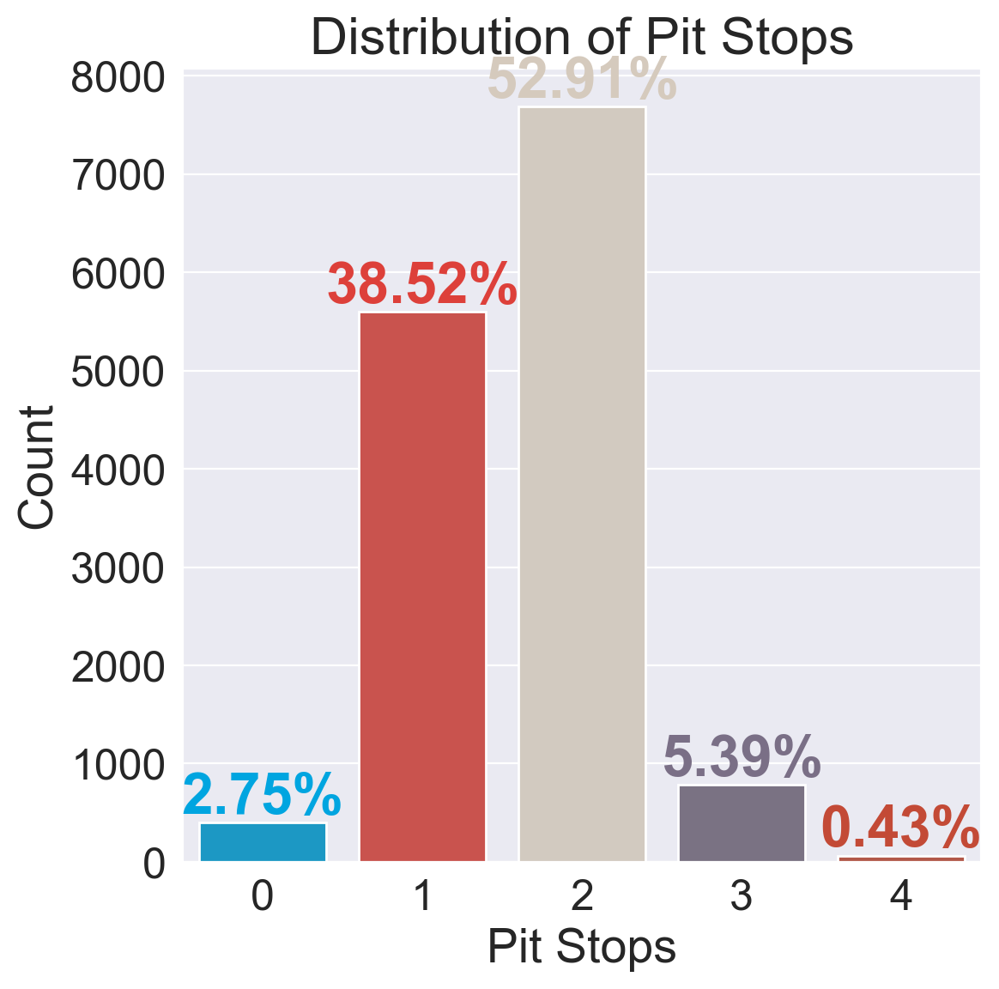

In [19]:
fig, ax = plt.subplots(figsize=(6,6))

sns.countplot(x='Pit Stops',data=train_df,palette=colors,ax=ax)

for index, value in enumerate(sorted_counts['count']):
  label = '{}%'.format(np.round((value/train_df.shape[0])*100,2))
  ax.annotate(label,
              xy=(index,value+250),
              ha='center',
              va='center',
              color=colors[index],
              fontweight='bold',
              size = font_size + 4
              )

  ax.set_xlabel('Pit Stops')
  ax.set_ylabel('Count')
  ax.set_title('Distribution of Pit Stops')



* As we said earlier, more than half of the time the stop made is a two-stopper, and around 90% of the time it's either a one-stop or two-stop
* 3-stops and 4-stops are even rarer because they normally take place when there is either an issue in the car or a sudden change in weather conditions
* Zero pitstops are when the driver did not start or did not finish the race

As we can see the dataset is **skewed/imbalanced** therefore we cannot use accuracy as a metric to evaluate the model performance.

Different visualisation techniques apply to different types of variables, so it's helpful to diffrentiate between categorical,continuous variables and datetime variables and look at them separately.

In [20]:
#Replacing the No rain value with 0
train_df['Rain (mm)'].replace('No rain',0,inplace=True)

In [21]:
#Lap Number and Position will be dropped as Lap Number contains limited data and Position is not required as we have the start and end position
# Since we have the weather data of the particular location and the name of the Grand Prix we will drop latitude and longitude data
continuous = ['Lap Number','Position','Grid Position','Final Position','Points','Number of Laps','Lap','Latitude','Longitude','Duration','Temperature (°C)','Humidity (%)','Wind Speed (m/s)','Rain (mm)']
categorical = ['Year','Race Name','Driver ID','Constructor Name','Status','Weather']
datetime = ['Date','Fastest Lap Time','Lap Time']

print('Continuous :',','.join(continuous))
print('Categorical :',','.join(categorical))
print('Datetime :',','.join(datetime))

Continuous : Lap Number,Position,Grid Position,Final Position,Points,Number of Laps,Lap,Latitude,Longitude,Duration,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm)
Categorical : Year,Race Name,Driver ID,Constructor Name,Status,Weather
Datetime : Date,Fastest Lap Time,Lap Time


# Continuous Variables

By calling the hist method, we can plot a histogram for all the continuous numeric features:

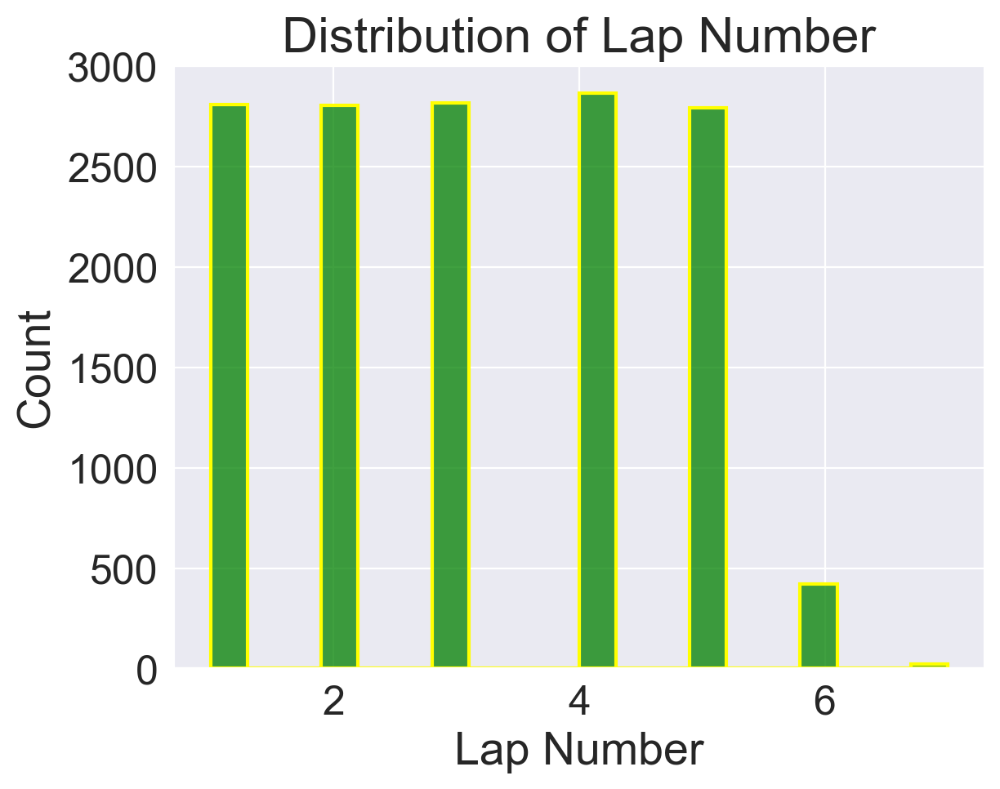

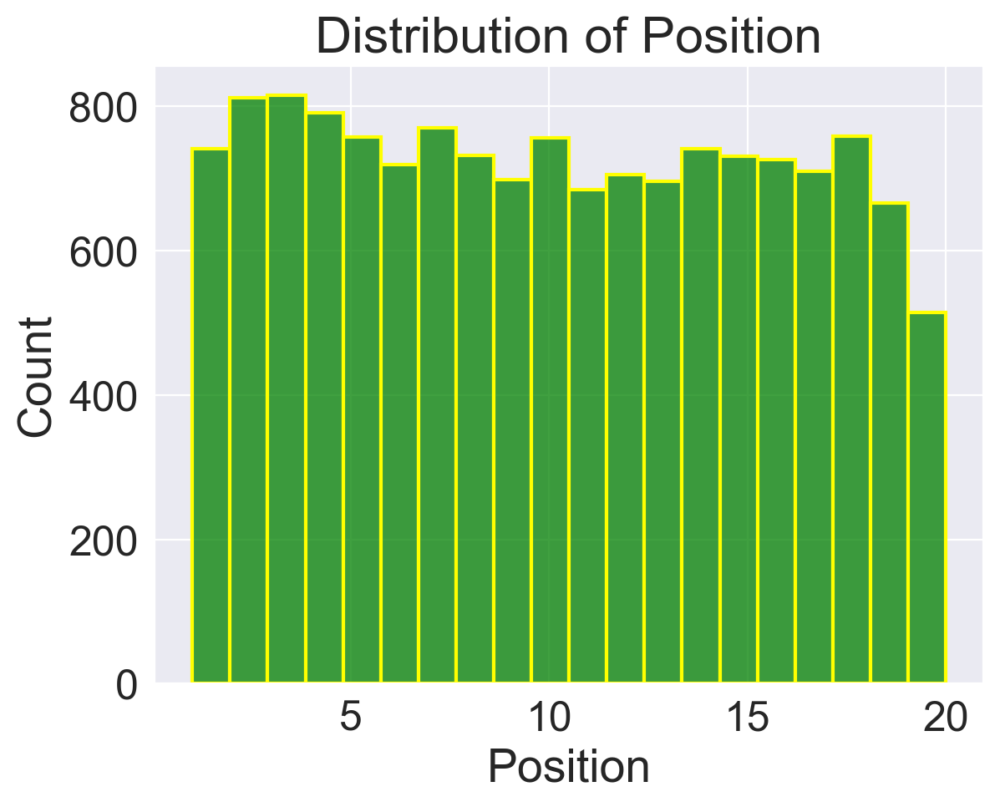

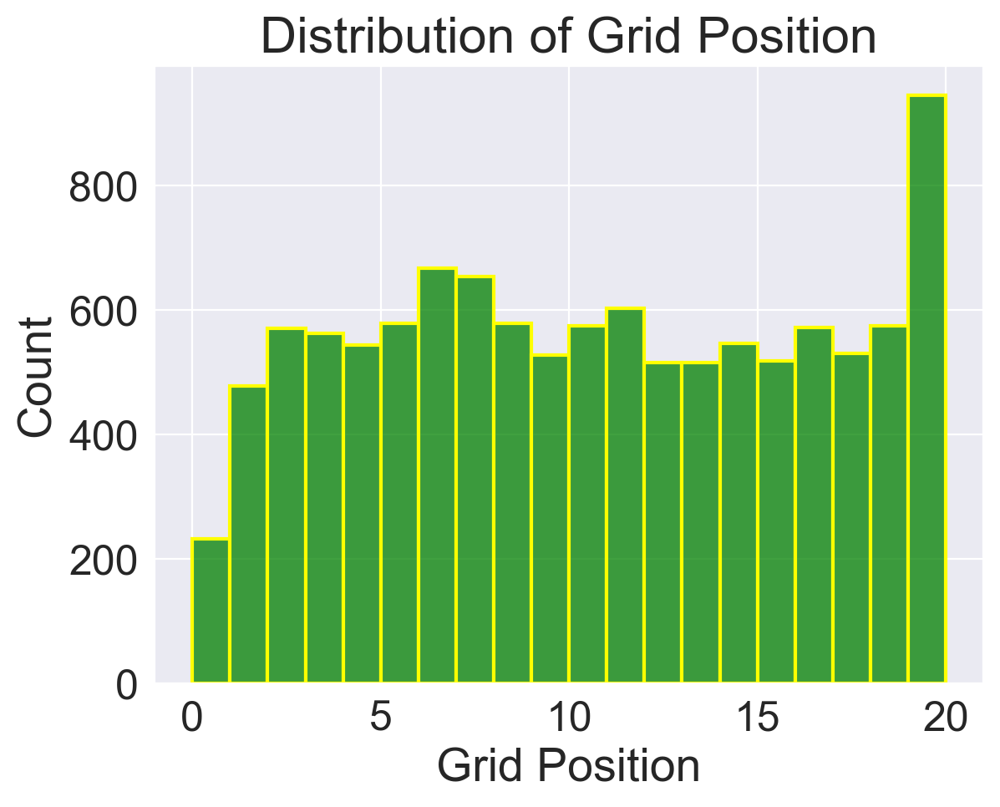

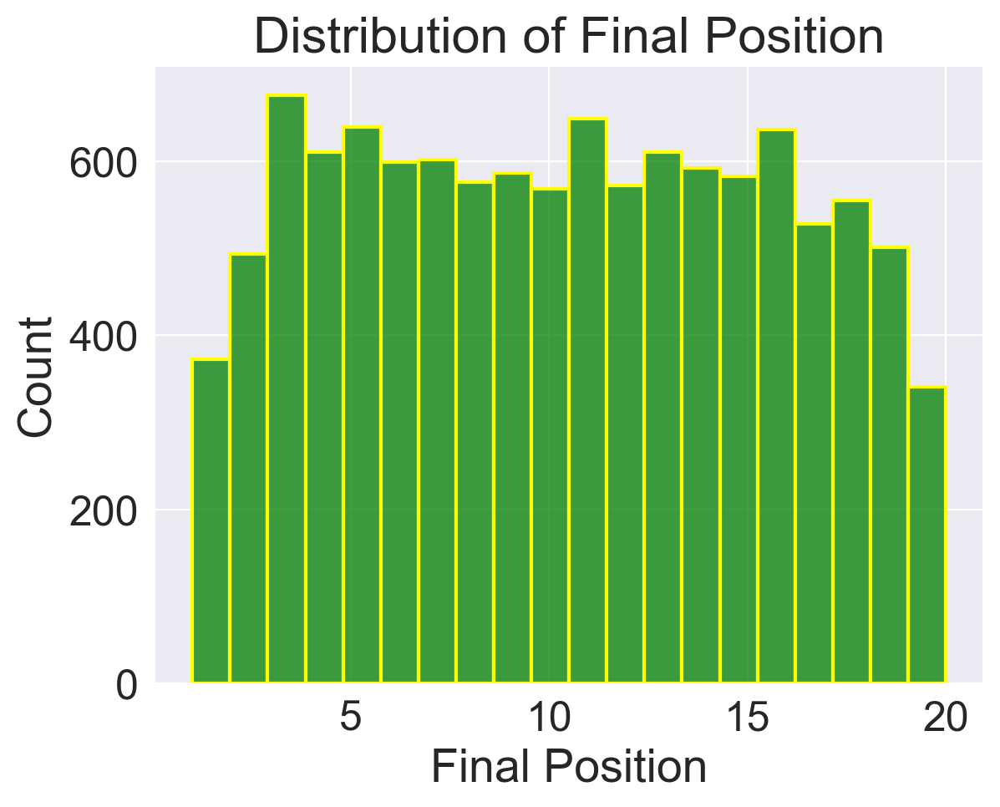

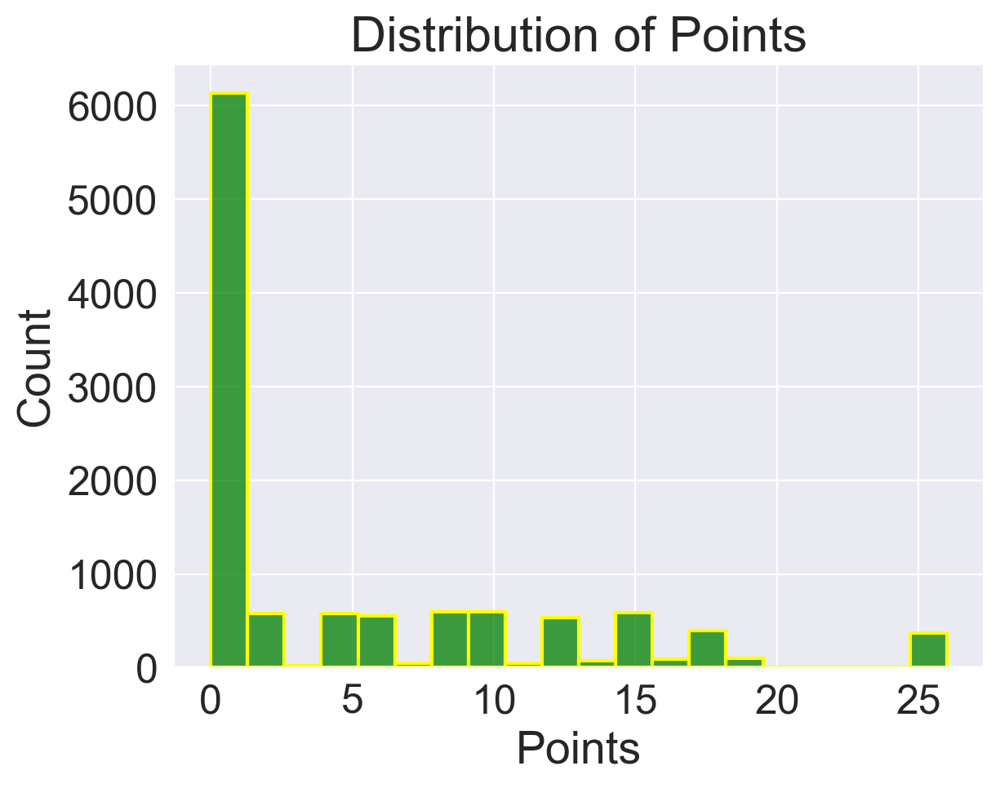

...

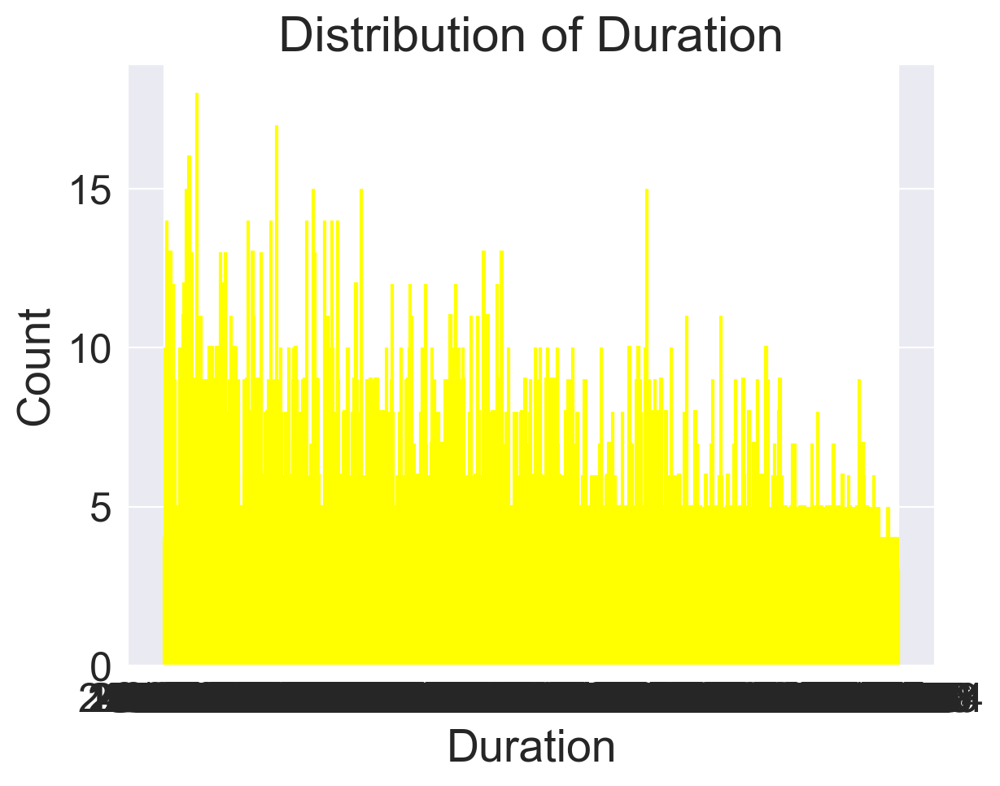

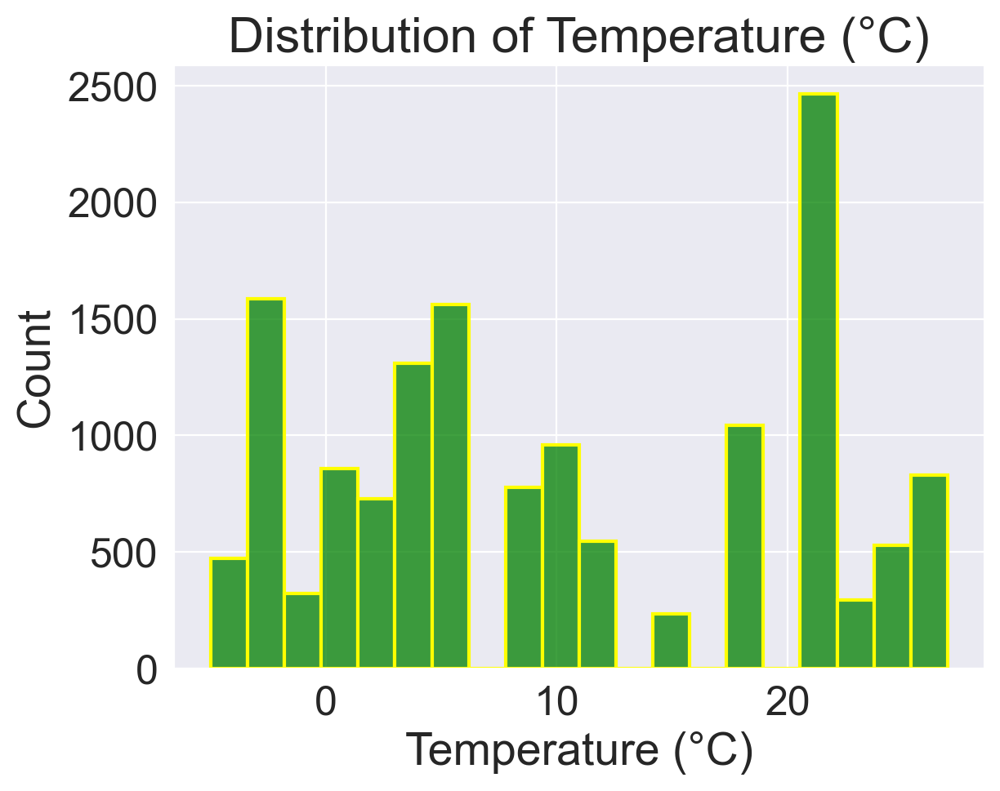

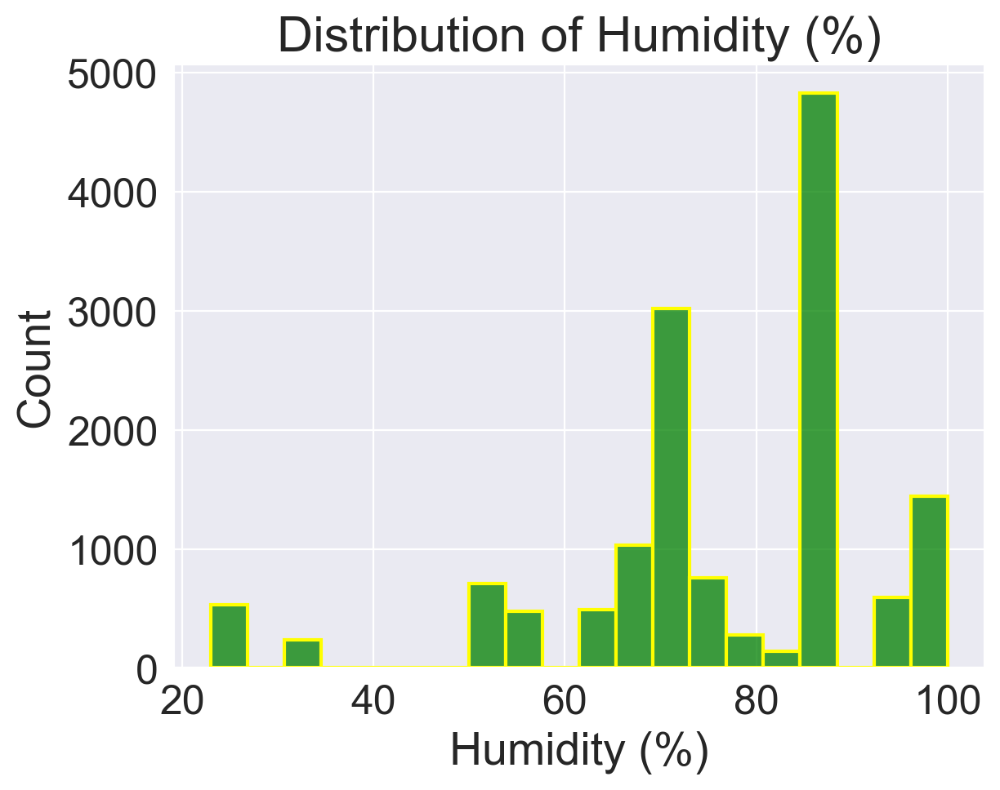

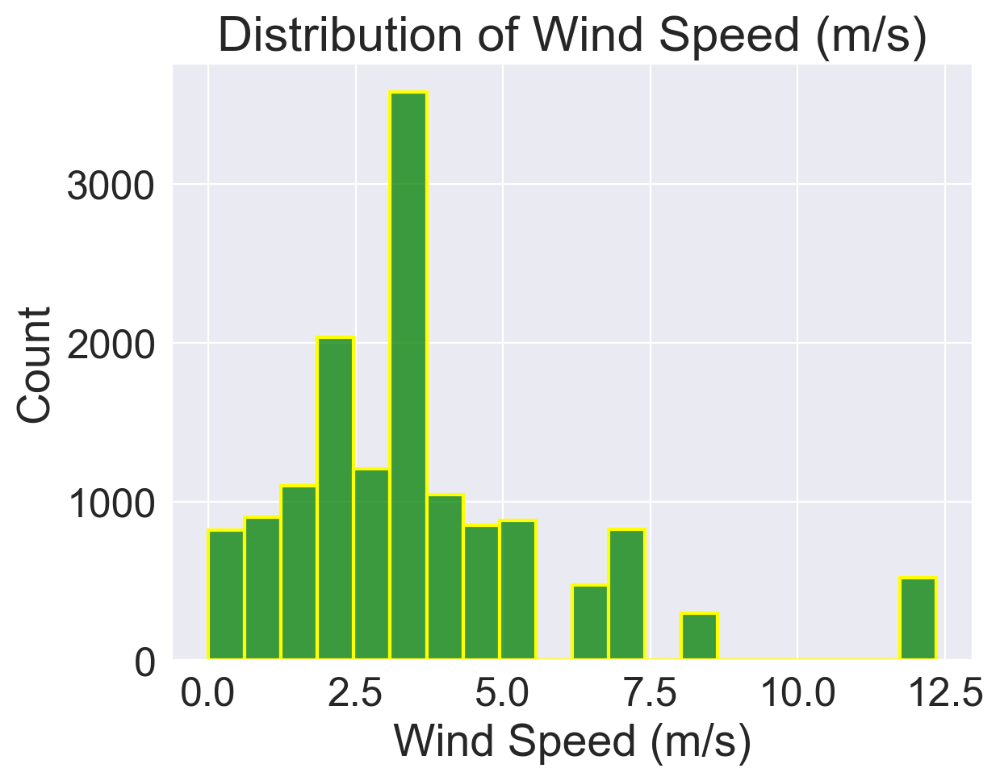

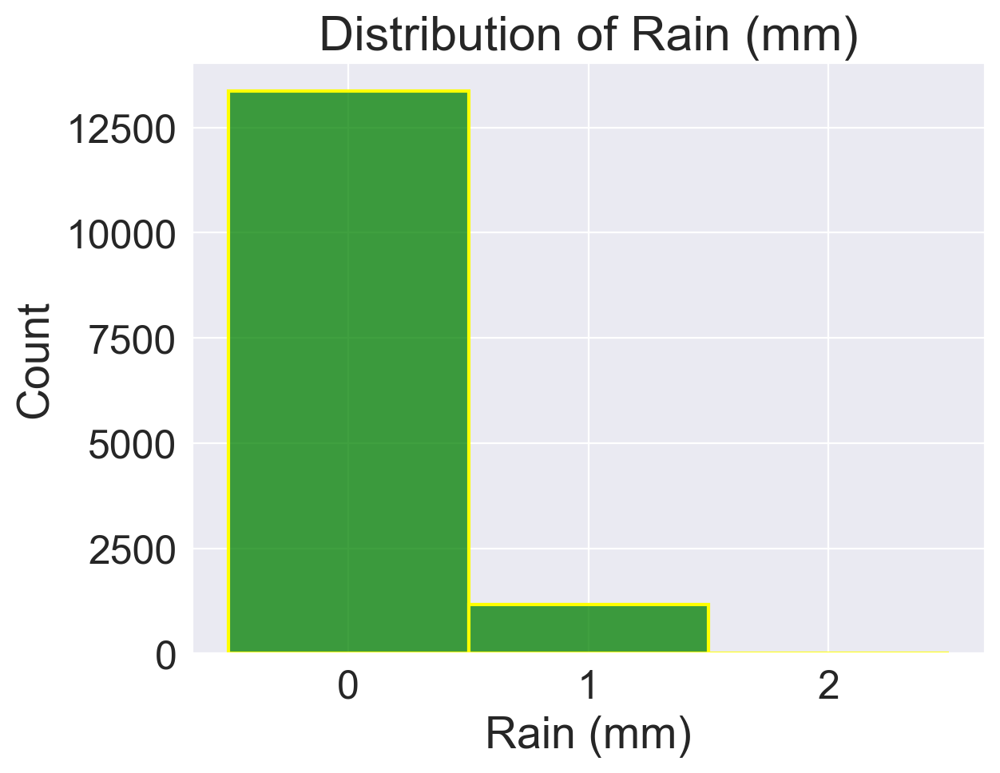

In [22]:
for feature in continuous:
  sns.histplot(data=train_df,
               x=feature,
               bins=20,
               color='green',
               edgecolor='yellow',
               linewidth=1.5)
  plt.ylabel('Count')
  plt.title(f'Distribution of {feature}')
  plt.show()

* We will drop Lap Number as it contains limited amount of data
* Position follows a uniform distribution, so it provides little to no information
* Same goes for the grid position and final position, what we can do is create a new feature **position gained** from these two features, which will provide
more info
* For Points, we can create a categorical variable Points Gained, which will indicate 1 if points are gained or 0 if points are lost.
* Number of Laps is slightly extends more to the left of the median than the right. i.e, not tail-heavy.
* Lap follows a downward trend which indicates that as the laps go on the chances of having a pitstop reduce
* Latitude and Longitude provide little to no information and the weather data is available along with the name of the grand prix,therefore it can be dropped
* Pitstop Duration follows a uniform distribution more or so
* Temperature, wind speed and humidity values are high in certain areas and low in some so they can be **binned**
* Rain can be converted into a categorical variable as it has 3 discrete values


# Looking for Correlations

We can compare the standard correlation coefficient between every pair of continuous features using the pandas corr() method and plot it as a matrix

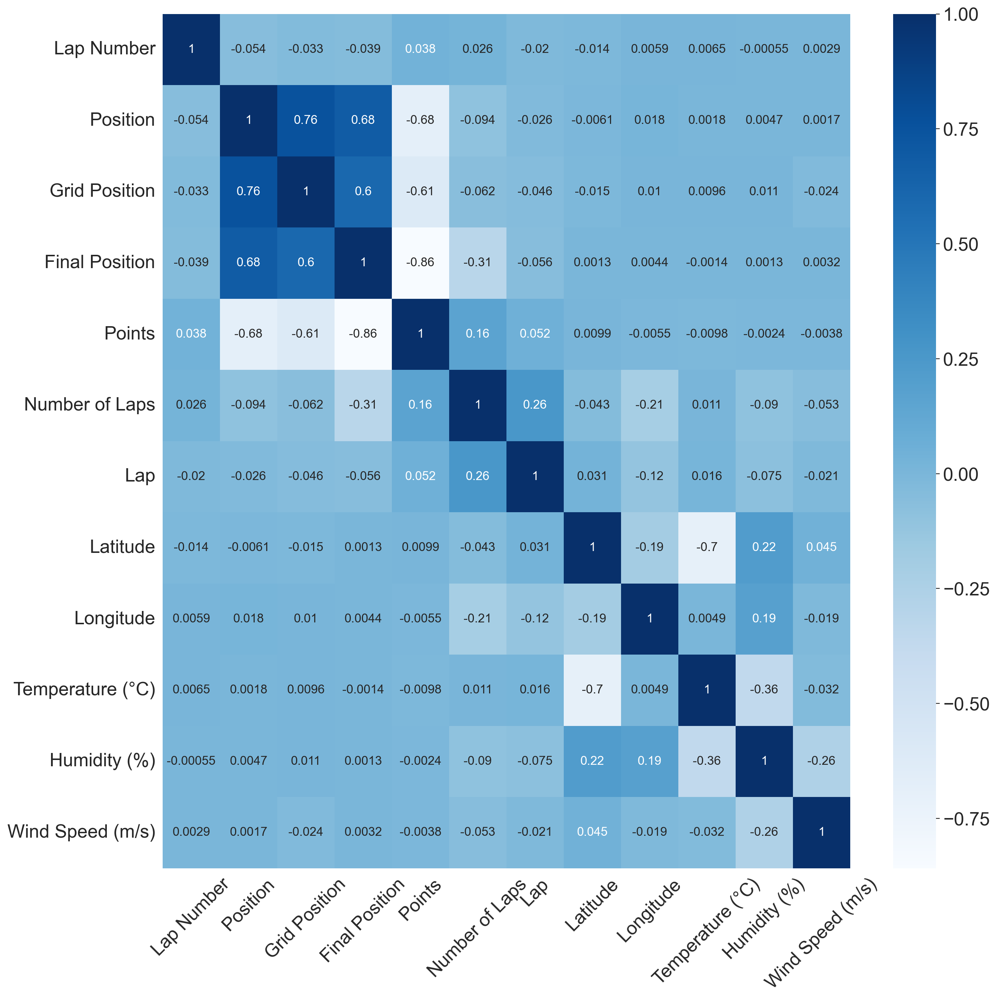

In [23]:
fig , ax = plt.subplots(figsize=(15,15))

sns.heatmap(train_df[continuous].corr(numeric_only=True),
            annot = True,
            annot_kws = {'fontsize':12},
            cmap = 'Blues',
            ax=ax
            )

ax.tick_params(axis='x',rotation=45)
ax.tick_params(axis='y',rotation=360)

There is a high correlation between Position, Grid Position, Final Position and Points. Since we will be creating new features from the final three ones and the first one will be dropped, there is no case of multicollinearity.

Also between Temperature and Latitude, there is a high correlation, since Latitude is being dropped, we don't need to worry about it

Let us look at the features in greater detail

In [24]:
#First let us drop the features discussed
train_df.drop(['Lap Number','Position','Latitude','Longitude'],axis=1,inplace=True)
train_df.head()

,Year,Race Name,Driver ID,Lap Time,Constructor Name,Grid Position,Final Position,Fastest Lap Time,Points,Status,Number of Laps,Lap,Duration,Date,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2024,Australian Grand Prix,leclerc,1:22.519,Ferrari,4.0,2.0,1:19.813,19.0,Finished,58.0,34.0,17.308,2024-03-24,broken clouds,17.76,67,0.89,0,2
1,2019,Azerbaijan Grand Prix,albon,1:51.021,Toro Rosso,11.0,11.0,1:45.754,0.0,+1 Lap,50.0,12.0,20.720,2019-04-28,light intensity shower rain,4.97,75,12.35,0,1
2,2020,British Grand Prix,raikkonen,2:05.243,NaN,NaN,NaN,NaN,NaN,NaN,NaN,47.0,44.085,2020-08-02,overcast clouds,4.18,97,2.28,0,2
3,2022,Hungarian Grand Prix,sainz,1:23.354,Ferrari,2.0,4.0,1,12.0,Finished,70.0,17.0,22.820,2022-07-31,overcast clouds,1.26,70,3.09,0,1
4,2024,Australian Grand Prix,tsunoda,1:23.434,RB F1 Team,8.0,7.0,1:21.134,6.0,Finished,58.0,36.0,17.535,2024-03-24,broken clouds,17.76,67,0.89,0,2


C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

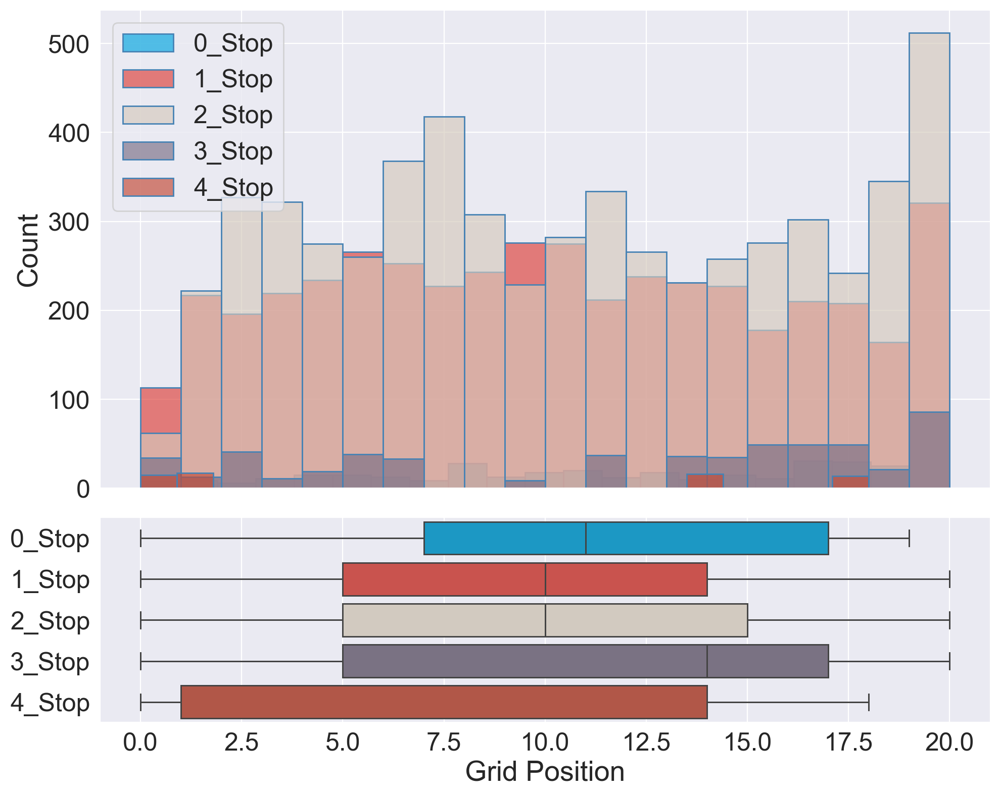

In [25]:
df_0_stop = train_df[train_df['Pit Stops'] == 0]
df_1_stop = train_df[train_df['Pit Stops'] == 1]
df_2_stop = train_df[train_df['Pit Stops'] == 2]
df_3_stop = train_df[train_df['Pit Stops'] == 3]
df_4_stop = train_df[train_df['Pit Stops'] == 4]

plot_continuous('Grid Position')

* Throughout the plot we can see that the frequency of 2-stops is much more compared to the 1-stops, but there are a few observations to note:
* Zero stops, mainly due to DNF's(Did Not Finish), mostly occur on the cars starting from the middle to the back of the grid, this might be due to reliability issues in the cars of the respective teams.
* The range if grid positions in which drivers tend to do a 1-stop, 2-stop and even a 3-stop are quite similar and mostly depend on the track characteristics, the tyre-degradation characteristics of the car and sudden weather changes.
* Zero-stops, four-stops are circumstancial as they occur when there is a change in weather or a broken part on the car or an issue with the engine etc.

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

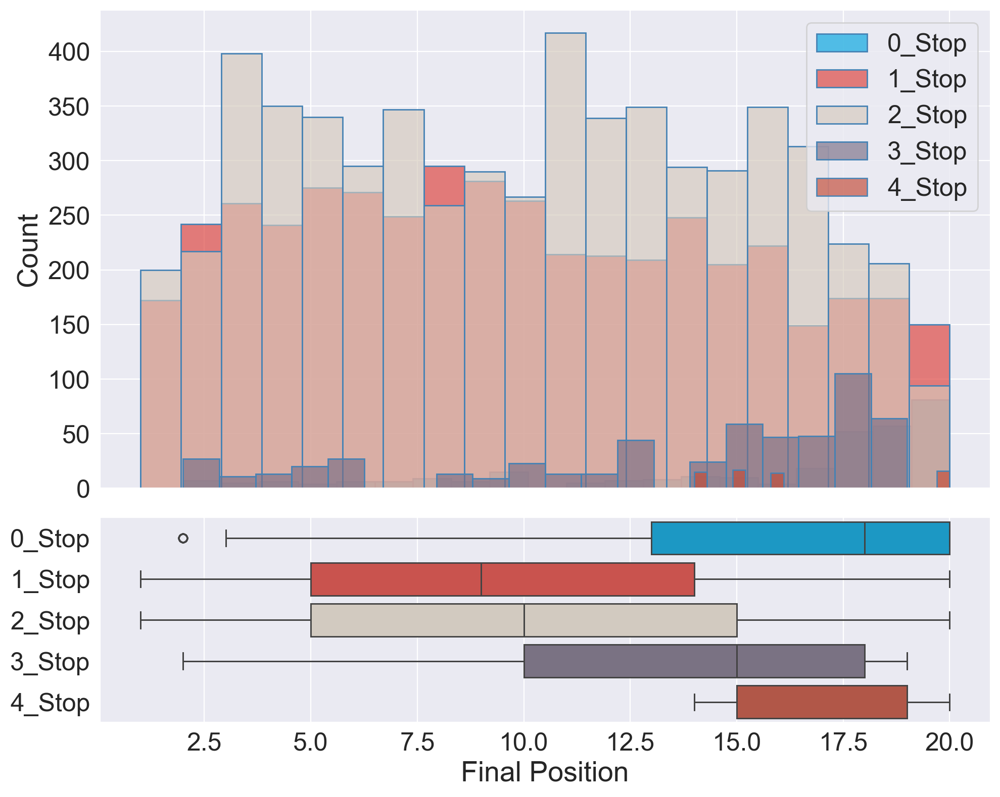

In [26]:
plot_continuous('Final Position')

* Its obvious that zero stoppers will end up at the back of the finishing grid
* The final positions of 1-stoppers and 2-stoppers are quite similar as they depend on the conditions stated previously.
* 3-stops sometimes are not the right call and the drivers end up finishing at the back of the grid and out of the points.
* Similarly for 4-stops

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

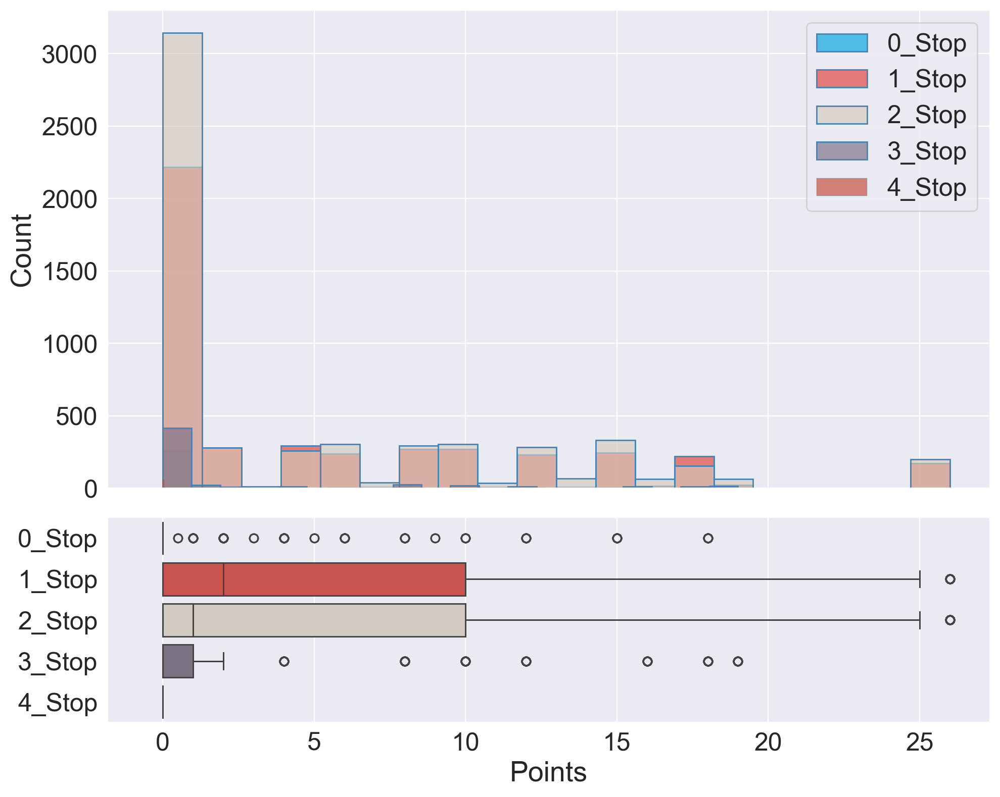

In [27]:
plot_continuous('Points')

As said earlier, we aren't getting much info from **Points** as a feature and so we will use it to create a feature **Points Gained**. This will also make use of grid position and final position features

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

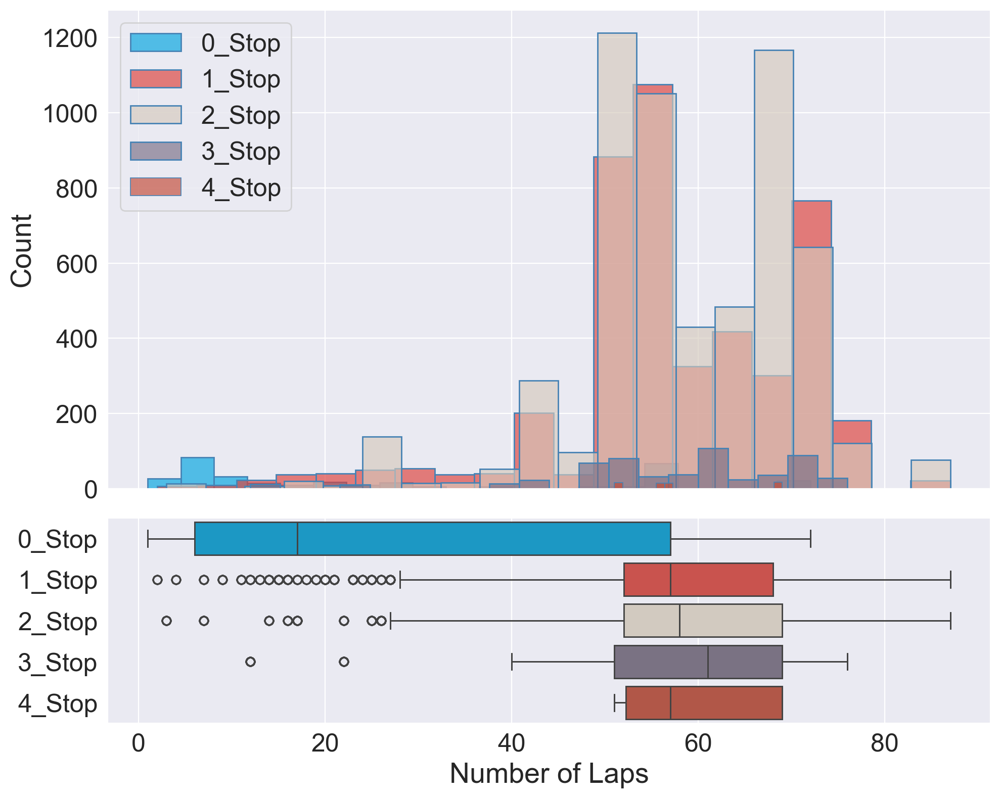

In [28]:
plot_continuous('Number of Laps')

* There are a lot of outliers in this data, but the inference we can make here is that races range from 50-70 laps or so
* Zero stop data represents the laps on which the drivers DNF'ed

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

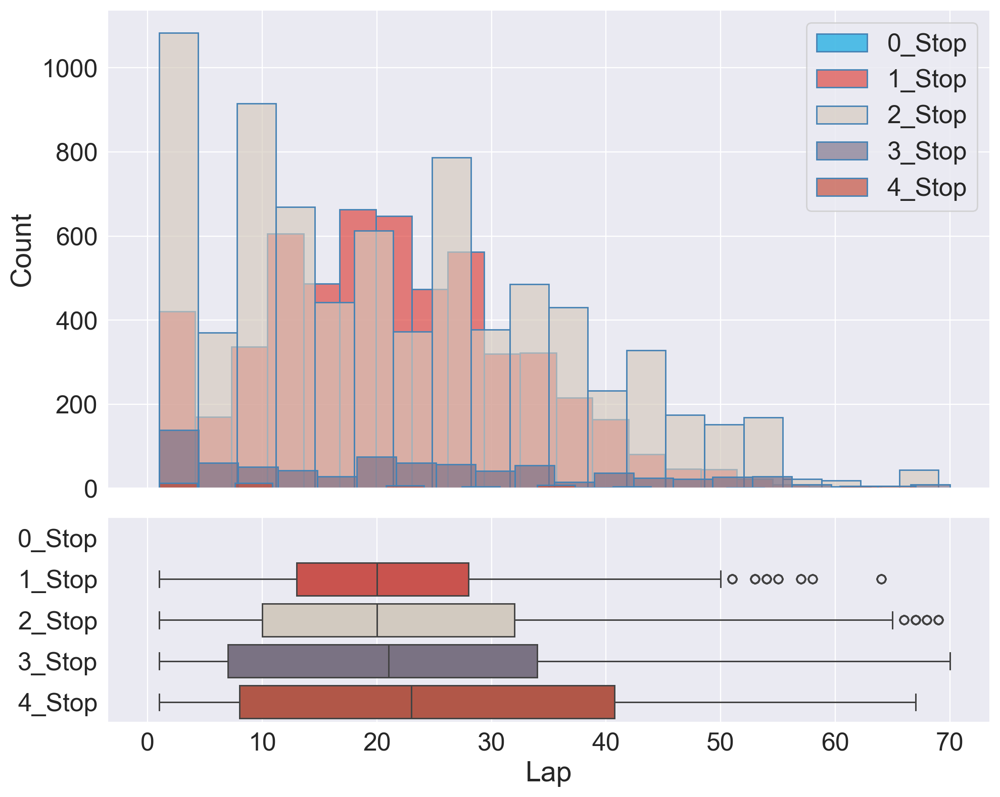

In [29]:
plot_continuous('Lap')

* As obvious as it can be, there is no data on zero stoppers as they do not pit
* When a 2-stop is made, the first stop is most probably made as early as lap 10-15 and then second stop is made 15-17 laps after that.
* It is evident from the box plot, that the pit window for a 1-stop is much narrower than the 2-stop and this pattern goes on until the 4-stop.

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

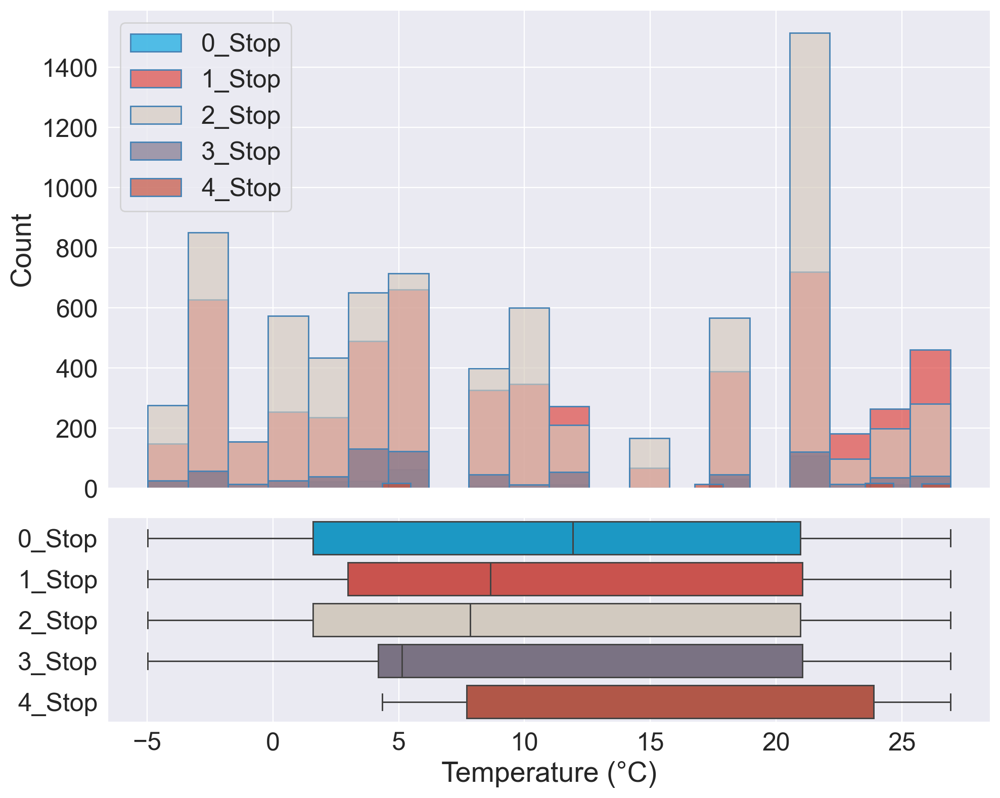

In [30]:
plot_continuous('Temperature (°C)')

* As seen from the plots, over the range of track temperatures and at lower temperatures, 2-stops are more prevelant compared to 1-stops.
* This can be due to the fact that at lower temperatures, cold-graining occurs, and the tyres degrade very fast without the driver being able to extract much performance from it, and so they have to come into the pits for another set of tyres.
* When the track temperatures are higher, it is much easier to fire up the tyres and extract the maximum performance possible from it
* Again, this also depends on how kind a car is on it's tyres.
* 3-stops and 4-stops are circumstantial

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

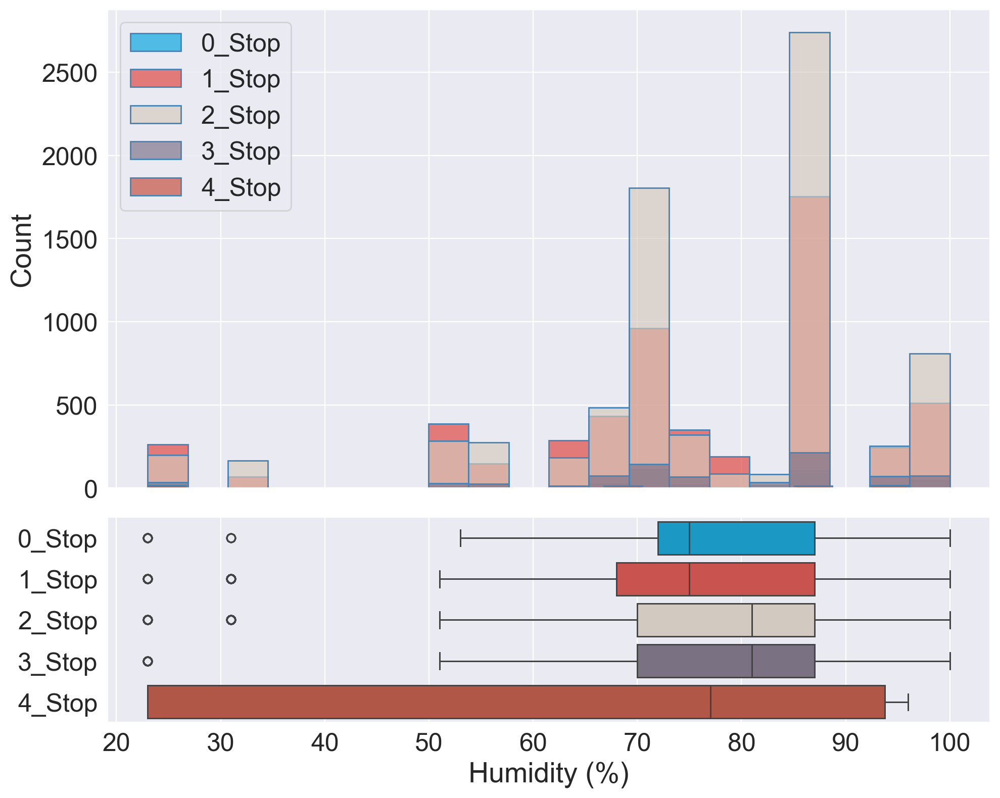

In [31]:
plot_continuous('Humidity (%)')

* From the plot it is evident that when the humidity is below 70%, there is a higher chance of a 1-stop because there is a low chance that there will be any downpour.
* The opposite happens when the humidity is above 70%, which can lead to rain, which therefore leads to higher number of stops.

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_yticklabels(['0_Stop','1_Stop','2_Stop','3_Stop','4_Stop'])
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\1664138167.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_

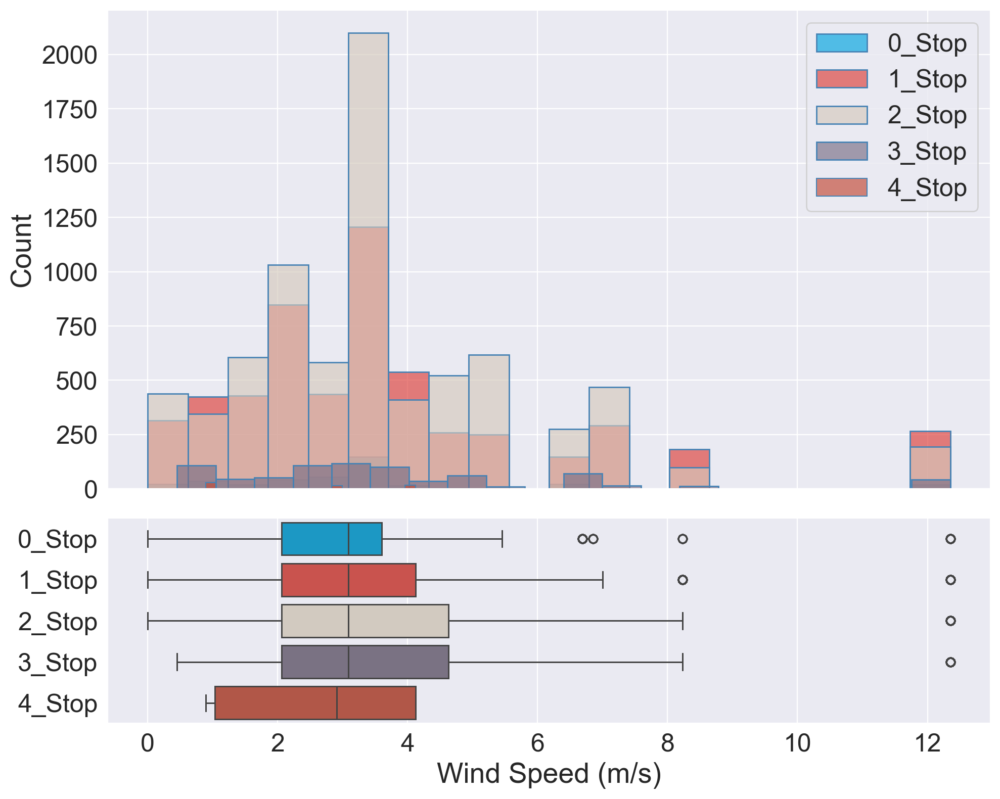

In [32]:
plot_continuous('Wind Speed (m/s)')

* From the plot it is evident that in normal conditions, wind speed doesn't dictate whether it's gonna be a 1 stop, 2 stop or 3 stop.


# Categorical Features


Lets check the count of categories in Status

In [33]:
train_df['Status'].value_counts()

Status
Finished            6831
+1 Lap              2616
+2 Laps              502
Collision            199
Collision damage     140
Accident             130
Engine               122
Retired               98
Gearbox               80
Brakes                55
Power Unit            54
+3 Laps               50
Suspension            38
Disqualified          29
Overheating           26
Undertray             22
Power loss            21
Water pressure        19
Mechanical            18
Oil leak              15
Electronics           15
Hydraulics            15
Radiator              13
Rear wing             13
Puncture              13
+5 Laps               12
Fuel pump             10
Cooling system        10
Spun off              10
Damage                 9
Wheel                  9
Water leak             9
Withdrew               8
+6 Laps                8
Illness                7
Electrical             6
Water pump             6
Turbo                  6
Transmission           5
Wheel nut         

In [34]:
#We can replace the categories that are not Finished, +1 Lap and +2 Lap with DNF(Did Not Finish)
#This will be easier to visualise and for the model to find patterns in data
status_values = train_df['Status'].values
for stat_val in status_values:
  if stat_val not in ['Finished','+1 Lap','+2 Laps']:
    train_df['Status'].replace(stat_val,'DNF',inplace=True)

train_df['Status'].value_counts()

Status
Finished    6831
DNF         4580
+1 Lap      2616
+2 Laps      502
Name: count, dtype: int64

In [35]:
#Since the some categorical values in the features are lengthy let us shorten them to first 2 characters
for feature in ['Race Name','Driver ID']:
  train_df[feature] = train_df[feature].str[:2]
  test_df[feature] = test_df[feature].str[:2]

#For teams let us make it 3 characters, it will be easier to understand
train_df['Constructor Name'] = train_df['Constructor Name'].str[:2]
test_df['Constructor Name'] = test_df['Constructor Name'].str[:2]

test_df[['Race Name','Driver ID','Constructor Name']].head()

,Race Name,Driver ID,Constructor Name
0,Ba,le,Fe
1,Ab,bo,Me
2,Ja,ru,Wi
3,Hu,sa,Wi
4,Hu,ve,As


In [36]:
#let us check the weather values counts
train_df['Weather'].value_counts()

Weather
broken clouds                  3210
clear sky                      2969
overcast clouds                2550
few clouds                     1713
scattered clouds               1208
light rain                      703
mist                            598
light intensity drizzle         587
light intensity shower rain     522
moderate rain                   469
Name: count, dtype: int64

In [37]:
#Let us categorize these values into rain or no rain

no_rain_conditions = ['clear sky','broken clouds','overcast clouds','few clouds','scattered clouds']

train_df['Weather'] = np.where(train_df['Weather'].isin(no_rain_conditions),'No rain','Rain')

train_df['Weather'].value_counts()

Weather
No rain    11650
Rain        2879
Name: count, dtype: int64

In [38]:
categorical

['Year', 'Race Name', 'Driver ID', 'Constructor Name', 'Status', 'Weather']

In [39]:
#Creating a dataframe from categorical features
df_cat = train_df[categorical]

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\4119755032.py:4: UserWarning: The palette list has more values (11) than needed (6), which may not be intended.
  sns.countplot(x=feature,
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\4119755032.py:4: UserWarning: 
The palette list has fewer values (11) than needed (31) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(x=feature,
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\4119755032.py:4: UserWarning: 
The palette list has fewer values (11) than needed (30) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(x=feature,
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\4119755032.py:4: UserWarning: 
The palette list has fewer values (11) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.countplot(x=feature,
C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\4119755032.py:4: UserWarning: The palette list has more values (11) than needed (4), which may no

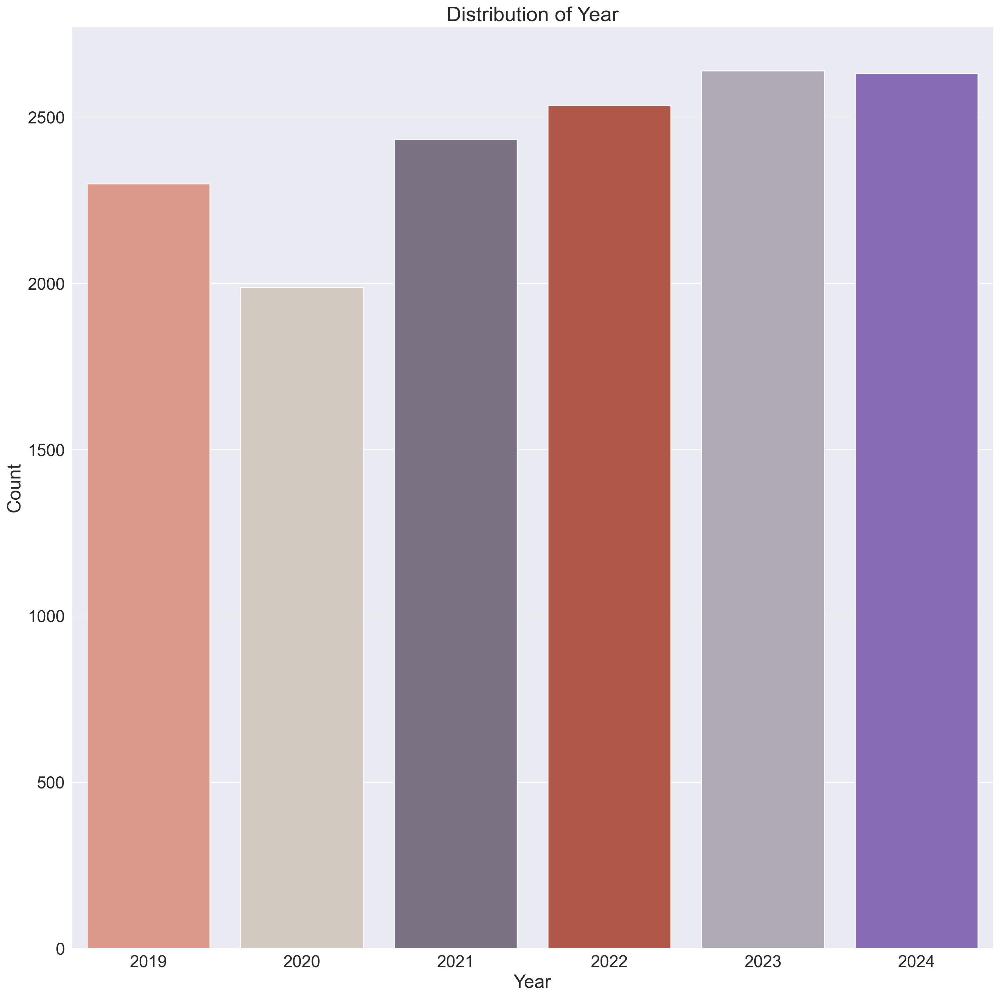

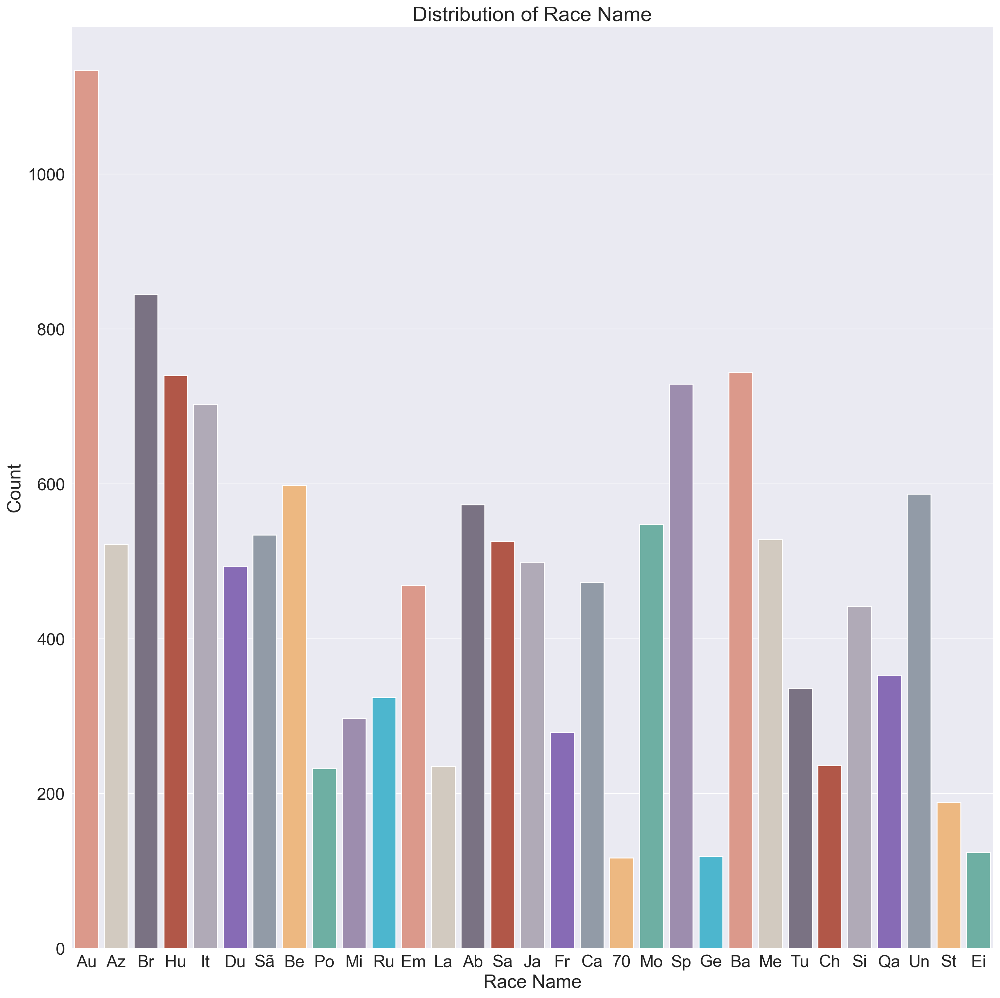

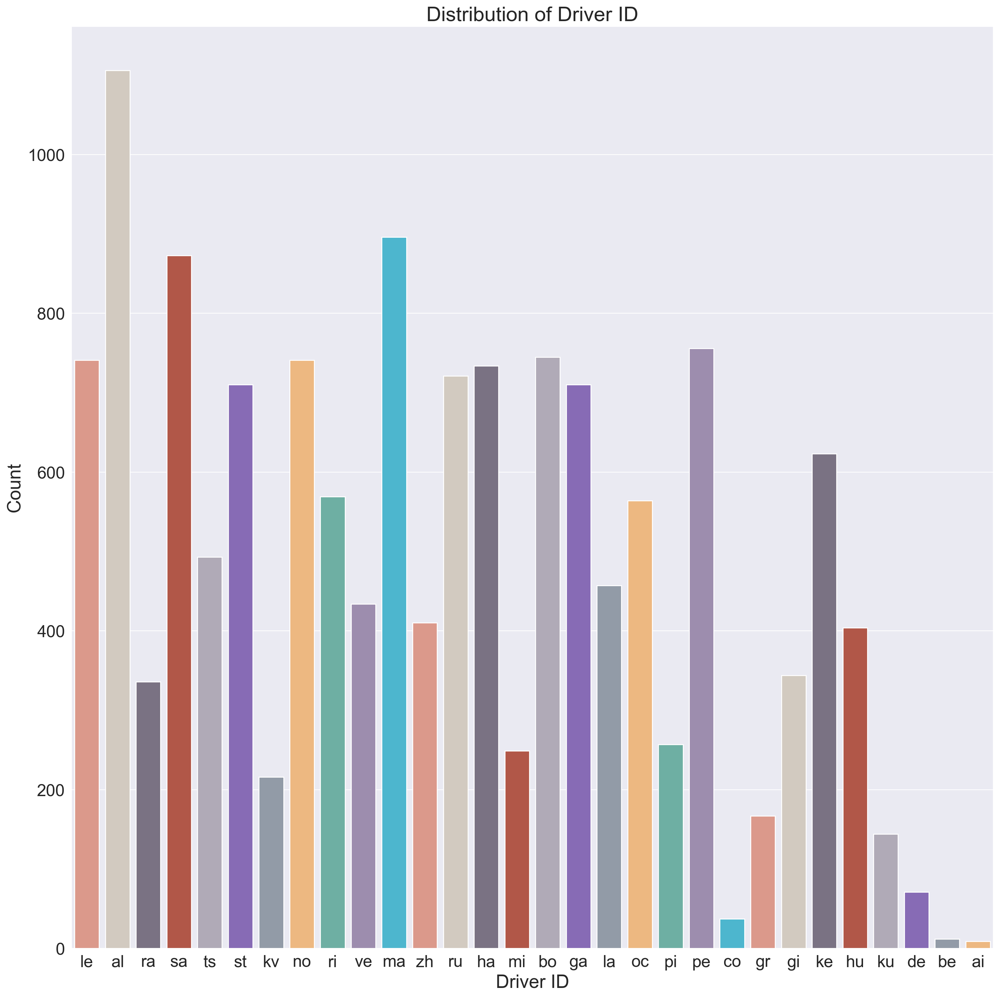

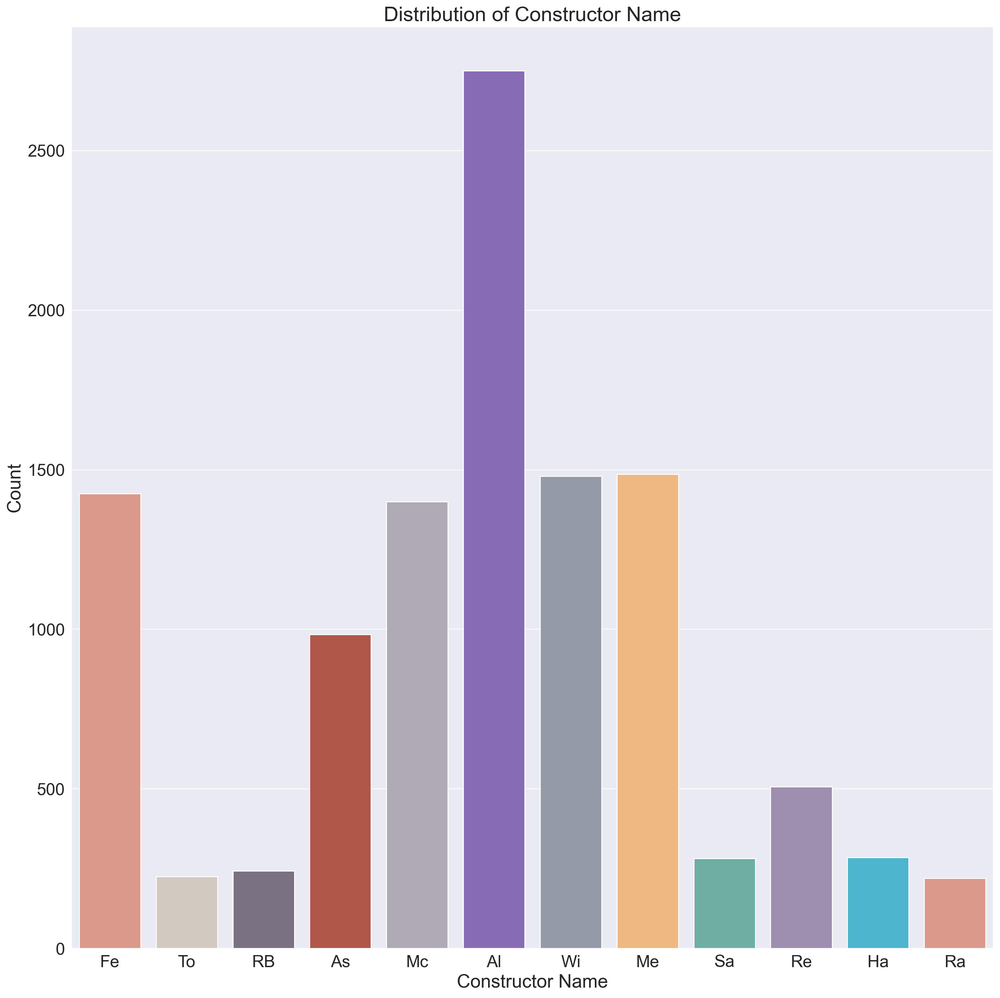

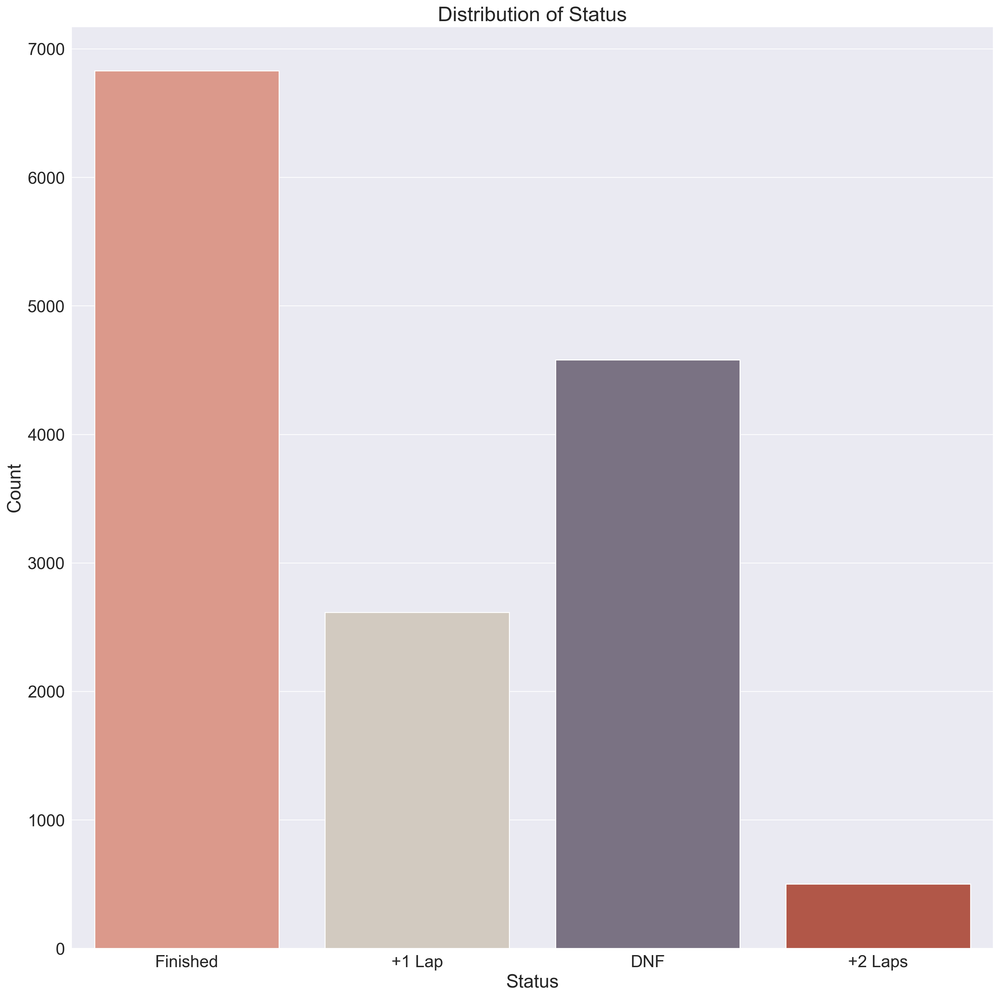

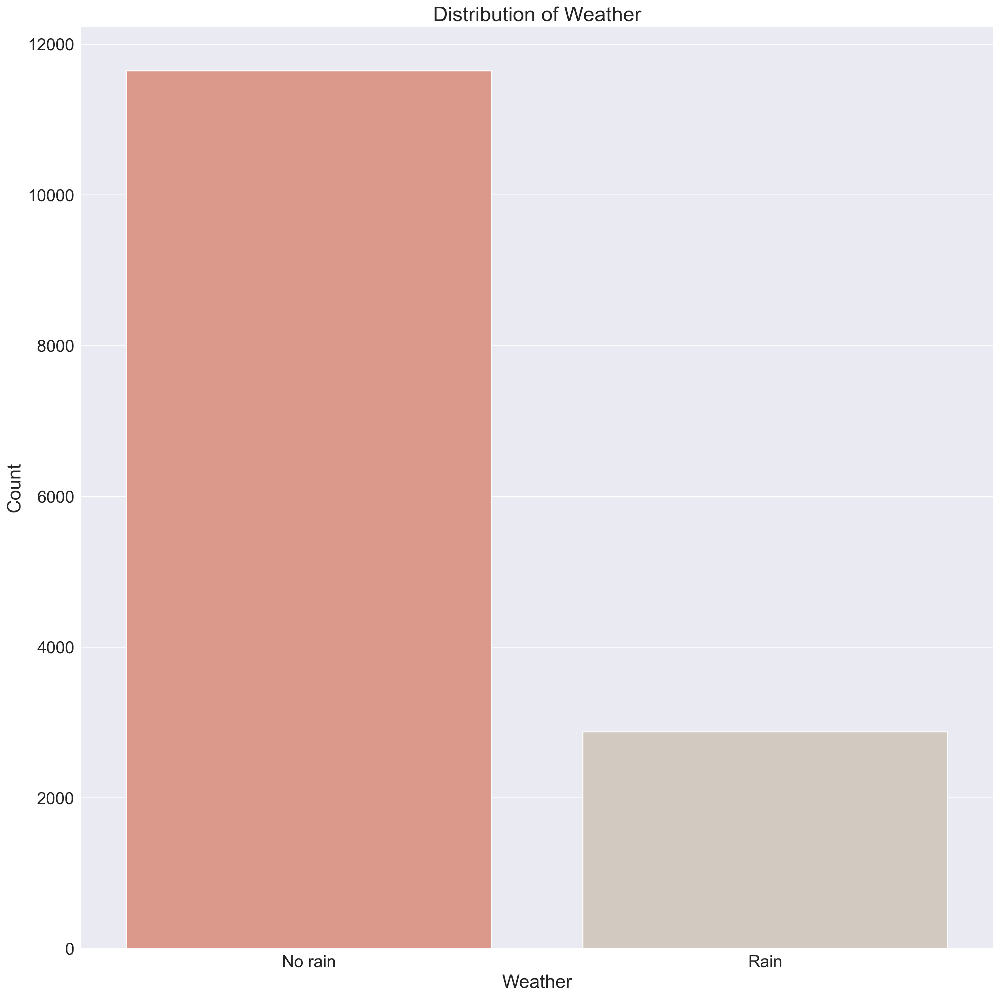

In [40]:
#Visualising the features
for feature in categorical:
  plt.figure(figsize=(15,15))
  sns.countplot(x=feature,
                  data=df_cat,
                  palette=colors_cat)
  plt.title(f'Distribution of {feature}')
  plt.xlabel(feature)
  plt.ylabel('Count')
  plt.tight_layout()

plt.show()

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2001063959.py:3: UserWarning: The palette list has more values (11) than needed (4), which may not be intended.
  sns.countplot(x='Rain (mm)',


<Axes: xlabel='Rain (mm)', ylabel='count'>

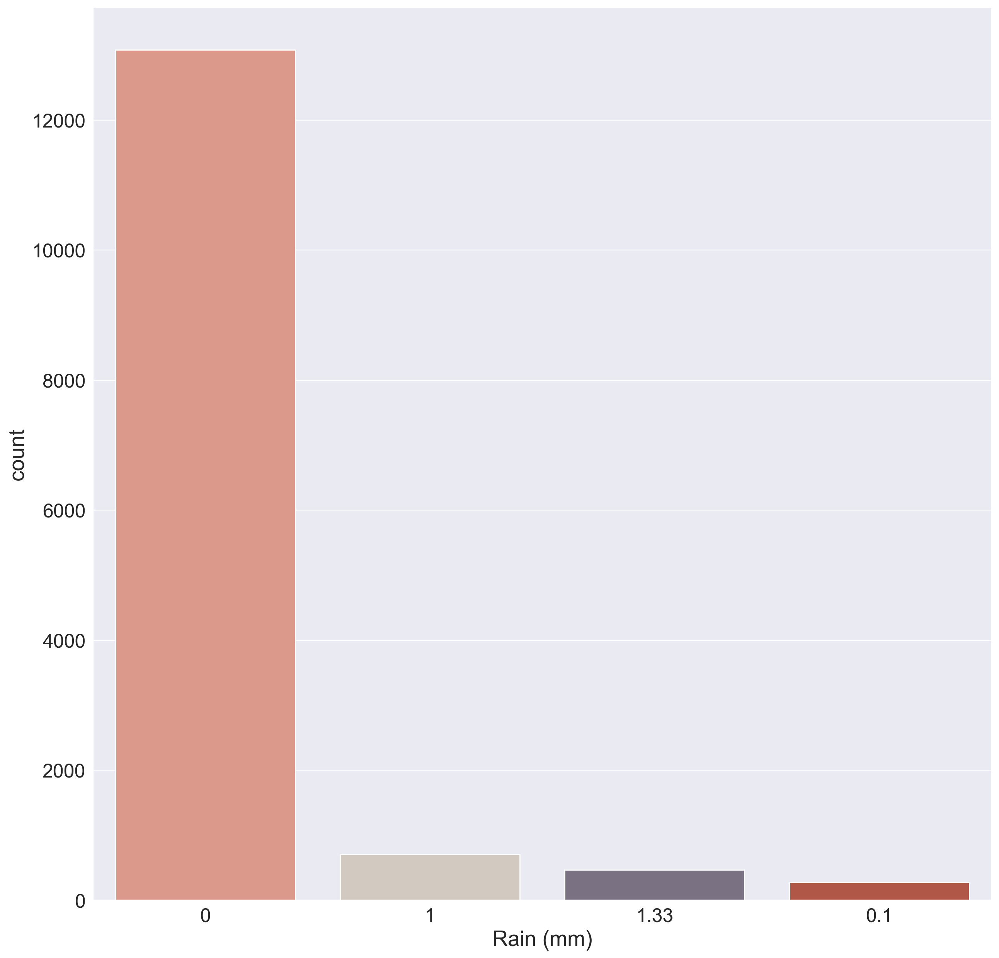

In [41]:
#We said that we would visualise rain as a categorical variable so let's do that
plt.figure(figsize=(15,15))
sns.countplot(x='Rain (mm)',
              data=train_df,
              palette=colors_cat)

* As the years go on we see an increase in the number of races, except 2020 when covid-19 wreaked havoc all over the world. The maximum number of races now in 2024 is 24.
* The count of different grand prix varies differently because the tracks where the races take place keep changing every year and some tracks are kept for another season while the others are not. It all depends on number of years stated in the contract made by the governing body(FiA)
* Similarly, the above can be said for the variation in data based on the driver ID, where the contract is made by the teams
* The variation in team data can be based on the the number of DNF's, whether they left formula 1 like Renault(Re), Sauber(Sa) which changed to Alfa Romeo(Al) and then back to Sauber, Racing Point(Ra) which changed to Aston Martin(As) and Toro Rosso(To) which changed to RB. Red bull was also called RB earlier so the data might have gotten aggregated in the count.
* From the plot on Status, we can say that most of the times, teams finished the race, while some backmarkers were 1 or 2 laps slower. There are a high number of DNF's as well which can be explained by the various failures as stated before.
* Based on the weather data, we can say that majority of the times, it does not rain during the race, so the strategists can most likely stick to the strategy decided previously, but when it rains, it brings a surpise element into play and this can change the pitstop strategy based on what was decided before the race.

Now we will look at the features in greater detail

## Weather

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: The palette list has more values (5) than needed (2), which may not be intended.
  sns.barplot(x=feature,


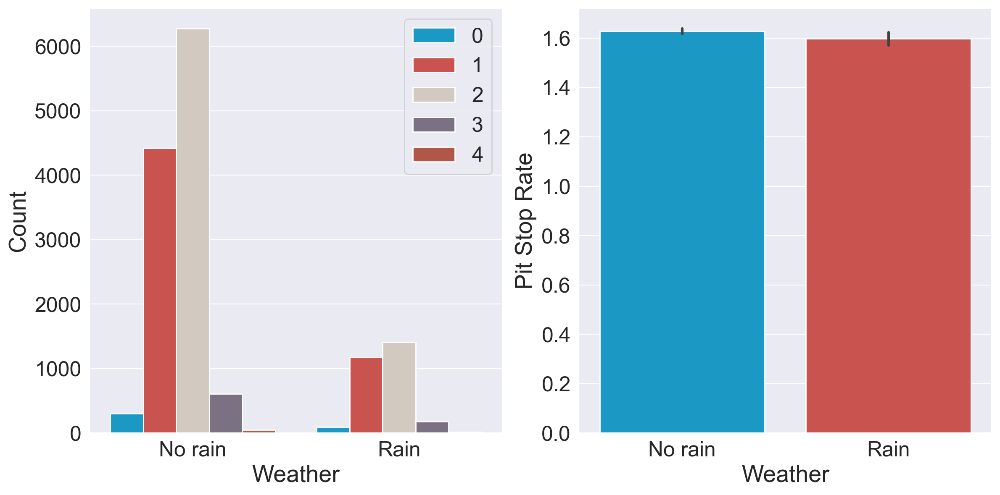

In [42]:
plot_categorical('Weather')

* The pitstop rate is nearly the same regardless of whether it rains or not, which indicates that the number of stops remain around 2 most likely, whereas the difference lies in the type of tyres fitted(Soft,Medium and Hard) in dry conditions and (Wets,Intermediate) in wet conditions.
* Even in the differing conditions, 2 stops are most likely.

## Year

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: 
The palette list has fewer values (5) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=feature,


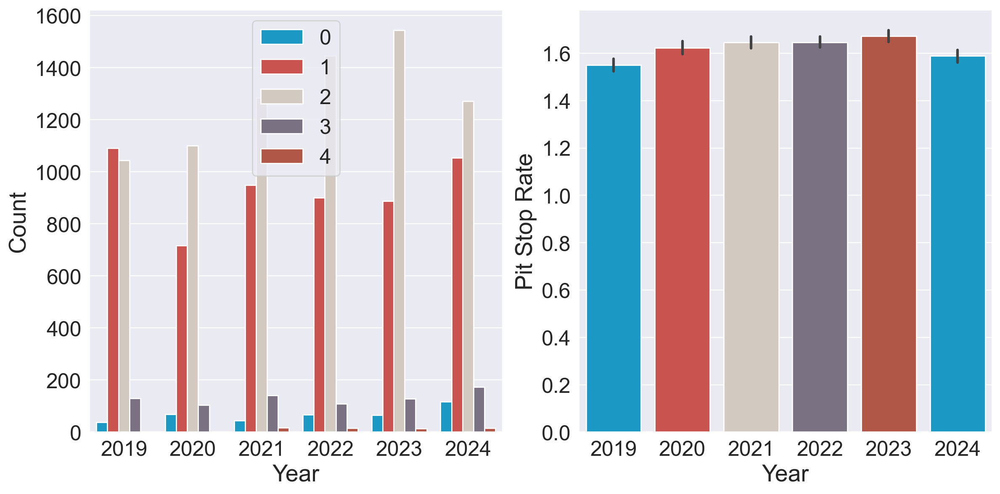

In [43]:
plot_categorical('Year')

* From the plot, we can see that during the 2019 season, 1 stops were more common compared to 2 stops, whereas it's the opposite for the rest of the seasons. This can be due to the track evolution and change in weather over the years, which results in increased tyre degradation over a stint.
* Whereas, the pit stop rates increase every year but there is a slight dip during the 2024 season due to the fact that 1 stop strategies were highly prevalent along with the 2 stop strategies as drivers would use their exceptional skill of managing their tyres and holding on to them for as long as possible

## Constructor Name

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: 
The palette list has fewer values (5) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=feature,


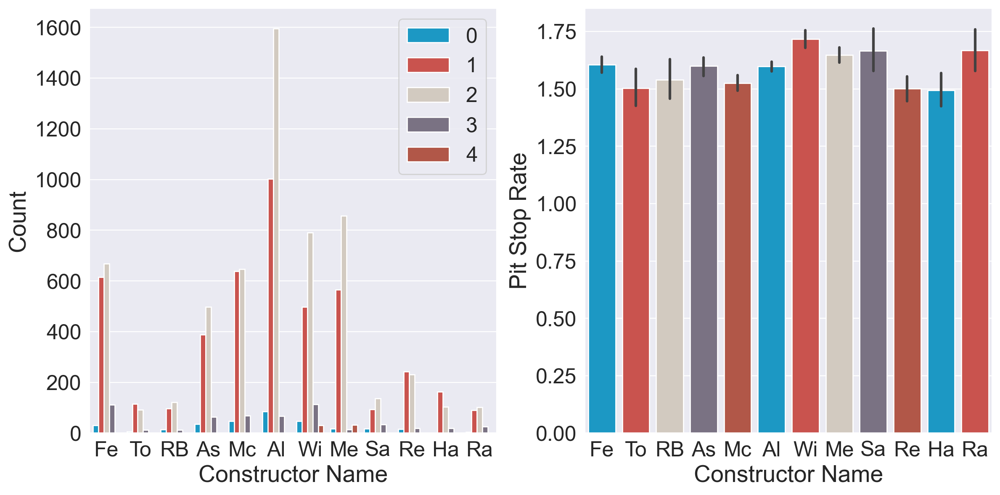

In [44]:
plot_categorical('Constructor Name')

* From the plots we can infer that, the pitstop strategy differs from team to team as some teams prefer having fewer stops while some prefer having more stops, this can be due to the reason that they tailor a pit-stop strategy in accordance with the performance of their car, as some cars are kind on their tyres while some are not.

## Status

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.barplot(x=feature,


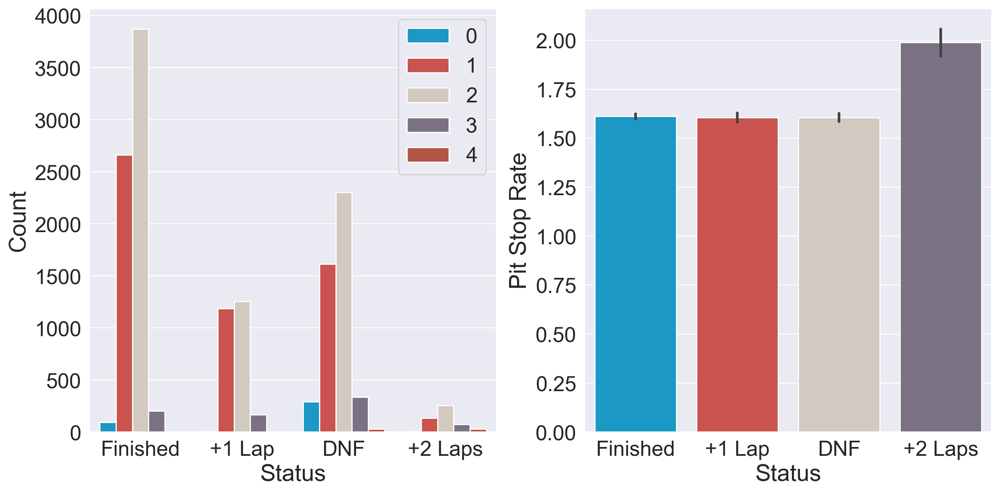

In [45]:
plot_categorical('Status')

* As obvious as it can be those teams who don't have the pace and do 2 pitstops will definitely end up laps behind when the race is over


## Rain

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.barplot(x=feature,


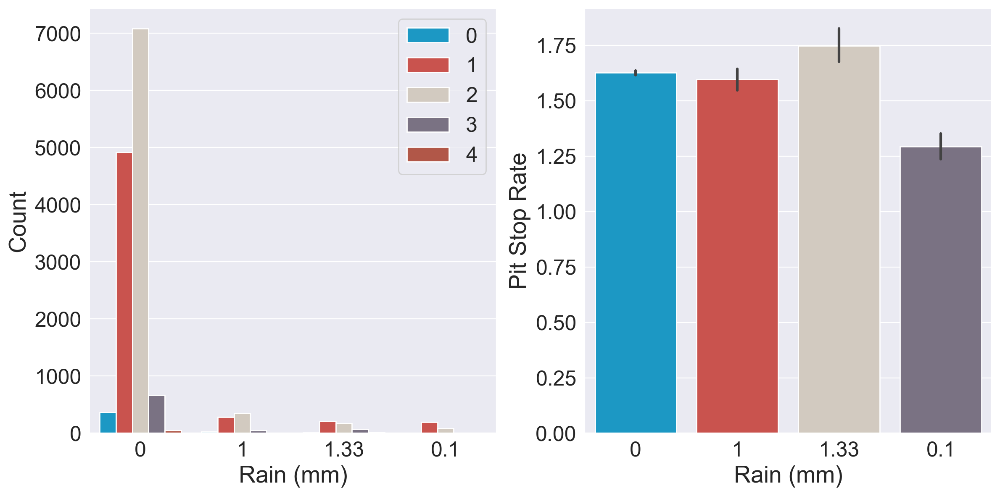

In [46]:
plot_categorical('Rain (mm)')

* Here, when it rains the chances of the race being a 1-stop decreases, this is evident from the distribution

## Race Name

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: 
The palette list has fewer values (5) than needed (19) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=feature,


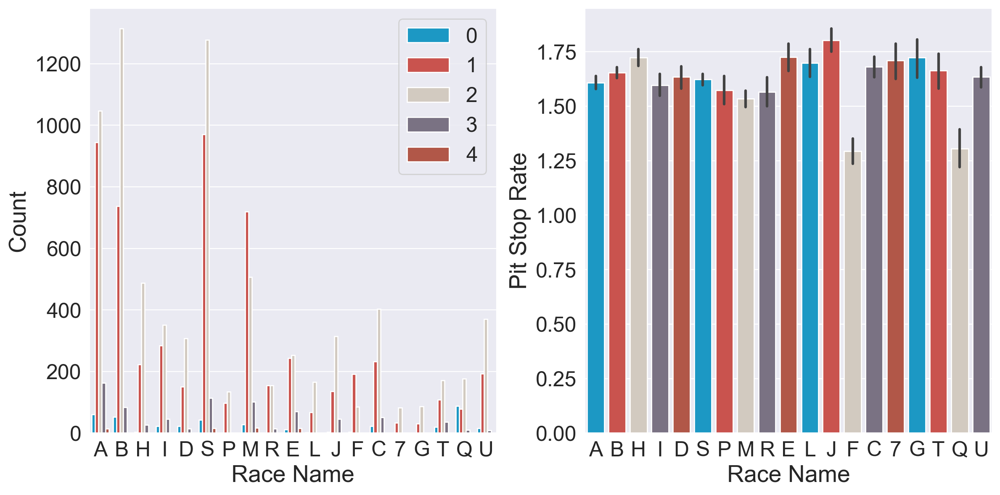

In [47]:
plot_categorical('Race Name')

* The race names are reduced to single letters to prevent clutter
* As we can see, in majority of the races 2 stops are the way to go
* This can be attributed to increased tyre degradation on tracks over the years, due to change in weather conditions

## Driver ID

C:\Users\NATHAN\AppData\Local\Temp\ipykernel_836\2705520882.py:23: UserWarning: 
The palette list has fewer values (5) than needed (17) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x=feature,


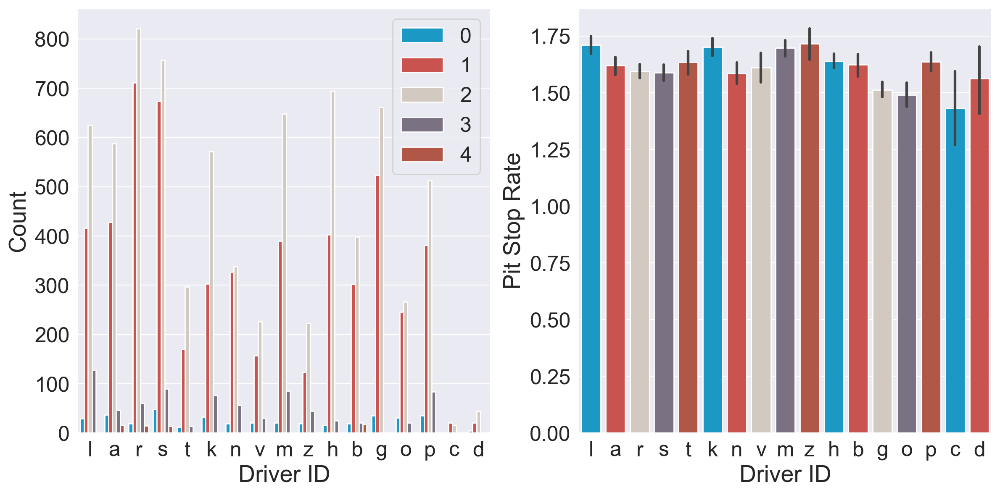

In [48]:
plot_categorical('Driver ID')

Since the Driver pitstop strategy depends on the team, which is visualised above, we will come to the same conclusion as before.

Now, we will perform Chi-2 test to check the correlation between categorical features and their importance with respect to the target feature

In [49]:
chi2_array,p_array = [],[]
categorical.append('Rain (mm)')
for column in categorical:

  crosstab = pd.crosstab(train_df[column],train_df['Pit Stops'])

  chi2,p,dof,expected = chi2_contingency(crosstab)

  chi2_array.append(chi2)
  p_array.append(p)

df_chi = pd.DataFrame({
    'Feature':categorical,
    'Chi2':chi2_array,
    'P-Value':p_array
})

df_chi.sort_values(by='Chi2',ascending=True,inplace=True)
df_chi.reset_index(drop=True,inplace=True)
df_chi


,Feature,Chi2,P-Value
0,Weather,24.564670,6.153526e-05
1,Year,227.474705,3.831007e-37
2,Rain (mm),335.691536,1.458589e-64
3,Constructor Name,555.626330,9.811584e-90
4,Driver ID,951.290258,3.038310e-131
5,Status,1088.980483,1.366662e-225
6,Race Name,2245.211308,0.000000e+00


* Here, we see that the chi2 values are very high which indicates a strong association between feature and target variable
* The p-values are low which indicate that there is high correlation between the features
* We cannot take action now as the low p-values could be caused by outliers or class imbalances
* Ahead, when we perform feature selection, we will then check whether the relevance of these features has changed

# DateTime Features

Now, we will analyse the datetime variables

In [50]:
train_df.head()

,Year,Race Name,Driver ID,Lap Time,Constructor Name,Grid Position,Final Position,Fastest Lap Time,Points,Status,Number of Laps,Lap,Duration,Date,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2024,Au,le,1:22.519,Fe,4.0,2.0,1:19.813,19.0,Finished,58.0,34.0,17.308,2024-03-24,No rain,17.76,67,0.89,0,2
1,2019,Az,al,1:51.021,To,11.0,11.0,1:45.754,0.0,+1 Lap,50.0,12.0,20.720,2019-04-28,Rain,4.97,75,12.35,0,1
2,2020,Br,ra,2:05.243,NaN,NaN,NaN,NaN,NaN,DNF,NaN,47.0,44.085,2020-08-02,No rain,4.18,97,2.28,0,2
3,2022,Hu,sa,1:23.354,Fe,2.0,4.0,1,12.0,Finished,70.0,17.0,22.820,2022-07-31,No rain,1.26,70,3.09,0,1
4,2024,Au,ts,1:23.434,RB,8.0,7.0,1:21.134,6.0,Finished,58.0,36.0,17.535,2024-03-24,No rain,17.76,67,0.89,0,2


In [51]:
#Since regulations change every year, we analysed year as a categorical feature
date_time = ['Lap Time','Fastest Lap Time','Date']

#Converting Date to Datetime object
train_df['Date'] = pd.to_datetime(train_df['Date'])

### Visualisations

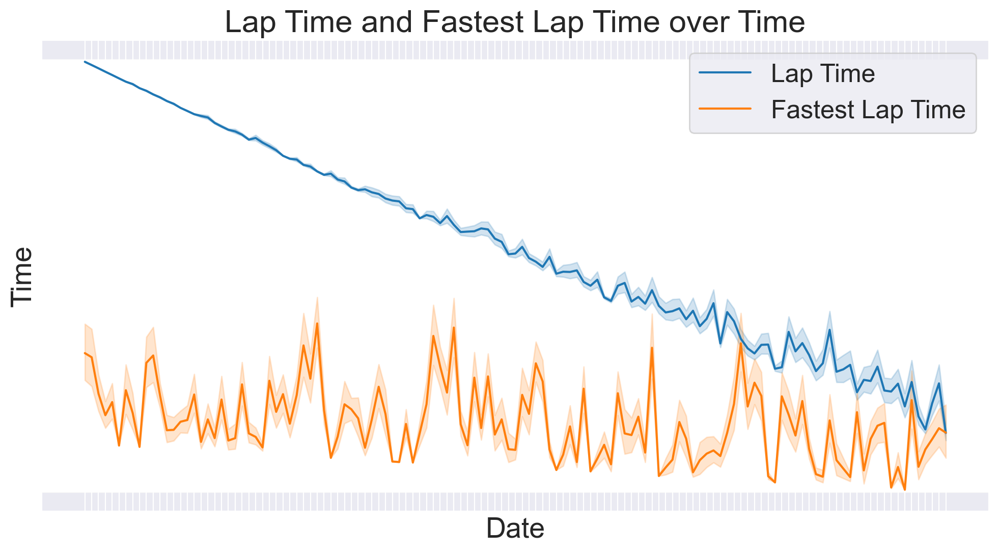

In [52]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Date', y='Lap Time', data=df, label='Lap Time')
sns.lineplot(x='Date', y='Fastest Lap Time', data=df, label='Fastest Lap Time')
plt.title('Lap Time and Fastest Lap Time over Time')
plt.xlabel('Date')
plt.ylabel('Time')
plt.legend()

# Remove all y-axis labels except for "Time"
ax = plt.gca()  # Get the current axes
for label in ax.get_yticklabels():
    if label.get_text() != 'Time':  # Keep only "Time" label
        label.set_visible(False)

# Remove all x-axis labels except for "Date"
for label in ax.get_xticklabels():
    if label.get_text() != 'Date':  # Keep only "Date" label
        label.set_visible(False)

plt.show()

* As we can see, the fastest lap time oscillates over time, so there is not much info that we can get from it other than that it depends on the driver and car performance related to the track
* But Lap Time follows a downward trend,this can be attributed to change in regulations every year which results in improving fuel efficiency and sustainability and increased aerodynamic performance

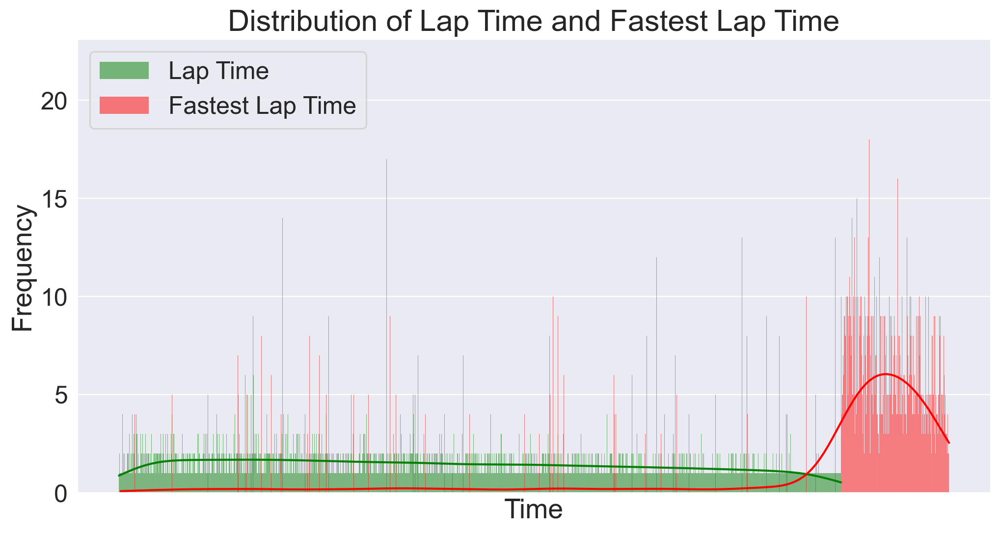

In [53]:

plt.figure(figsize=(12, 6))
sns.histplot(train_df['Lap Time'], label='Lap Time', kde=True, color='green')
sns.histplot(train_df['Fastest Lap Time'], label='Fastest Lap Time', kde=True, color='red')
plt.title('Distribution of Lap Time and Fastest Lap Time')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()

# Remove x-axis labels except for 'Time'
plt.xticks([])  # This removes all x-axis ticks and labels
plt.xlabel('Time')  # This adds back the 'Time' label

plt.show()

* Lap time follows a uniform distribution, so we can't get much info from this plot
* Fastest Lap Time follows a skewed gaussian distribution, which is not tail-ended, which indicates that there are a huge number of outliers
* That will be fixed using either square-root or log transformation

### Analysis

In [54]:
#Lets view some of the stats of the datetime features
df[['Date','Lap Time','Fastest Lap Time']].describe()

,Date,Lap Time,Fastest Lap Time
count,18162,18162,13966
unique,127,11430,1844
top,2021-08-01,2:08.743,1:21.645
freq,192,7,28


Date by itself does'nt provide any info so we can drop it

In [55]:
train_df.drop('Date',axis=1,inplace=True)

# Data Preprocessing

Data Preprocessing is the process of converting raw data into a well-readable format that is suitable for building and training machine learning models


## Handling Missing Values

In [56]:
#Let's check the percentage of missing values in the train set
missing_train = train_df.isnull().sum().sort_values(ascending=False)
missing_train_percent = ((train_df.isnull().sum()*100)/train_df.shape[0]).sort_values(ascending=False)
missing_train_df = pd.concat([missing_train,missing_train_percent],axis=1,keys=['Missing Values','Missing Values Percent'])
missing_train_df.head(15).style.background_gradient(cmap='Blues',axis=0)

,Missing Values,Missing Values Percent
Fastest Lap Time,3375,23.229403
Constructor Name,3243,22.320875
Grid Position,3243,22.320875
Final Position,3243,22.320875
Points,3243,22.320875
Number of Laps,3243,22.320875
Duration,420,2.890770
Lap,399,2.746232
Year,0,0.000000
Temperature (°C),0,0.000000


In [57]:
missing_test = test_df.isnull().sum().sort_values(ascending=False)
missing_test_percent = ((test_df.isnull().sum())*100/test_df.shape[0]).sort_values(ascending=False)
missing_test_df = pd.concat([missing_test,missing_test_percent],axis=1,keys=['Missing Values','Missing Values Percent'])
missing_test_df.head(15).style.background_gradient(cmap='Reds',axis=0)

,Missing Values,Missing Values Percent
Fastest Lap Time,821,22.598404
Number of Laps,781,21.497385
Constructor Name,781,21.497385
Grid Position,781,21.497385
Final Position,781,21.497385
Points,781,21.497385
Status,781,21.497385
Duration,96,2.642444
Lap,92,2.532342
Latitude,0,0.000000


### Fastest Lap Time

In [58]:
#Creating a function to convert lap time in seconds
def convert_to_seconds(lap_time):
  try:
    if pd.isna(lap_time):
      return np.nan
    minutes, seconds = lap_time.split(':')
    return int(minutes) * 60 + float(seconds)
  except ValueError:
    return np.nan #Handle Invalid Formats


In [59]:
#Applying the conversion to the columns
train_df['Fastest Lap Time'] = train_df['Fastest Lap Time'].apply(convert_to_seconds)
test_df['Fastest Lap Time'] = test_df['Fastest Lap Time'].apply(convert_to_seconds)
train_df['Lap Time'] = train_df['Lap Time'].apply(convert_to_seconds)
test_df['Lap Time'] = test_df['Lap Time'].apply(convert_to_seconds)

In [60]:
train_df.head()

,Year,Race Name,Driver ID,Lap Time,Constructor Name,Grid Position,Final Position,Fastest Lap Time,Points,Status,Number of Laps,Lap,Duration,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2024,Au,le,82.519,Fe,4.0,2.0,79.813,19.0,Finished,58.0,34.0,17.308,No rain,17.76,67,0.89,0,2
1,2019,Az,al,111.021,To,11.0,11.0,105.754,0.0,+1 Lap,50.0,12.0,20.720,Rain,4.97,75,12.35,0,1
2,2020,Br,ra,125.243,NaN,NaN,NaN,NaN,NaN,DNF,NaN,47.0,44.085,No rain,4.18,97,2.28,0,2
3,2022,Hu,sa,83.354,Fe,2.0,4.0,NaN,12.0,Finished,70.0,17.0,22.820,No rain,1.26,70,3.09,0,1
4,2024,Au,ts,83.434,RB,8.0,7.0,81.134,6.0,Finished,58.0,36.0,17.535,No rain,17.76,67,0.89,0,2


In [61]:
#Getting the mean fastest lap time as it doesnt vary much each year
train_flt = train_df.groupby('Race Name')['Fastest Lap Time'].mean()

In [62]:
train_flt

Race Name
70     90.474220
Ab     93.452185
Au     74.710445
Az    106.541413
Ba     95.491251
Be    109.544342
Br     88.496556
Ca     77.102774
Ch     98.508534
Du     74.878613
Ei     90.921099
Em     79.722505
Fr     97.240143
Ge     80.720944
Hu     81.824741
It     84.752777
Ja     98.898561
La     96.772245
Me     81.223916
Mi     92.203288
Mo     76.415121
Po     81.284090
Qa     85.970471
Ru     98.766205
Sa     93.115869
Si    103.114152
Sp     81.517606
St     68.991400
Sã     76.403198
Tu     93.853022
Un    100.406450
Name: Fastest Lap Time, dtype: float64

In [63]:
#We see that the Sakhir grand prix has NaN value since it only has been held once
train_flt.fillna(55.404,inplace=True) #Fastest lap as per record

In [64]:
#Imputing the missing values
for race in train_flt.index:
  train_df.loc[train_df['Race Name'] == race, 'Fastest Lap Time'] = train_df.loc[train_df['Race Name'] == race, 'Fastest Lap Time'].fillna(train_flt[race])
  test_df.loc[test_df['Race Name'] == race, 'Fastest Lap Time'] = test_df.loc[test_df['Race Name'] == race, 'Fastest Lap Time'].fillna(train_flt[race])

### Number of Laps

In [65]:
#Getting the median number of Laps according to the race as they represent
# the data better(some races have less laps due to rain or delay)
train_lap = train_df.groupby('Race Name')['Number of Laps'].median()

In [66]:
train_lap

Race Name
70    52.0
Ab    57.0
Au    70.0
Az    51.0
Ba    57.0
Be    44.0
Br    52.0
Ca    70.0
Ch    56.0
Du    72.0
Ei    60.0
Em    63.0
Fr    53.0
Ge    64.0
Hu    69.0
It    53.0
Ja    51.0
La    50.0
Me    70.0
Mi    57.0
Mo    77.0
Po    65.0
Qa    57.0
Ru    53.0
Sa    50.0
Si    61.0
Sp    65.0
St    70.0
Sã    70.0
Tu    58.0
Un    56.0
Name: Number of Laps, dtype: float64

In [67]:
#Imputing the values
for race in train_lap.index:
  train_df.loc[train_df['Race Name'] == race, 'Number of Laps'] = train_df.loc[train_df['Race Name'] == race, 'Number of Laps'].fillna(train_lap[race])
  test_df.loc[test_df['Race Name'] == race, 'Number of Laps'] = test_df.loc[test_df['Race Name'] == race, 'Number of Laps'].fillna(train_lap[race])


In [68]:
print(train_df['Number of Laps'].isnull().sum())
print(test_df['Number of Laps'].isnull().sum())

0
0


### Constructor Name

In [69]:
#Since, teams change drivers all the time, so we will impute a new Category 'Unknown'
train_df['Constructor Name'].fillna('Unknown',inplace=True)
test_df['Constructor Name'].fillna('Unknown',inplace=True)

In [70]:
train_df['Constructor Name'].isnull().sum()

0

In [71]:
test_df['Constructor Name'].isnull().sum()

0

### Grid Position

In [72]:
#We will use KNN imputation here to get impute missing values using similar data points
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)

train_df[['Grid Position']] = imputer.fit_transform(train_df[['Grid Position']])
test_df[['Grid Position']] = imputer.transform(test_df[['Grid Position']])

In [73]:
#Checking for missing values
print(train_df['Grid Position'].isnull().sum())
print(test_df['Grid Position'].isnull().sum())

0
0


### Final Position

In [74]:
#Similarly, we will use KNN Imputation here as well
train_df[['Final Position']] = imputer.fit_transform(train_df[['Final Position']])
test_df[['Final Position']] = imputer.transform(test_df[['Final Position']])

In [75]:
print(train_df['Final Position'].isnull().sum())
print(test_df['Final Position'].isnull().sum())

0
0


### Points

In [76]:
#Similarly, KNN Imputation will be used here
train_df[['Points']] = imputer.fit_transform(train_df[['Points']])
test_df[['Points']] = imputer.transform(test_df[['Points']])

In [77]:
print(train_df['Points'].isnull().sum())
print(test_df['Points'].isnull().sum())

0
0


### Duration

In [78]:
#We will use SimpleImputer and set the strategy to median for pitstop durations
#As they are of nearly the same duration with very few exceptions
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')
#Converting duration to numeric
train_df['Duration'] = pd.to_numeric(train_df['Duration'], errors='coerce')
test_df['Duration'] = pd.to_numeric(test_df['Duration'], errors='coerce')

train_df[['Duration']] = imputer.fit_transform(train_df[['Duration']])
test_df[['Duration']] = imputer.transform(test_df[['Duration']])

In [79]:
print(train_df['Duration'].isnull().sum())
print(test_df['Duration'].isnull().sum())

0
0


### Lap

In [80]:
#For imputation, we will use ffill method
train_df['Lap'].fillna(method='ffill',inplace=True)
test_df['Lap'].fillna(method='ffill',inplace=True)

In [81]:
print(train_df['Lap'].isnull().sum())
print(test_df['Lap'].isnull().sum())

0
0


### Now Checking for missing values

In [82]:
#For the training set
missing_train_new = train_df.isnull().sum().sort_values(ascending=False)
missing_train_percent_new = ((train_df.isnull().sum()*100)/train_df.shape[0]).sort_values(ascending=False)
missing_train_df_new = pd.concat([missing_train_new,missing_train_percent_new],axis=1,keys=['Missing Values','Missing Values Percent'])
missing_train_df_new.head(15).style.background_gradient(cmap='Blues',axis=0)

,Missing Values,Missing Values Percent
Year,0,0.000000
Number of Laps,0,0.000000
Rain (mm),0,0.000000
Wind Speed (m/s),0,0.000000
Humidity (%),0,0.000000
Temperature (°C),0,0.000000
Weather,0,0.000000
Duration,0,0.000000
Lap,0,0.000000
Status,0,0.000000


In [83]:
#For the test set
missing_test_new = test_df.isnull().sum().sort_values(ascending=False)
missing_test_percent_new = ((test_df.isnull().sum()*100)/test_df.shape[0]).sort_values(ascending=False)
missing_test_df_new = pd.concat([missing_test_new,missing_test_percent_new],axis=1,keys=['Missing Values','Missing Values Percent'])
missing_test_df_new.head(15).style.background_gradient(cmap='Reds',axis=0)

,Missing Values,Missing Values Percent
Status,781,21.497385
Year,0,0.000000
Lap,0,0.000000
Rain (mm),0,0.000000
Wind Speed (m/s),0,0.000000
Humidity (%),0,0.000000
Temperature (°C),0,0.000000
Weather,0,0.000000
Longitude,0,0.000000
Latitude,0,0.000000


Status will be filled when feature engineering,i.e, values converted to Finished, +1 Lap, +2 Lap and DNF will be performed on it for the test set

### Peforming Log and Square Root Transformation

Log transformation is harsh and will be performed on features that are highly skewed whereas square-root transformation is comparitively less harsh and will be performed on features that are moderately skewed. This is done to make the distributions as close to gaussian distributions as possible and to reduce the number of outliers

In [84]:
#Performing log transformation on Fastest Lap Time, Humidity, Lap and Number of Laps
train_df['Fastest Lap Time'] = np.log(train_df['Fastest Lap Time'])
train_df['Humidity (%)'] = np.log(train_df['Humidity (%)'])
train_df['Lap'] = np.log(train_df['Lap'])
train_df['Number of Laps'] = np.log(train_df['Number of Laps'])

#Performing square root transformation on Wind Speed
train_df['Wind Speed (m/s)'] = np.sqrt(train_df['Wind Speed (m/s)'])

## Outliers

In [85]:
#We will detect and remove outliers by calculating the Inter-quartile range for all numeric features
#And then replacing the data points beyond the upper and lower bound with the median
Q1 = train_df[['Lap Time','Fastest Lap Time','Grid Position','Final Position','Points','Lap','Number of Laps','Duration','Temperature (°C)','Humidity (%)','Wind Speed (m/s)']].quantile(0.25)
Q3 = train_df[['Lap Time','Fastest Lap Time','Grid Position','Final Position','Points','Lap','Number of Laps','Duration','Temperature (°C)','Humidity (%)','Wind Speed (m/s)']].quantile(0.75)
IQR = Q3 - Q1

upper_bound = Q3 + 1.5*IQR
lower_bound = Q1 - 1.5*IQR

#Replacing the outliers with the median
for feature in ['Lap Time','Fastest Lap Time','Grid Position','Final Position','Points','Lap','Number of Laps','Duration','Temperature (°C)','Humidity (%)','Wind Speed (m/s)']:
  median = train_df[feature].median()
  train_df[feature] = np.where((train_df[feature] > upper_bound[feature]) | (train_df[feature] < lower_bound[feature]), median , train_df[feature])

# Feature Engineering

Here, as previously discussed, new features will be created and some features will be binned

In [86]:
#Creating Positions Gained for the training set from Grid Position and Final Position
train_df['Positions Gained'] = train_df['Final Position'] - train_df['Grid Position']

#Creating Points Gained as a categorical feature with 1 if gained and 0 if not gained
train_df['Points Gained'] = np.where((train_df['Final Position']>=10) & (train_df['Positions Gained']>0),1,0)

#Now we will bin the features as discussed before(they will be divided according to the quartiles they belong to)
train_df['Wind Speed (m/s)'] = pd.qcut(train_df['Wind Speed (m/s)'],q=3,labels=['Low','Medium','High'])
train_df['Temperature (°C)'] = pd.qcut(train_df['Temperature (°C)'],q=3,labels=['Low','Medium','High'])
train_df['Humidity (%)'] = pd.qcut(train_df['Humidity (%)'],q=3,labels=['Low','Medium','High'])


In [87]:
#Lets view the dataframe
train_df.head()

,Year,Race Name,Driver ID,Lap Time,Constructor Name,Grid Position,Final Position,Fastest Lap Time,Points,Status,Number of Laps,Lap,Duration,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops,Positions Gained,Points Gained
0,2024,Au,le,82.519,Fe,4.000000,2.000000,4.379686,4.00000,Finished,4.060443,3.526361,17.308,No rain,Medium,Low,Low,0,2,-2.000000,0
1,2019,Az,al,111.021,To,11.000000,11.000000,4.661116,0.00000,+1 Lap,3.912023,2.484907,20.720,Rain,Medium,Medium,Medium,0,1,0.000000,0
2,2020,Br,ra,125.243,Unknown,10.088074,10.350877,4.482964,4.87006,DNF,3.951244,3.850148,23.715,No rain,Low,High,Low,0,2,0.262803,1
3,2022,Hu,sa,83.354,Fe,2.000000,4.000000,4.404580,12.00000,Finished,4.248495,2.833213,22.820,No rain,Low,Low,Medium,0,1,2.000000,0
4,2024,Au,ts,83.434,RB,8.000000,7.000000,4.396102,6.00000,Finished,4.060443,3.583519,17.535,No rain,Medium,Low,Low,0,2,-1.000000,0


In [88]:
#Grid Position, Final Position and Points can be dropped as new features are created using them
train_df.drop(['Grid Position','Final Position','Points'],axis=1,inplace=True)

In [89]:
train_df.head()

,Year,Race Name,Driver ID,Lap Time,Constructor Name,Fastest Lap Time,Status,Number of Laps,Lap,Duration,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops,Positions Gained,Points Gained
0,2024,Au,le,82.519,Fe,4.379686,Finished,4.060443,3.526361,17.308,No rain,Medium,Low,Low,0,2,-2.000000,0
1,2019,Az,al,111.021,To,4.661116,+1 Lap,3.912023,2.484907,20.720,Rain,Medium,Medium,Medium,0,1,0.000000,0
2,2020,Br,ra,125.243,Unknown,4.482964,DNF,3.951244,3.850148,23.715,No rain,Low,High,Low,0,2,0.262803,1
3,2022,Hu,sa,83.354,Fe,4.404580,Finished,4.248495,2.833213,22.820,No rain,Low,Low,Medium,0,1,2.000000,0
4,2024,Au,ts,83.434,RB,4.396102,Finished,4.060443,3.583519,17.535,No rain,Medium,Low,Low,0,2,-1.000000,0


# Encoding Categorical Features

Machine learning algorithms usually require all input and output features as numeric, with encoding we will convert the categorical features into numeric.

The features that require encoding are:

* Race Name
* Driver ID
* Constructor Name
* Status
* Weather
* Temperature
* Humidity
* Wind Speed

In [90]:
#Ordinal encoding(order wise) for Temperature, Humidity and Wind Speed
from sklearn.preprocessing import OrdinalEncoder
encoder_ord = OrdinalEncoder()
encoder_ord.fit(train_df[['Temperature (°C)','Humidity (%)','Wind Speed (m/s)']])
train_df[['Temperature (°C)','Humidity (%)','Wind Speed (m/s)']] = encoder_ord.transform(train_df[['Temperature (°C)','Humidity (%)','Wind Speed (m/s)']])

#One-Hot Encoding (binary) for Weather
from sklearn.preprocessing import OneHotEncoder
encoder_ohe = OneHotEncoder(drop='first',sparse_output=False)
encoder_ohe.fit(train_df[['Weather']])
train_df['Weather'] = encoder_ohe.transform(train_df[['Weather']])

# For these columns we will apply frequency encoding as they have
# a large number of categories
freq_columns = ['Race Name', 'Driver ID', 'Constructor Name', 'Status']

# Apply frequency encoding to each categorical column
for column in freq_columns:
    # Get the frequency of each category in the column
    freq_encoding = train_df[column].value_counts().to_dict()

    # Map the frequency of each category to the column
    train_df[column + ' encoded'] = train_df[column].map(freq_encoding)

In [91]:
#We can drop the non-encoded original features
train_df.drop(freq_columns,axis=1,inplace=True)

In [92]:
train_df.head()

,Year,Lap Time,Fastest Lap Time,Number of Laps,Lap,Duration,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops,Positions Gained,Points Gained,Race Name encoded,Driver ID encoded,Constructor Name encoded,Status encoded
0,2024,82.519,4.379686,4.060443,3.526361,17.308,0.0,2.0,1.0,1.0,0,2,-2.000000,0,1134,741,1425,6831
1,2019,111.021,4.661116,3.912023,2.484907,20.720,1.0,2.0,2.0,2.0,0,1,0.000000,0,522,1106,225,2616
2,2020,125.243,4.482964,3.951244,3.850148,23.715,0.0,1.0,0.0,1.0,0,2,0.262803,1,845,336,3243,4580
3,2022,83.354,4.404580,4.248495,2.833213,22.820,0.0,1.0,1.0,2.0,0,1,2.000000,0,740,873,1425,6831
4,2024,83.434,4.396102,4.060443,3.583519,17.535,0.0,2.0,1.0,1.0,0,2,-1.000000,0,1134,493,243,6831


# Feature Selection

I used SelectFromModel using Lasso Regressor as estimator to select the features that contribute to the prediction but it resulted in all the models overfitting the data.
So we go ahead with all the features to be used for training

In [93]:
#from sklearn.feature_selection import SelectFromModel
#from sklearn.linear_model import Lasso
# Creating a selector object
#selector = SelectFromModel(estimator=Lasso(alpha=0.01))

#Creating a copy of the dataframe
df_dummy = train_df.copy()
X_train = df_dummy.drop('Pit Stops',axis=1)
y_train = df_dummy['Pit Stops']

#Fitting the selector object with the data
#selector.fit(X_train,y_train)
#Getting the selected features
#selected_features = selector.get_support()
#print(X_train.columns[(selected_features)])

# Feature Scaling

Feature Scaling is a technique used to normalise the range of features in a dataset. Some algorithms are sensitive to feature scaling(e.g.SVM), while others are not(Random Forests).

Here, we will use standard scaler, which standarises the features by subtracting the mean and dividing by standard deviation. This transformation results in features having zero mean and unit variance



In [94]:
scaler = StandardScaler()
#We will scale features with high magnitude as well as target encoded features
features_to_scale = ['Year','Lap Time','Fastest Lap Time','Number of Laps','Lap','Duration','Positions Gained','Race Name encoded','Driver ID encoded','Constructor Name encoded','Temperature (°C)','Status encoded']
X_train[features_to_scale] = scaler.fit_transform(X_train[features_to_scale])

In [95]:
X_train.head()

,Year,Lap Time,Fastest Lap Time,Number of Laps,Lap,Duration,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Positions Gained,Points Gained,Race Name encoded,Driver ID encoded,Constructor Name encoded,Status encoded
0,1.391357,-0.985523,-0.734373,-0.118375,0.891659,-2.271158,0.0,1.267805,1.0,1.0,0,-5.062932e-01,0,2.347044,0.362972,-0.508234,0.924082
1,-1.541077,0.729329,1.518782,-1.102357,-0.844179,-1.114062,1.0,1.267805,2.0,2.0,0,-5.880123e-02,0,-0.254824,1.936176,-1.721048,-1.384494
2,-0.954590,1.585010,0.092477,-0.842335,1.431329,-0.098382,0.0,0.014066,0.0,1.0,0,-2.484080e-16,1,1.118384,-1.382639,1.329180,-0.308802
3,0.218383,-0.935284,-0.535075,1.128357,-0.263641,-0.401899,0.0,0.014066,1.0,2.0,0,3.886908e-01,0,0.671985,0.931911,-0.508234,0.924082
4,1.391357,-0.930471,-0.602947,-0.118375,0.986927,-2.194177,0.0,1.267805,1.0,1.0,0,-2.825472e-01,0,2.347044,-0.705945,-1.702856,0.924082


# Handling Class Imbalance



In [96]:
y_train.value_counts()

Pit Stops
2    7688
1    5597
3     783
0     399
4      62
Name: count, dtype: int64

Class imbalance is usually a problem and occurs in many real-world tasks. Classification using imbalanced data is biased in favour of the majority class, meaning that machine learning algorithms will likely result in models that do little more than predict the most common class. Additionally, common metrics can be misleading when handling class-imbalanced data(e.g. if a dataset contains 99.9% 0s and 0.01% 1s, a classifier that always predicts 0 will have 99.9% accuracy)

Thankfully, some strategies can address this problem. I decided to use the SMOTE('Synthetic Minority Oversampling Technique') algorithm which finds a record that is similar to the record being upsampled and creates a synthetic record that is a randomly weighted average of the original record and the neighbouring record, where the weight is generated separately for each predictor.

In [97]:
over = SMOTE(sampling_strategy='auto',random_state=random_state)

X_train_smote,y_train_smote = over.fit_resample(X_train,y_train)

y_train_smote.value_counts()

Pit Stops
2    7688
1    7688
3    7688
4    7688
0    7688
Name: count, dtype: int64

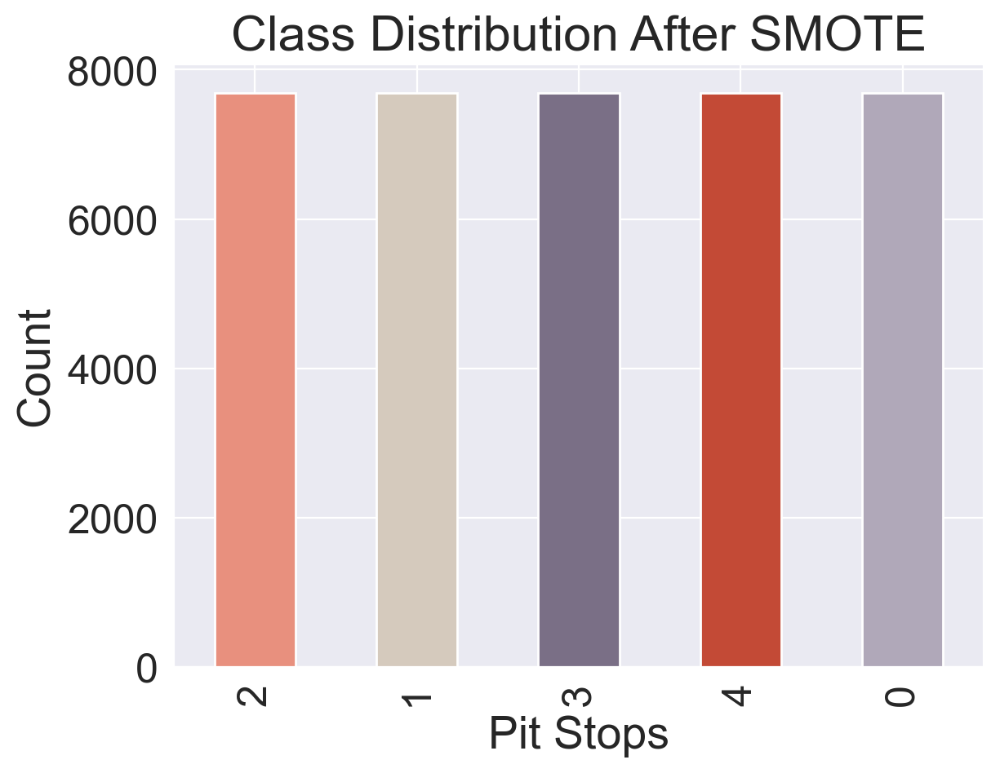

In [98]:
y_train_smote.value_counts().plot(kind='bar', color=colors_cat)
plt.title('Class Distribution After SMOTE')
plt.xlabel('Pit Stops')
plt.ylabel('Count')
plt.show()


# Building Machine Learning Models

## BaseLine Models

We start by creating two simple models to estimate the **baseline performance** on the training set. Specifically, we will use Gaussian Naive Bayes and Logistic Regression. We will use their default parameters and evaluate their weighted precision scores by performing k-fold cross validation.

In [99]:
clf_list = [('Gaussian Naive Bayes',GaussianNB()),
 ('Logistic Regression',LogisticRegression())]

cv_base_mean, cv_std = [],[]
for clf in clf_list:
  cv = cross_val_score(estimator=clf[1],
                       X=X_train_smote,
                       y=y_train_smote,
                       scoring=scoring_metric,
                       cv=5,
                       n_jobs=-1)
  cv_base_mean.append(cv.mean())
  cv_std.append(cv.std())

print('Baseline Models (weighted Recall)')

for i in range(len(clf_list)):
  print('{}:{}'.format(clf_list[i][0],np.round(cv_base_mean[i],2)))

Baseline Models (weighted Recall)
Gaussian Naive Bayes:0.57
Logistic Regression:0.47


As we can see, the baseline models do not perform well.We could have used more powerful classifiers such as Random Forests and/or XGBoost. However, I preferred to exclude them at this stage as their default parameters make them more susceptible to overfitting the training set and hence provide inaccurate baseline performance.

## Model Tuning

The six classifiers that will be used here are:

* Logistic Regression
* Support Vector Classifier
* Random Forest Classifier
* Gradient Boosting Classifier
* Xtreme Gradient Boosting Classifier
* K Nearest Neighbors Classifier

Using default hyperparameters usually results in non-optimised models that overfit or underfit the dataset.Hyperparameter tuning is the process of finding the set of hyperparameter values that achieves optimal performance. For this purpose, we will first define which hyperparameters we want to experiment with and what values to try out. We will pass this information to Scikit-learn's RandomizedSearchCV, which then evaluates some of the possible combinations of hyperparameter values. As mentioned earlier, weighted precision score will be used as the scoring metric for optimising our models. Note that RandomizedSearchCV evaluates performance by performing k-fold cross-validation(therefore, a number of folds, cv, need to be provided).

Apart from a confusion matrix, a plot of learning curves will be provided for each classifier. Learning curves are plots of a model's performance on the training set and the validation set as a function of the training set size. They can help us visualise overfitting/underfitting and the effect of training size on a model's error.

### KNearestNeighbors

Fitting 5 folds for each of 10 candidates, totalling 50 fits
K Nearest Neighbors
--------------
Best Score (precision_weighted)0.98
Best Parameters
    weights : distance
    p : 1
    n_neighbors : 30
    metric : minkowski


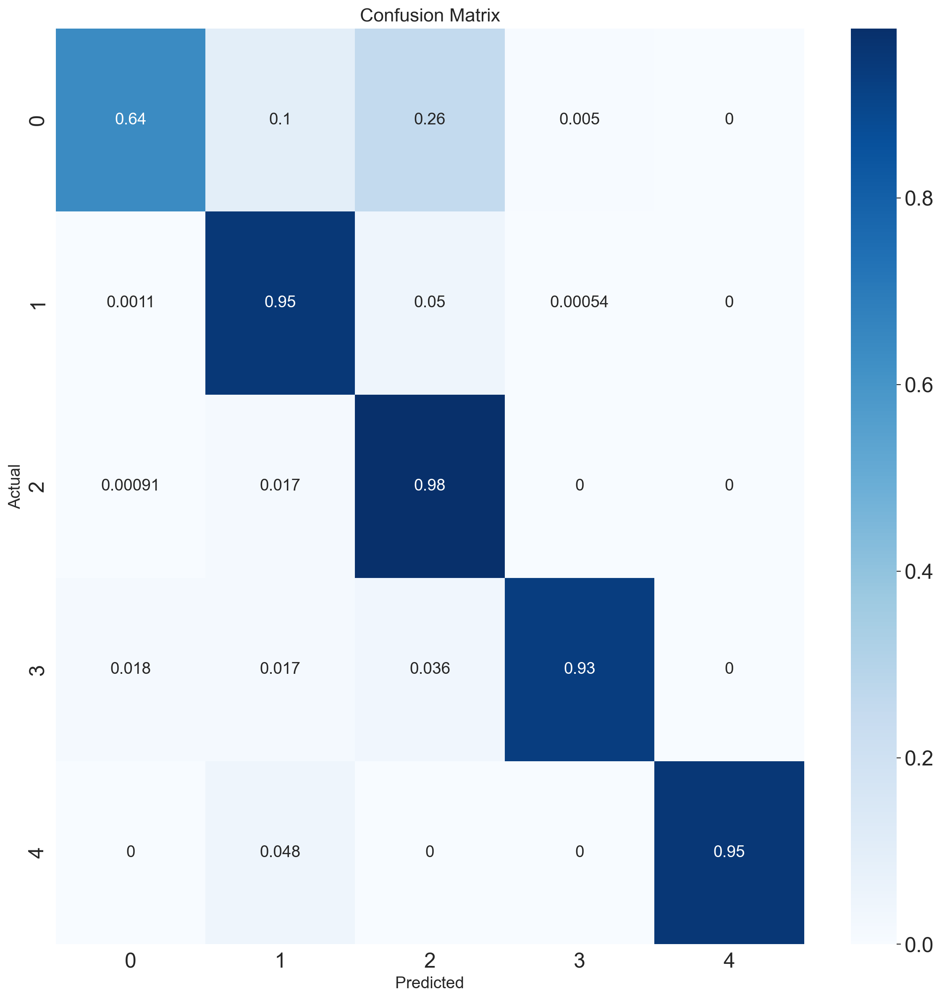

In [100]:

knn = KNeighborsClassifier()


param_grid = {
    'n_neighbors': [30,35],
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski', 'euclidean', 'manhattan'],
    'p': [1, 2, 3]  #For minkowski
}

# GridSearchCV
clf_knn = RandomizedSearchCV(
    estimator=knn,
    param_distributions=param_grid,
    scoring=scoring_metric,  # Use recall for evaluation
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Fit model
clf_knn.fit(X_train_smote, y_train_smote)
clf_performance(clf_knn,'K Nearest Neighbors','KNN')

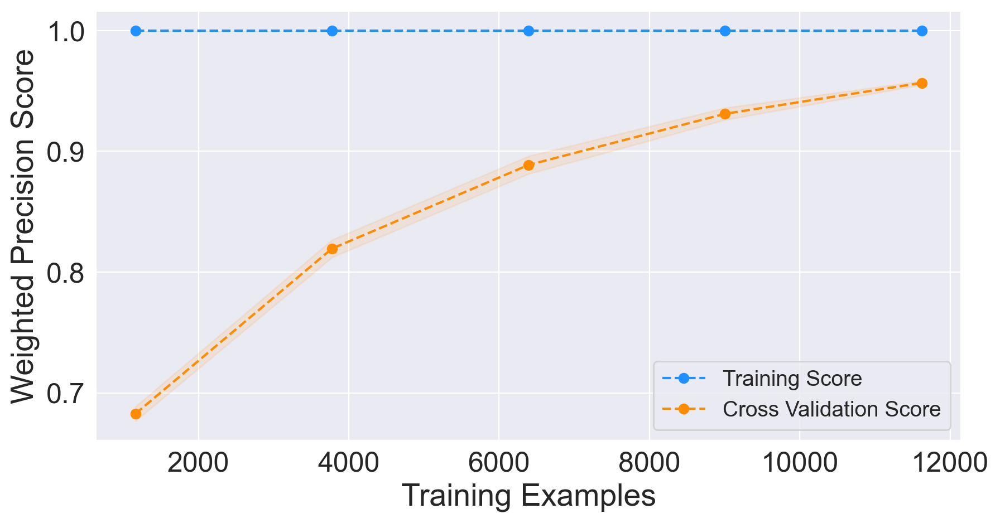

In [101]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(clf_knn.best_estimator_,X_train,y_train, ax2)

### Logistic Regression

C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
20 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-pa

Logistic Regression
--------------
Best Score (precision_weighted)0.481
Best Parameters
    solver : lbfgs
    penalty : None
    max_iter : 100
    class_weight : None
    C : 100


C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:1208: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\

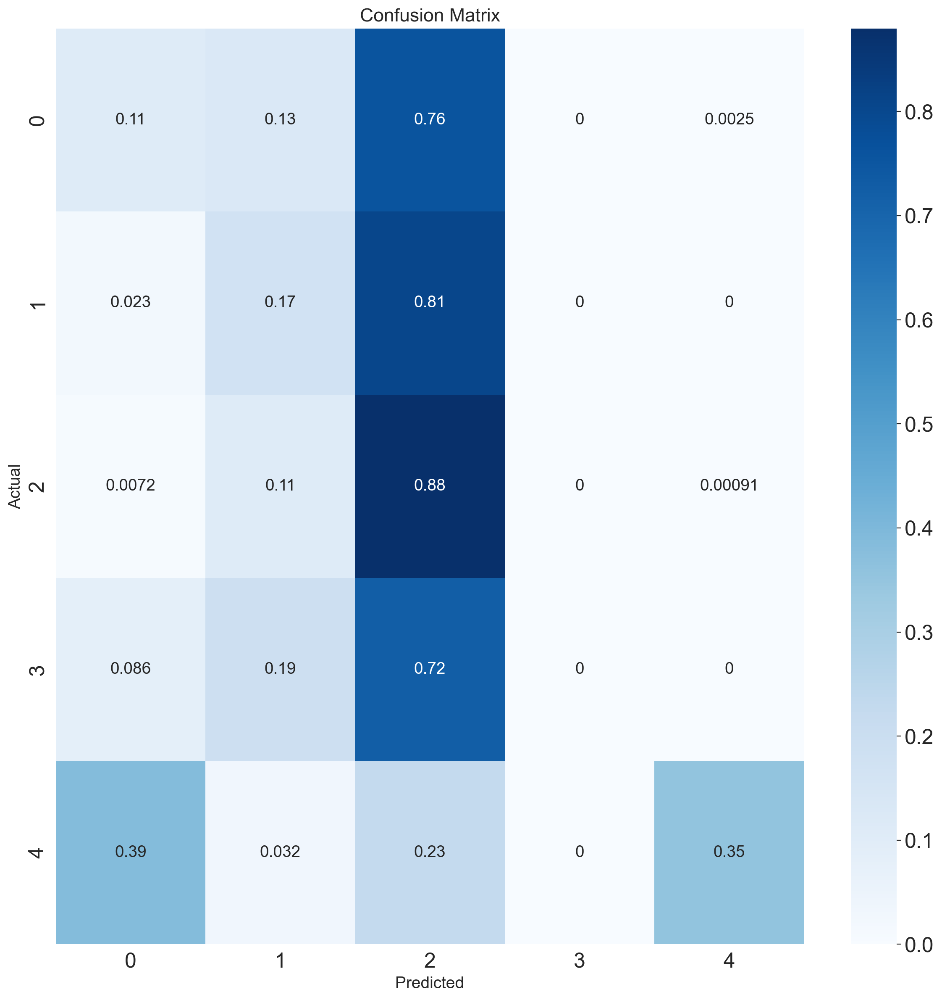

In [102]:
lr = LogisticRegression(random_state=random_state)

param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', None],  # Regularization type
    'C': [0.01, 0.1, 1, 10, 100],               # Inverse of regularization strength
    'solver': ['liblinear', 'saga', 'lbfgs'],   # Optimization algorithm
    'max_iter': [100, 200, 500],                # Maximum number of iterations
    'class_weight': [None, 'balanced']          # Adjust weights inversely proportional to class frequencies
}


lr_clf = RandomizedSearchCV(estimator=lr,
                      param_distributions=param_grid,
                      scoring=scoring_metric,
                      cv=5,
                      verbose=False,
                      n_jobs=-1)

best_lr_clf = lr_clf.fit(X_train_smote,y_train_smote)
clf_performance(best_lr_clf,'Logistic Regression','LR')

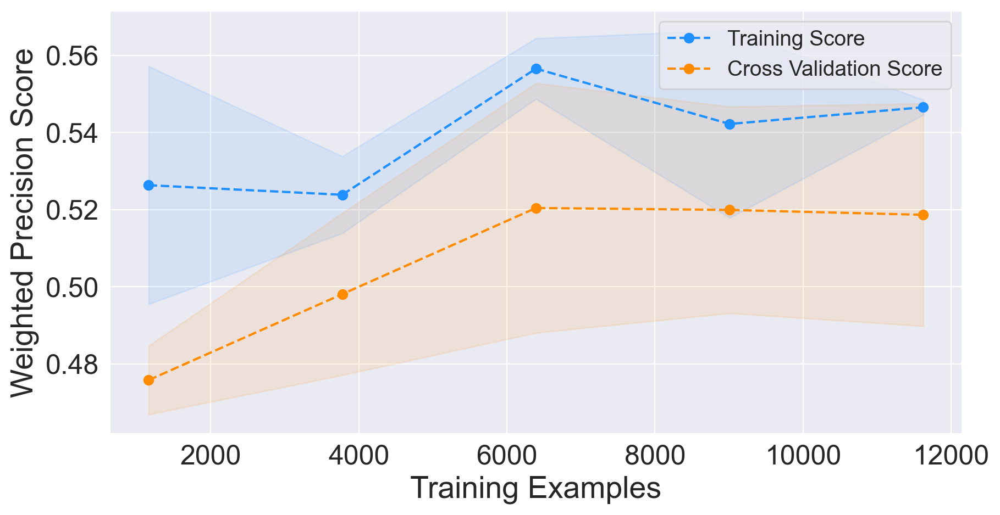

In [103]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(best_lr_clf.best_estimator_,X_train,y_train, ax2)

### Support Vector Classifier

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Support Vector Classifier
--------------
Best Score (precision_weighted)0.869
Best Parameters
    kernel : rbf
    gamma : 0.1
    degree : 3
    class_weight : balanced
    C : 10


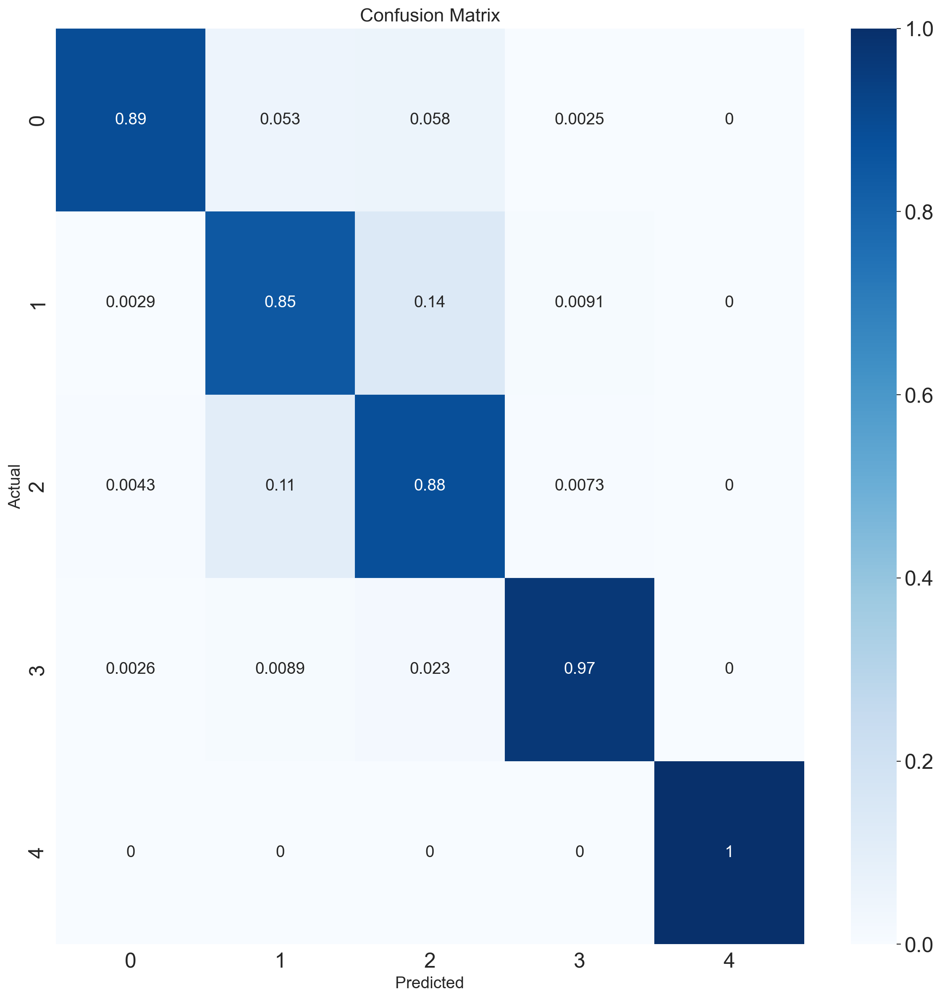

In [104]:

svc = SVC(probability=True)


param_grid = {
    'C': [0.1, 1, 10],
    'kernel': [ 'poly', 'rbf'],
    'gamma': [0.01, 0.1],
    'degree': [2, 3], # Only used for 'poly' kernel
    'class_weight': ['balanced']
}

# GridSearchCV
clf_svc = RandomizedSearchCV(
    estimator=svc,
    param_distributions=param_grid,
    scoring=scoring_metric,  # Focus on weighted recall
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Fit the model
clf_svc.fit(X_train, y_train)
clf_performance(clf_svc,'Support Vector Classifier','SVC')




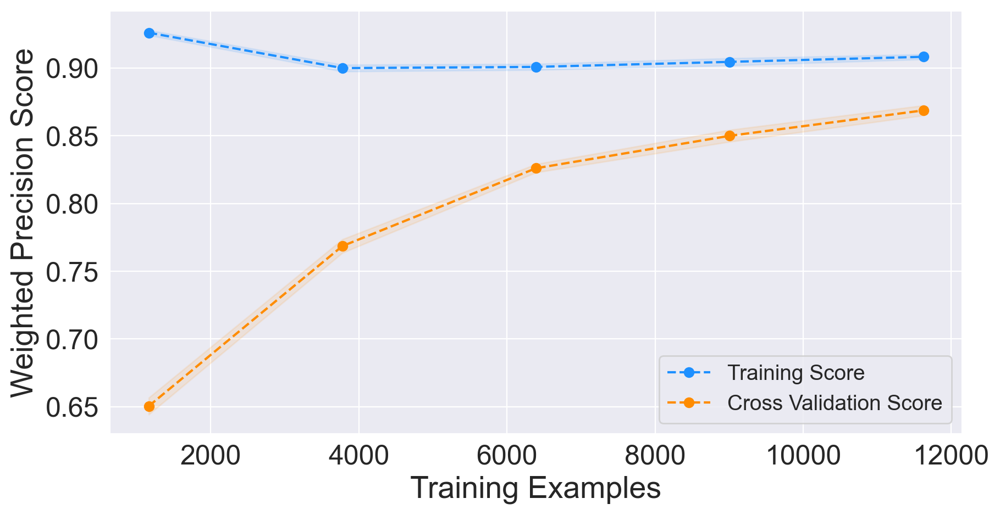

In [105]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(clf_svc.best_estimator_,X_train,y_train, ax2)

### Random Forest

Random Forest
--------------
Best Score (precision_weighted)0.947
Best Parameters
    n_estimators : 50
    min_samples_split : 7
    min_samples_leaf : 3
    max_features : sqrt
    max_depth : 10
    bootstrap : False


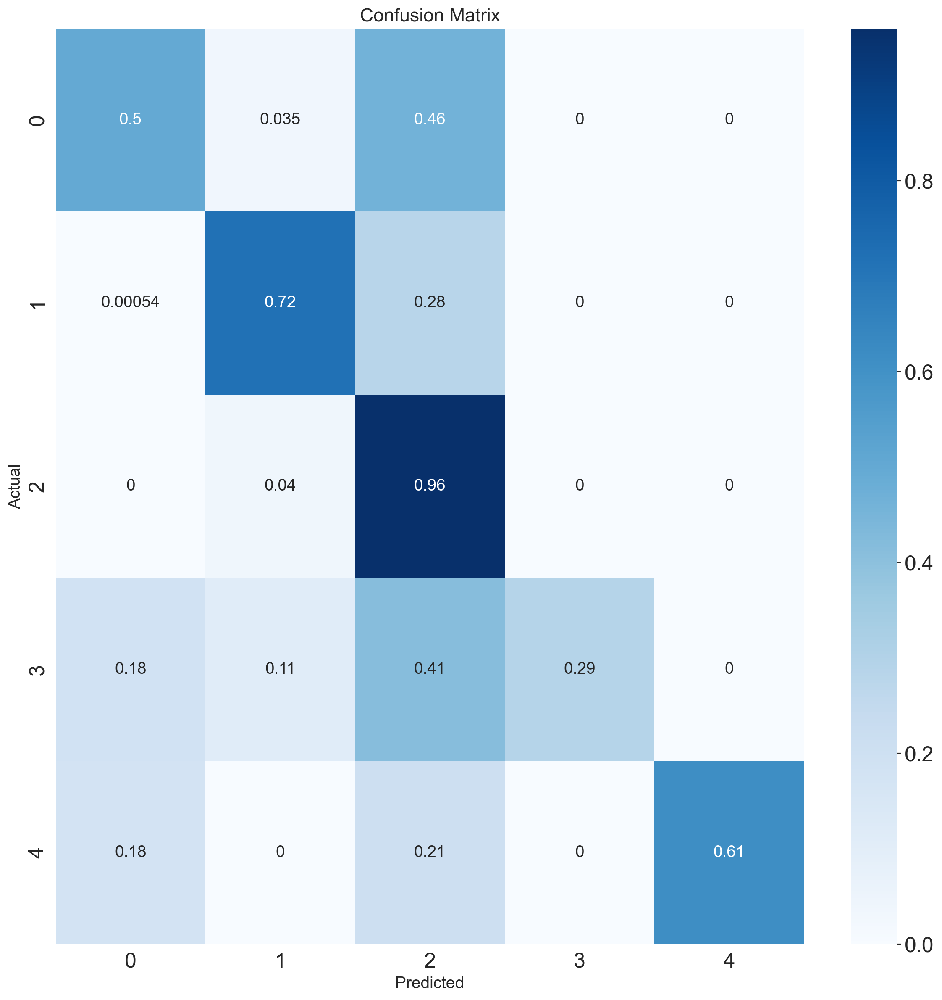

In [106]:
rf = RandomForestClassifier(random_state=random_state)
param_grid = {
    'n_estimators': [50,100,150],         # Number of trees in the forest
    'max_depth': [8,10],         # Maximum depth of the tree
    'min_samples_split': [3,5,7],         # Minimum samples required to split an internal node
    'min_samples_leaf': [3,5,7],           # Minimum samples required to be at a leaf node
    'max_features': ['sqrt', 'log2', None],  # Number of features to consider for the best split
    'bootstrap': [True, False]               # Use bootstrap samples when building trees
}


rf_clf = RandomizedSearchCV(estimator=rf,
                      param_distributions=param_grid,
                      scoring=scoring_metric,
                      cv=5,
                      verbose=False,
                      n_jobs=-1)
best_rf_clf = rf_clf.fit(X_train_smote,y_train_smote)
clf_performance(best_rf_clf,'Random Forest','RF')

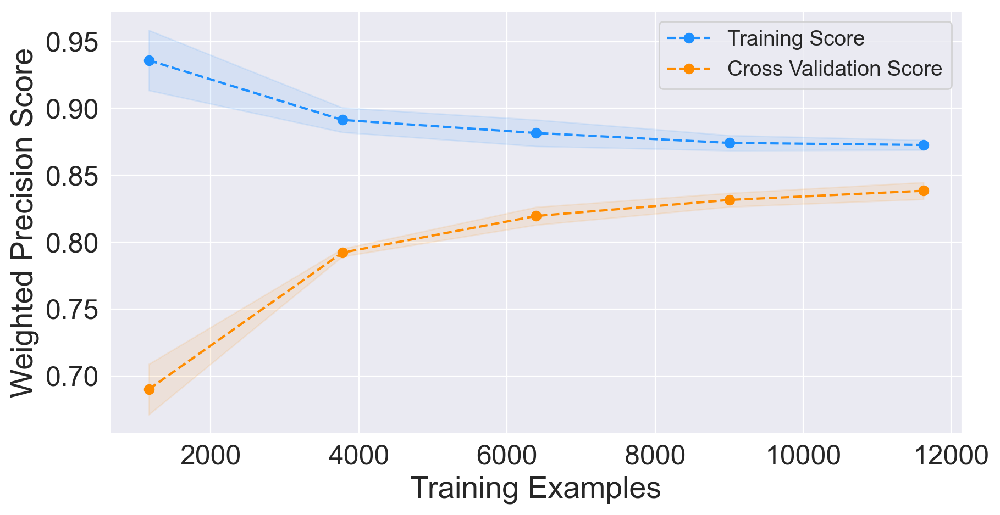

In [107]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(best_rf_clf.best_estimator_,X_train,y_train, ax2)

### Gradient Boosting Classifier

Gradient Boosting Classifier
--------------
Best Score (precision_weighted)0.996
Best Parameters
    subsample : 1.0
    n_estimators : 200
    min_samples_split : 2
    min_samples_leaf : 1
    max_features : log2
    max_depth : 7
    learning_rate : 0.1


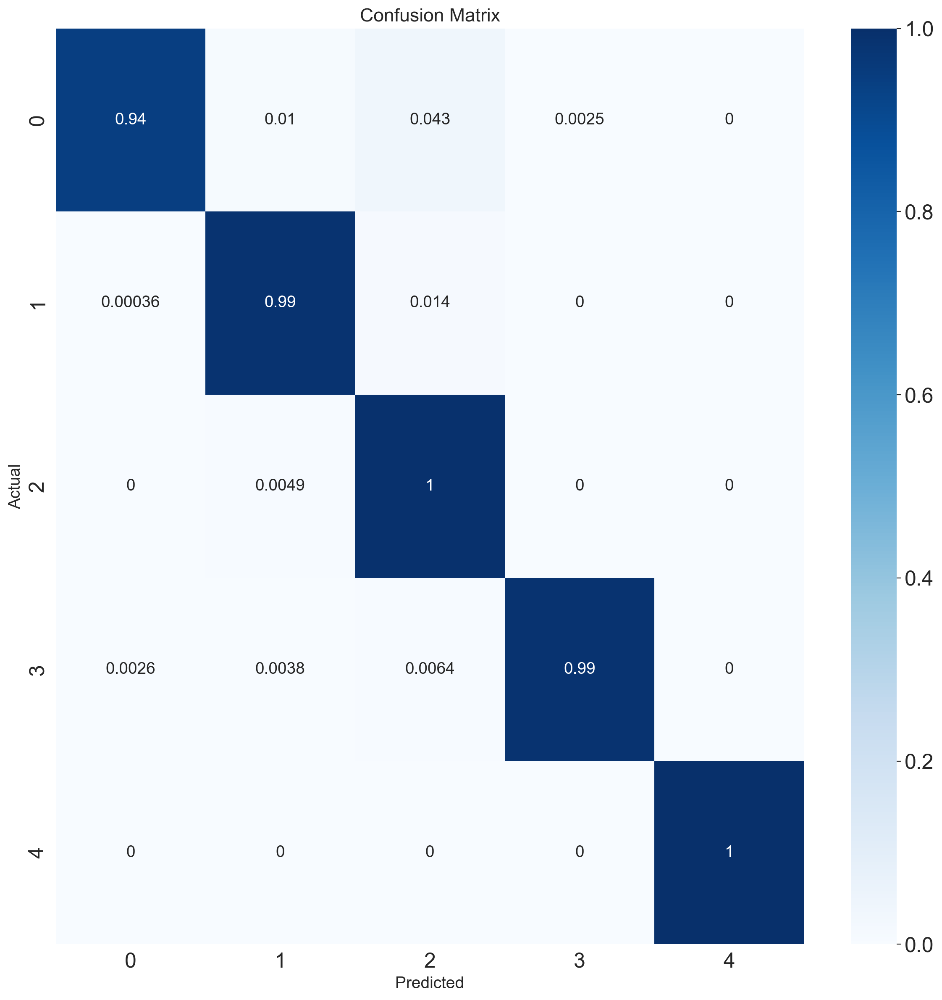

In [108]:
gbc = GradientBoostingClassifier(random_state=random_state)

param_grid = {
    'n_estimators': [50, 100, 200],       # Number of trees
    'learning_rate': [0.01, 0.05, 0.1],  # Step size for weight updates
    'max_depth': [3, 5, 7],              # Maximum depth of each tree
    'min_samples_split': [2, 5, 10],     # Minimum samples required to split an internal node
    'min_samples_leaf': [1, 2, 5],       # Minimum samples required to be at a leaf node
    'subsample': [0.8, 1.0],             # Fraction of samples used for fitting each tree
    'max_features': ['sqrt', 'log2', None]  # Number of features to consider for the best split
}



gbc_clf = RandomizedSearchCV(estimator=gbc,
                       param_distributions=param_grid,
                       scoring=scoring_metric,
                       cv=5,
                       verbose=False,
                       n_jobs=-1)

best_gbc_clf = gbc_clf.fit(X_train_smote,y_train_smote)
clf_performance(best_gbc_clf,'Gradient Boosting Classifier','GBC')




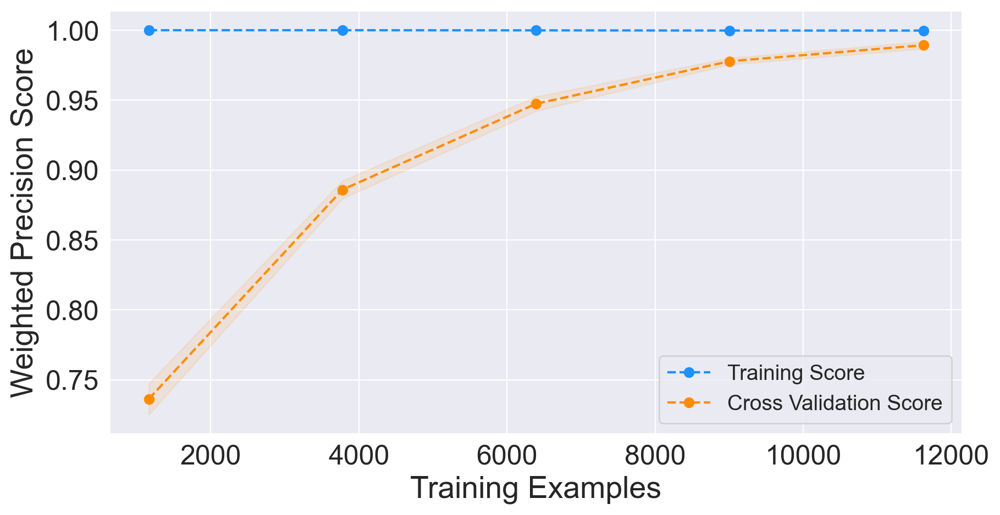

In [109]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(best_gbc_clf.best_estimator_,X_train,y_train, ax2)

### XGBoost Classifier

C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarning: [02:47:23] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Classifier
--------------
Best Score (precision_weighted)0.994
Best Parameters
    subsample : 1.0
    scale_pos_weight : 10
    reg_lambda : 5
    reg_alpha : 0.1
    n_estimators : 300
    min_child_weight : 3
    max_depth : 10
    learning_rate : 0.05
    gamma : 0.1
    colsample_bytree : 1.0


C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarning: [02:47:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarning: [02:47:29] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarni

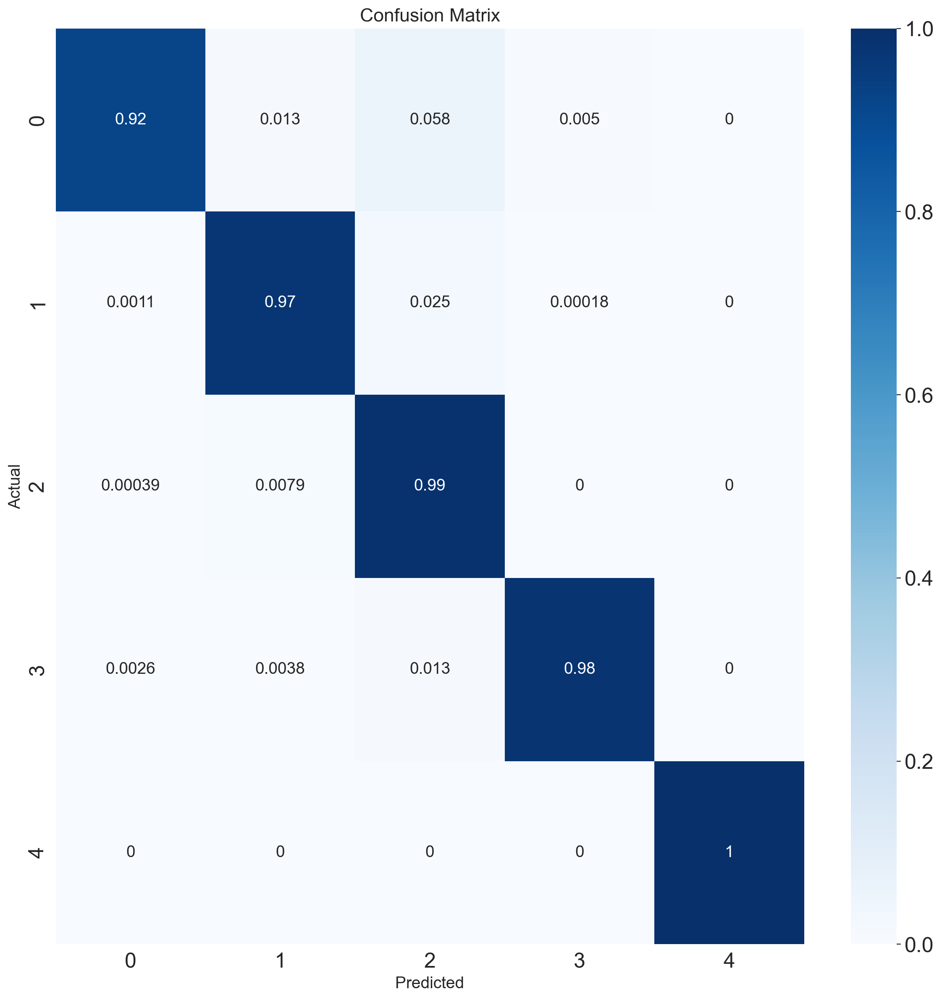

In [ ]:
xgb = XGBClassifier(random_state=random_state)
X_train_smote['Rain (mm)'] = pd.to_numeric(X_train_smote['Rain (mm)'],errors='coerce')
X_train['Rain (mm)'] = pd.to_numeric(X_train['Rain (mm)'],errors='coerce')
param_grid= {
    'n_estimators': [50, 100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],
    'max_depth': [3, 5, 7, 10],
    'min_child_weight': [1, 3, 5, 7],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 1, 10],  # L1 regularization
    'reg_lambda': [1, 2, 5, 10],   # L2 regularization
    'gamma': [0, 0.1, 0.5, 1.0],
    'scale_pos_weight': [1, 5, 10],  
}



xgb_clf = RandomizedSearchCV(estimator=xgb,
                       param_distributions=param_grid,
                       scoring=scoring_metric,
                       cv=5,
                       verbose=False,
                       n_jobs=-1)

best_xgb_clf = xgb_clf.fit(X_train_smote,y_train_smote)
clf_performance(best_xgb_clf,'XGBoost Classifier','XGB')


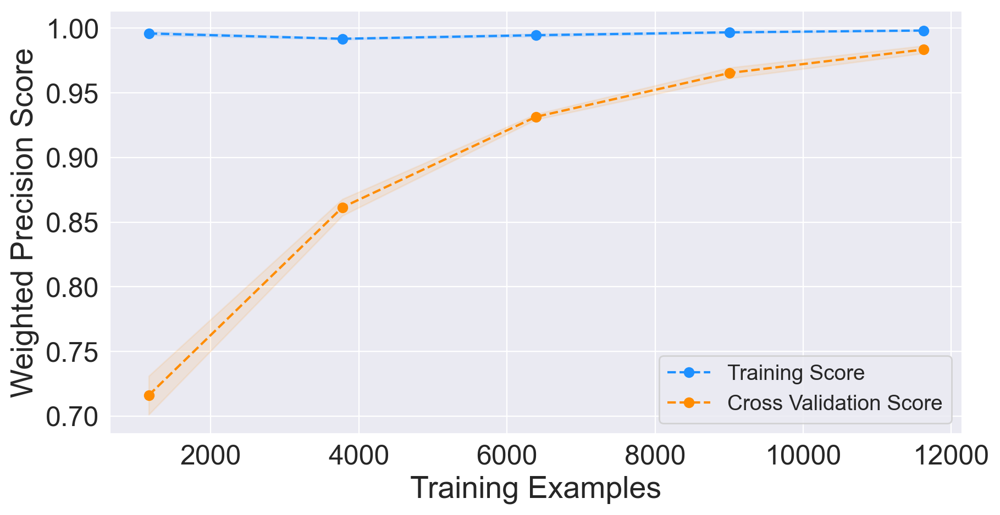

In [111]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(best_xgb_clf.best_estimator_,X_train,y_train, ax2)

# Ensemble Learning

We can combine the predictions of all these classifiers to determine if we get better predictive performance compared to each individual constituent classifier. This practice is the main motivation behind ensemble learning.

Specifically, I will use Soft Voting. In this case, every individual classifier provides a probability value that a specific data point belongs to a particular target class. The predictions are weighted by the classifier's importance and summed up. Then the target label with the greatest sum of weighted probabilities wins the vote.

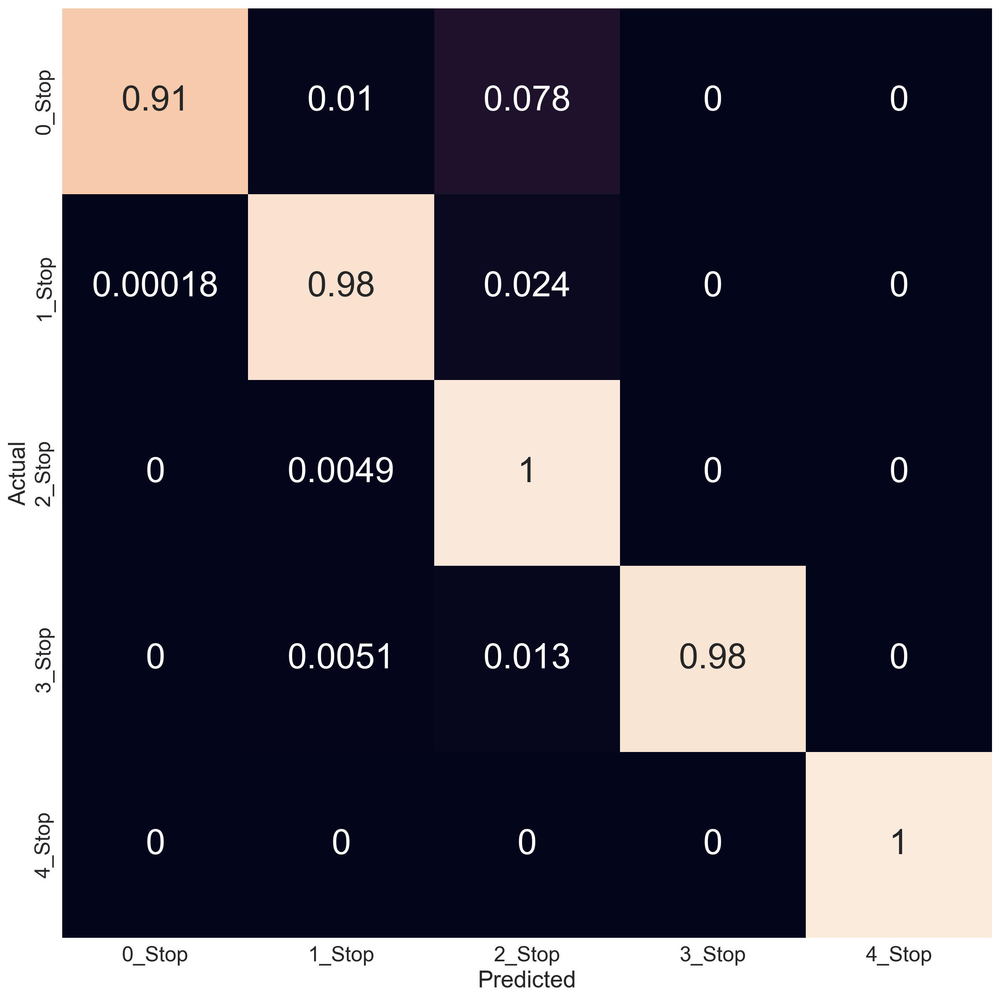

In [112]:
estimators = [('XGB',best_xgb_clf.best_estimator_),
              ('RF',best_rf_clf.best_estimator_),
              ('GBC',best_gbc_clf.best_estimator_),]

tuned_voting_soft = VotingClassifier(estimators=estimators[1:],voting='soft',n_jobs=-1)

estimators.append(('SoftV',tuned_voting_soft))

y_pred_pp = cross_val_predict(tuned_voting_soft,
                              X_train,
                              y_train,
                              cv=5,
                              method='predict_proba')

y_pred = np.argmax(y_pred_pp,axis=1)

cm = confusion_matrix(y_train,y_pred,normalize='true')


y_train_bin = label_binarize(y_train,classes=np.unique(y_train)) #Binarize labels for OvR
roc_auc = {}
fpr, tpr, roc_auc_values = {},{},{}
for i in range(y_train_bin.shape[1]):
  fpr[i], tpr[i], _ = roc_curve(y_train_bin[:,i],y_pred_pp[:,i])
  roc_auc[i] = roc_auc_score(y_train_bin[:,i],y_pred_pp[:,i])
  roc_auc_values[i] = roc_auc[i]

#Store evaluation metrics in comparison_dict
comparison_dict['SoftV'] = [
      accuracy_score(y_train,y_pred),
      precision_score(y_train,y_pred,average='weighted'),
      recall_score(y_train,y_pred,average='weighted'),
      np.mean(list(roc_auc.values())), #Average ROC AUC for all classes
      fpr,tpr
  ]

#Plot confusion matrix and learning curve
fig, ax1 = plt.subplots(figsize=(12,12))
plot_conf_mx(cm,ax1)

plt.tight_layout()
plt.show()





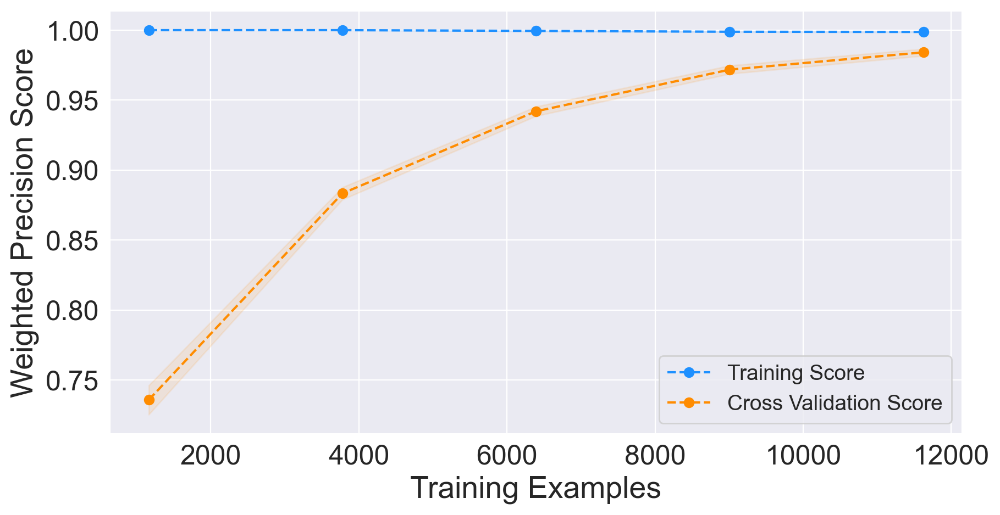

In [113]:
fig, ax2 = plt.subplots(figsize=(10,5))
plot_learning_curve(tuned_voting_soft,X_train,y_train, ax2)

# Results

## Learning Curve

The gap between the scores on training set and validation set is very small indicating that the models do not overfit the data

# Feature Importance

Some classifiers allow us to visualise feature importance

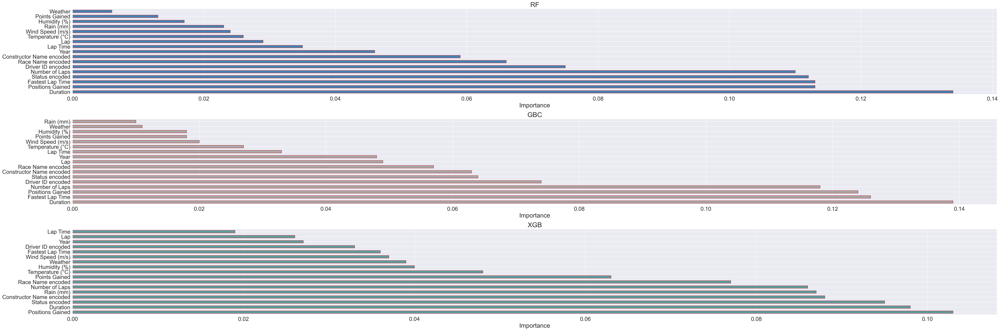

In [114]:
colors_fi = ['steelblue','darkgray','cadetblue']

fig = plt.subplots(3,1,figsize=(45,15))

for i, (name,clf) in enumerate(zip(['RF','GBC','XGB'],
                                   [best_rf_clf,best_gbc_clf,best_xgb_clf])):

  ax = plt.subplot(3,1,i+1)
  plot_feature_imp(clf,name,colors_fi[i],ax)
  plt.ylabel('')

plt.tight_layout()


# Performance Comparison

Initially, we can compare the performance of our classifiers in terms of four individual metrics(Accuracy,Precision,Recall and AUC)



In [115]:
comparison_matrix={}
for key,value in comparison_dict.items():
  comparison_matrix[str(key)] = value[0:4]

comparison_df = pd.DataFrame(comparison_matrix,index=['Accuracy','Precision','Recall','AUC'])
comparison_df.style.highlight_max(color='lightgreen',axis=1)

,KNN,LR,SVC,RF,GBC,ABC,SoftV
Accuracy,0.956501,0.535825,0.874183,0.816436,0.989813,0.982380,0.984651
Precision,0.956413,0.483424,0.874243,0.834981,0.989834,0.982438,0.984807
Recall,0.956501,0.535825,0.874183,0.816436,0.989813,0.982380,0.984651
AUC,0.995708,0.716717,0.977457,0.977289,0.999545,0.999189,0.998824


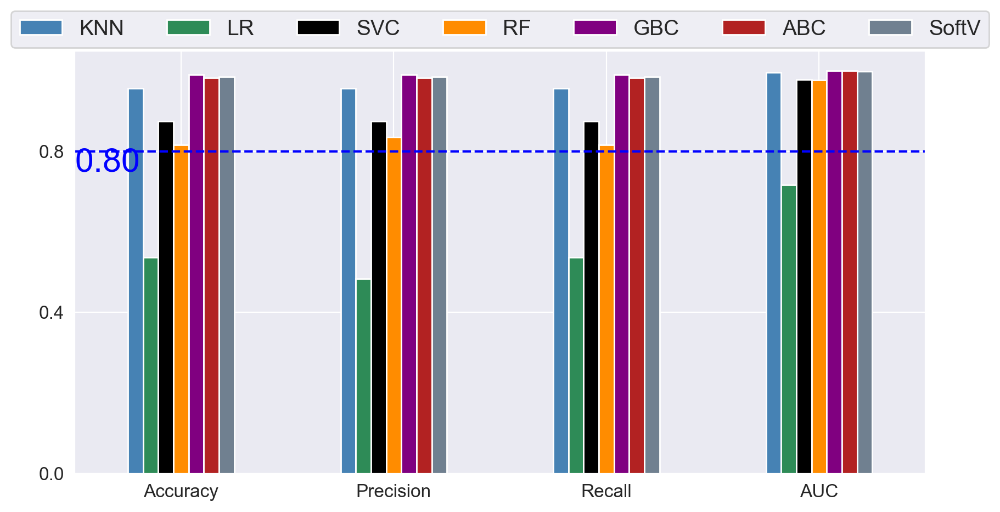

<Figure size 640x480 with 0 Axes>

In [116]:
comparison_df.plot(kind='bar',
                   figsize=(10,5),
                   fontsize=12,
                   color = colors_comp
                   )

plt.legend(loc='upper center',
           fontsize = font_size - 6,
           ncol = len(comparison_df.columns),
           bbox_to_anchor = (0.5,1.12))

plt.xticks(rotation=0)
plt.yticks([0,0.4,0.8])

plt.axhline(y=0.80,color='blue',linestyle='--')
plt.text(x=-0.5,y=0.75,s='0.80',size=font_size+2,color='blue')

plt.show()

plt.tight_layout()
plt.show()

All the classifiers have a score way above 0.8(baseline performance expected on the training set), but some models might be overfitting the data, let's see which model performs equally well on the test set. That model will be chosen the optimal model


Using single metrics is not the only way of comparing the predictive performance of classification models. The ROC Curve(Receiver Operating Characteristic Curve)is a graph showing the performance of a classifier at different classification thresholds. It plots true positive rate(recall) against the false positive rate.

# ROC Curves

### Logistic Regression

C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:1208: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\

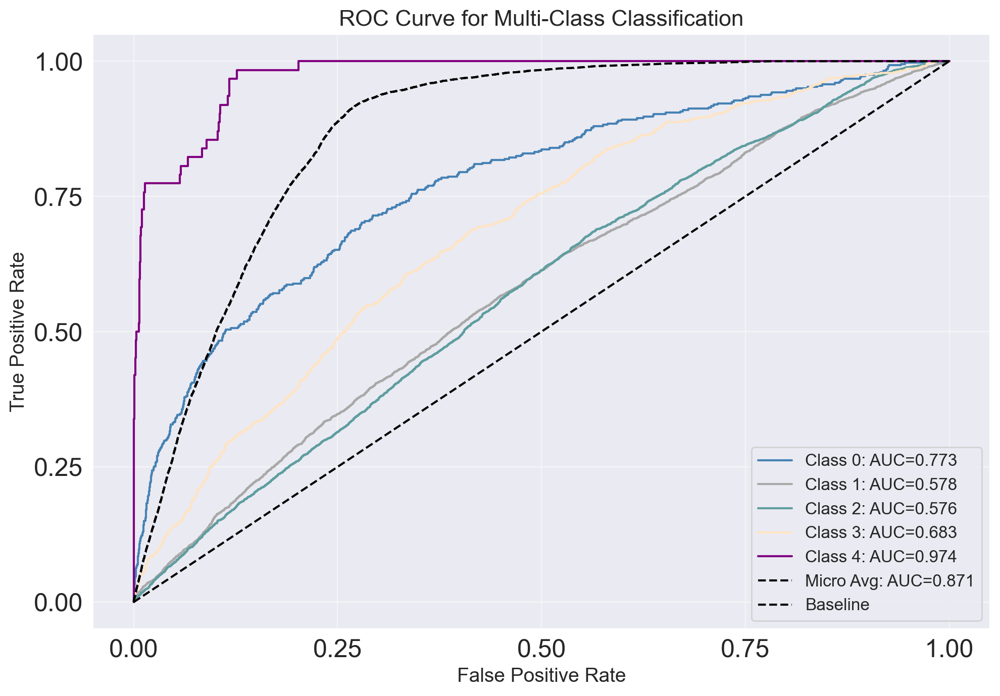

In [117]:
plot_roc_curve(best_lr_clf.best_estimator_,X_train,y_train)

### Random Forests

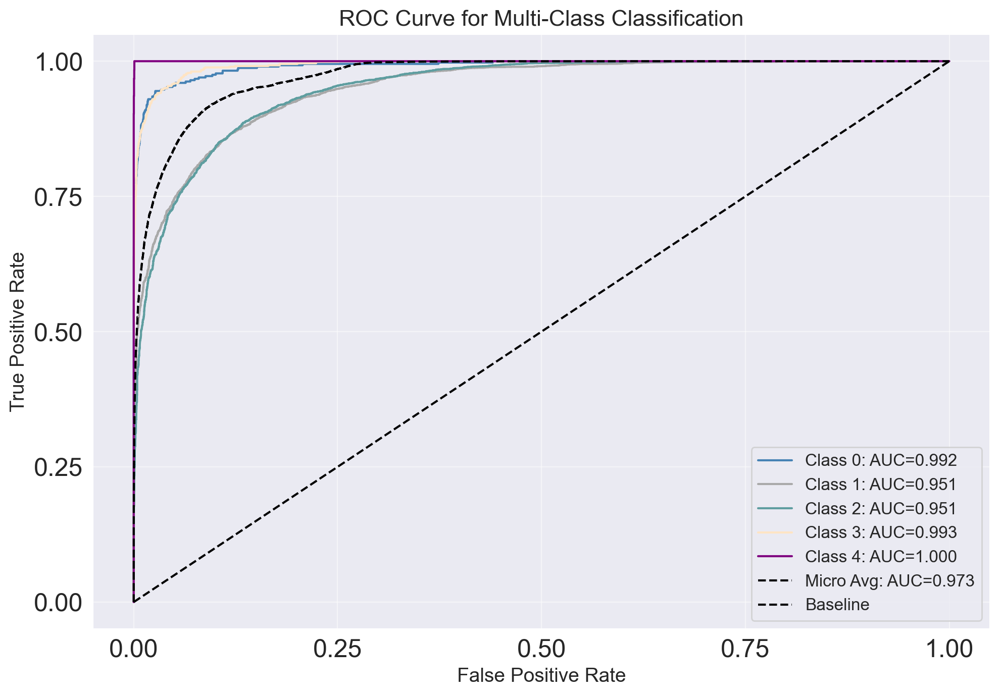

In [118]:
plot_roc_curve(best_rf_clf.best_estimator_,X_train,y_train)

### Gradient Boosting Classifier

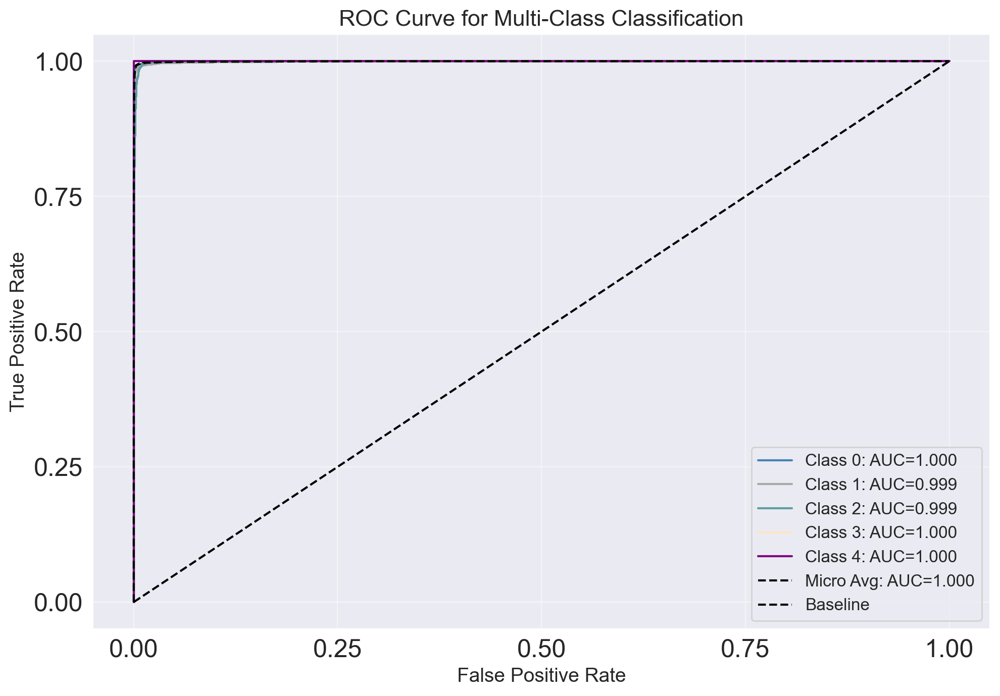

In [119]:
plot_roc_curve(best_gbc_clf.best_estimator_,X_train,y_train)

### XGBoost Classifier

C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarning: [02:50:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarning: [02:50:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "scale_pos_weight" } are not used.

  warnings.warn(smsg, UserWarning)
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\xgboost\core.py:158: UserWarni

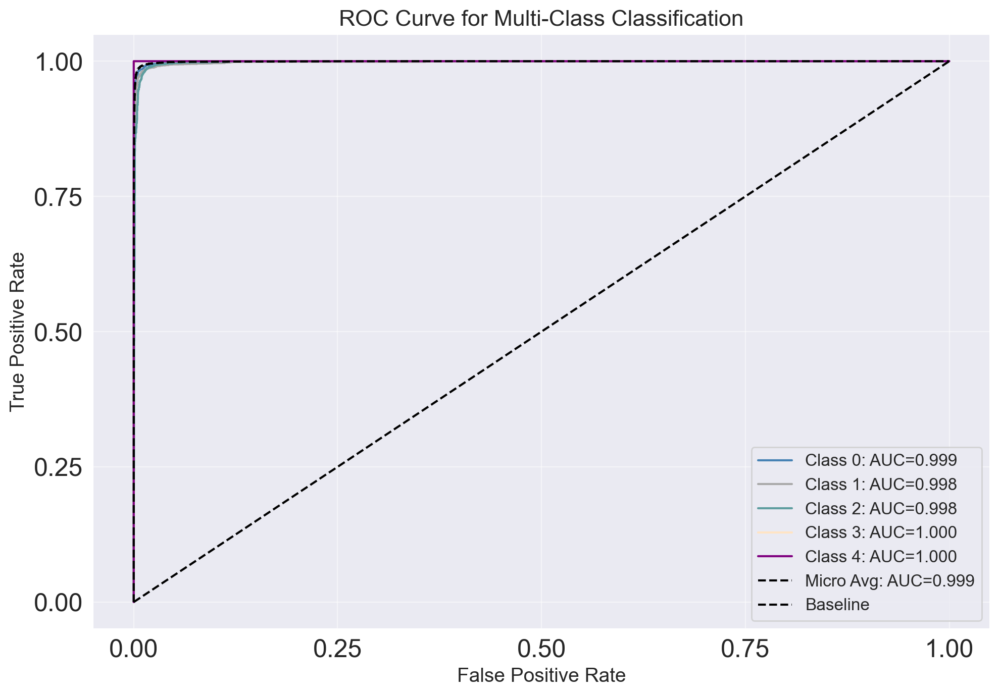

In [120]:
plot_roc_curve(best_xgb_clf.best_estimator_,X_train,y_train)

### Soft Voting Classifier

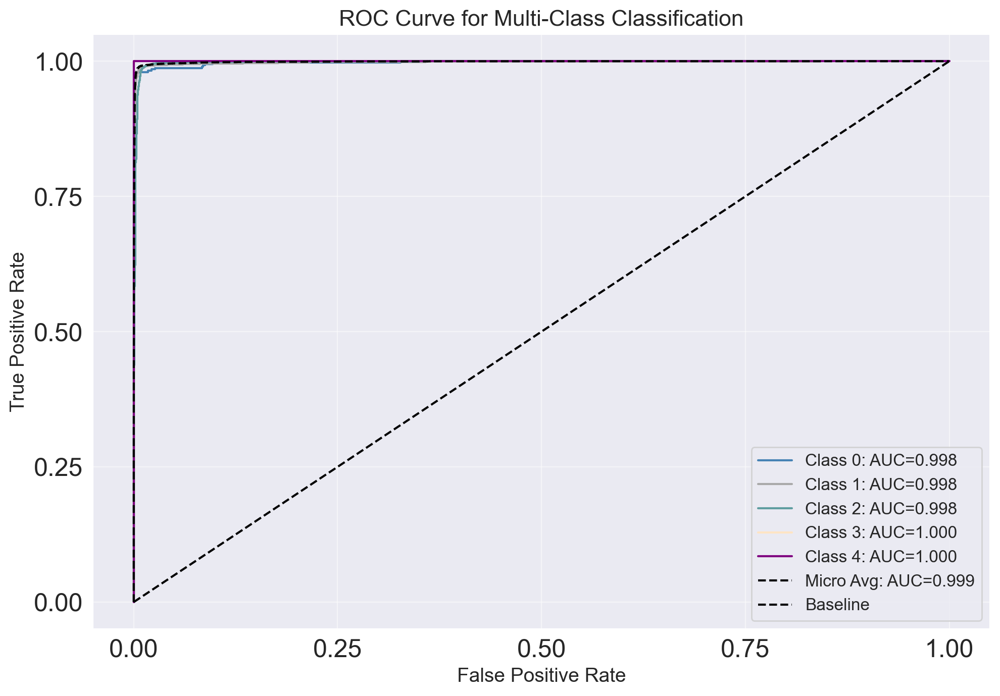

In [121]:
plot_roc_curve(tuned_voting_soft,X_train,y_train)

### Support Vector Classifier

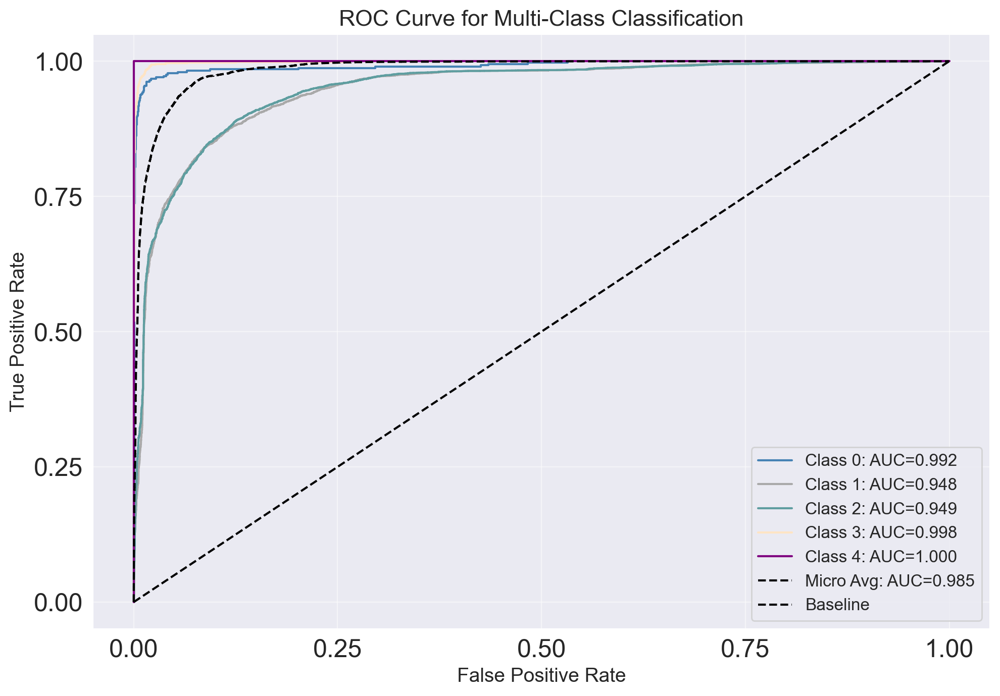

In [122]:
plot_roc_curve(clf_svc.best_estimator_,X_train,y_train)

### K Nearest Neighbors Classifier

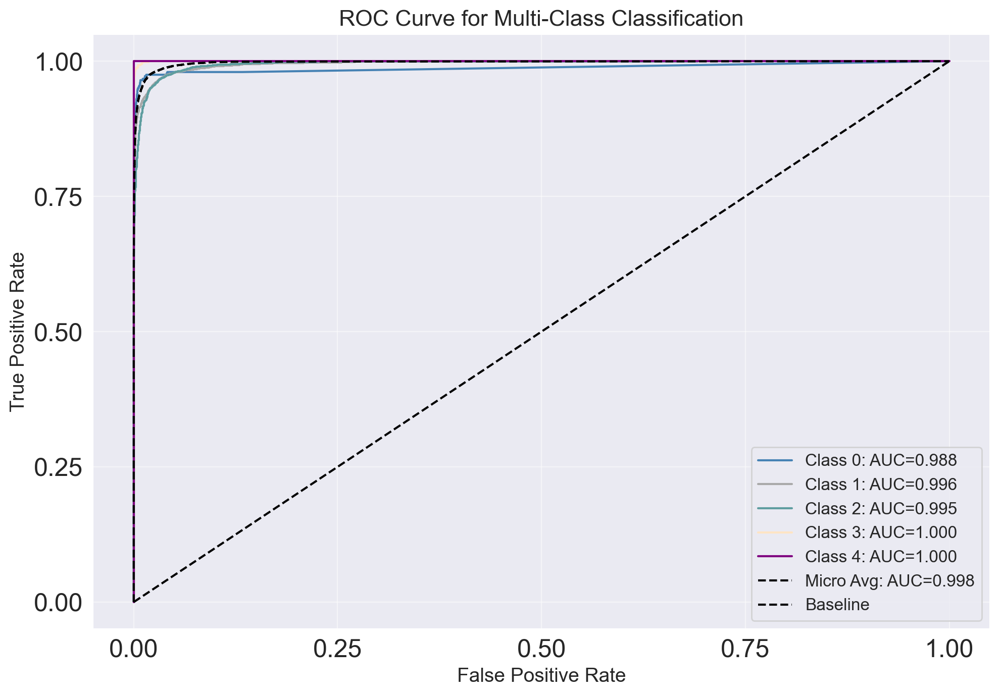

In [123]:
plot_roc_curve(clf_knn.best_estimator_,X_train,y_train)

The dashed diagonal line represents a purely random classifier, a good classifier stays as far away from that line as possible(towards the top left corner)

In our case, all classifiers perform well. 

# Evaluating on the Test Set

Now we will evaluate the model on unseen data, let's perform the preprocessing steps first

In [124]:
#First we will drop the features that are to be dropped
features_test_drop = ['Time_x','Time_y','Driver Name','Round','Round_x','Round_y','Stop']

print(test_df.columns)
test_df = test_df.drop(features_test_drop,axis=1, errors = 'ignore')

features_more_drop = ['Lap Number','Position','Latitude','Longitude']
test_df = test_df.drop(features_more_drop,axis=1, errors = 'ignore')
test_df.head()


Index(['Year', 'Race Name', 'Lap Number', 'Driver ID', 'Position', 'Lap Time',
       'Constructor Name', 'Grid Position', 'Final Position',
       'Fastest Lap Time', 'Points', 'Status', 'Number of Laps', 'Lap',
       'Duration', 'Date', 'Latitude', 'Longitude', 'Weather',
       'Temperature (°C)', 'Humidity (%)', 'Wind Speed (m/s)', 'Rain (mm)',
       'Pit Stops'],
      dtype='object')


,Year,Race Name,Driver ID,Lap Time,Constructor Name,Grid Position,Final Position,Fastest Lap Time,Points,Status,Number of Laps,Lap,Duration,Date,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Pit Stops
0,2022,Ba,le,99.070,Fe,1.0,1.0,94.570,26.0,Finished,57.0,31.0,24.527,2022-03-20,clear sky,21.05,72,5.45,No rain,2
1,2021,Ab,bo,91.738,Me,6.0,6.0,86.862,8.0,Finished,58.0,30.0,21.669,2021-12-12,clear sky,21.10,68,2.06,No rain,1
2,2019,Ja,ru,98.422,Wi,18.0,16.0,95.458,0.0,+2 Laps,50.0,25.0,23.792,2019-10-13,scattered clouds,7.84,72,6.85,No rain,1
3,2023,Hu,sa,86.826,Wi,20.0,18.0,83.496,0.0,Retired,67.0,34.0,22.197,2023-07-23,overcast clouds,1.26,70,3.09,No rain,2
4,2022,Hu,ve,85.146,As,18.0,10.0,82.824,1.0,+1 Lap,69.0,15.0,21.402,2022-07-31,overcast clouds,1.26,70,3.09,No rain,1


In [125]:
#Now we will create the new features
test_df['Positions Gained'] = test_df['Final Position'] - test_df['Grid Position']
test_df['Points Gained'] = np.where((test_df['Final Position']>=10) & (test_df['Positions Gained']>0),1,0)

#Replacing the No rain value with 0
test_df['Rain (mm)'].replace('No rain',0,inplace=True)
#Converting rain into a categorical feature
test_df['Rain (mm)'] = test_df['Rain (mm)'].astype('category')

#Status values to be converted to Finished,+1 Lap,+2 Laps and DNF
stat_val_test = test_df['Status'].values
for stat in stat_val_test:
  if stat not in ['Finished','+1 Lap','+2 Laps']:
    test_df['Status'].replace(stat,'DNF',inplace=True)

#We will shorted Race Name, Driver ID and Constructor Name to first 2 letters
#To prevent clutter
test_df['Race Name'] = test_df['Race Name'].str[:2]
test_df['Driver ID'] = test_df['Driver ID'].str[:2]
test_df['Constructor Name'] = test_df['Constructor Name'].str[:2]

#Weather values will be classified into Rain or No Rain
no_rain_conditions = ['clear sky','broken clouds','overcast clouds','few clouds','scattered clouds']

test_df['Weather'] = np.where(test_df['Weather'].isin(no_rain_conditions),'No rain','Rain')

test_df['Weather'].value_counts()

#Converting date to a datetime object
test_df['Date'] = pd.to_datetime(test_df['Date'])

#Performing log transformation on Fastest Lap Time, Humidity, Lap and Number of Laps
test_df['Fastest Lap Time'] = np.log(test_df['Fastest Lap Time'])
test_df['Humidity (%)'] = np.log(test_df['Humidity (%)'])
test_df['Lap'] = np.log(test_df['Lap'])
test_df['Number of Laps'] = np.log(test_df['Number of Laps'])

#Performing square root transformation on Wind Speed
test_df['Wind Speed (m/s)'] = np.sqrt(test_df['Wind Speed (m/s)'])

#Now we will bin the features accordingly
test_df['Temperature (°C)'] = pd.qcut(test_df['Temperature (°C)'],q=3,labels=['Low','Medium','High'])
test_df['Wind Speed (m/s)'] = pd.qcut(test_df['Wind Speed (m/s)'],q=3,labels=['Low','Medium','High'])
test_df['Humidity (%)'] = pd.qcut(test_df['Humidity (%)'],q=3,labels=['Low','Medium','High'])




In [126]:
#Now we will drop the features that are not required
#As new features are created using those
test_df.drop(['Grid Position','Final Position','Points'],axis=1,inplace=True)

In [127]:
#Now we will perform encoding on the test dataset's features
#Ordinal encoding(order wise) for Temperature, Humidity and Wind Speed
test_df[['Temperature (°C)','Humidity (%)','Wind Speed (m/s)']] = encoder_ord.transform(test_df[['Temperature (°C)','Humidity (%)','Wind Speed (m/s)']])

#One-Hot Encoding (binary) for Weather
test_df['Weather'] = encoder_ohe.transform(test_df[['Weather']])

# For these columns we will apply frequency encoding as they have
# a large number of categories
freq_columns = ['Race Name', 'Driver ID', 'Constructor Name', 'Status']

# Apply frequency encoding to each categorical column
for column in freq_columns:
    freq_encoding = test_df[column].value_counts().to_dict()
    # Map the frequency of each category to the column
    test_df[column + ' encoded'] = test_df[column].map(freq_encoding)


In [128]:
#We can drop the non-encoded original features
test_df.drop(freq_columns,axis=1,inplace=True)

In [129]:
#Dropping Date
test_df.drop('Date',axis=1,inplace=True)

In [130]:
df_dummy_test = test_df.copy()

In [131]:
#Creating the predictor and target feature split
X_test = df_dummy_test.drop('Pit Stops',axis=1)
y_test = df_dummy_test['Pit Stops']

In [132]:
X_test.head()

,Year,Lap Time,Fastest Lap Time,Number of Laps,Lap,Duration,Weather,Temperature (°C),Humidity (%),Wind Speed (m/s),Rain (mm),Positions Gained,Points Gained,Race Name encoded,Driver ID encoded,Constructor Name encoded,Status encoded
0,2022,99.070,4.549340,4.043051,3.433987,24.527,0.0,0.0,1.0,0.0,0,0.0,0,181,179,358,1736
1,2021,91.738,4.464321,4.060443,3.401197,21.669,0.0,0.0,1.0,1.0,0,0.0,0,137,179,397,1736
2,2019,98.422,4.558686,3.912023,3.218876,23.792,0.0,2.0,1.0,0.0,0,-2.0,0,140,190,361,115
3,2023,86.826,4.424799,4.204693,3.526361,22.197,0.0,1.0,1.0,2.0,0,-2.0,0,190,220,361,1119
4,2022,85.146,4.416718,4.234107,2.708050,21.402,0.0,1.0,1.0,2.0,0,-8.0,0,190,148,272,663


In [133]:
#Performing scaling on the required features
X_test[features_to_scale] = scaler.transform(X_test[features_to_scale])

In [134]:
print('Preprocessing Complete!')

Preprocessing Complete!


We will use the same method for comparing our classifiers as we did in the training set

C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\NATHAN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\metrics\_classific

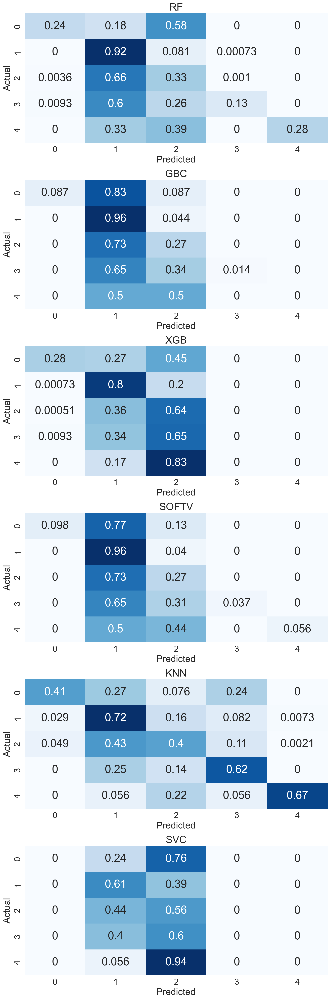

In [135]:

tuned_voting_soft.fit(X_train_smote,y_train_smote)
knn.fit(X_train_smote,y_train_smote)

fig, axes = plt.subplots(6, 1, figsize=(10, 30))
axes = axes.flatten()  # To handle subplots dynamically

for i, (name, clf) in enumerate(zip(
    ['RF', 'GBC', 'XGB','SOFTV','KNN','SVC'],
    [best_rf_clf.best_estimator_, best_gbc_clf.best_estimator_, best_xgb_clf.best_estimator_,tuned_voting_soft,clf_knn,clf_svc]
)):
    test_func(clf, name, axes[i], comparison_test_dict)  # Pass the comparison_test_dict here

plt.tight_layout()


In [136]:
comparison_test_df = pd.DataFrame(comparison_test_dict,
                                  index=['Accuracy','Precision','Recall']).T

comparison_test_df.style.highlight_max(color='indianred', axis=0)

,Accuracy,Precision,Recall
RF,0.536746,0.646418,0.536746
GBC,0.507845,0.668230,0.507845
XGB,0.649601,0.626250,0.649601
SOFTV,0.509496,0.677270,0.509496
KNN,0.538398,0.622029,0.538398
SVC,0.529039,0.491652,0.529039


Text(-0.5, 0.72, '0.70')

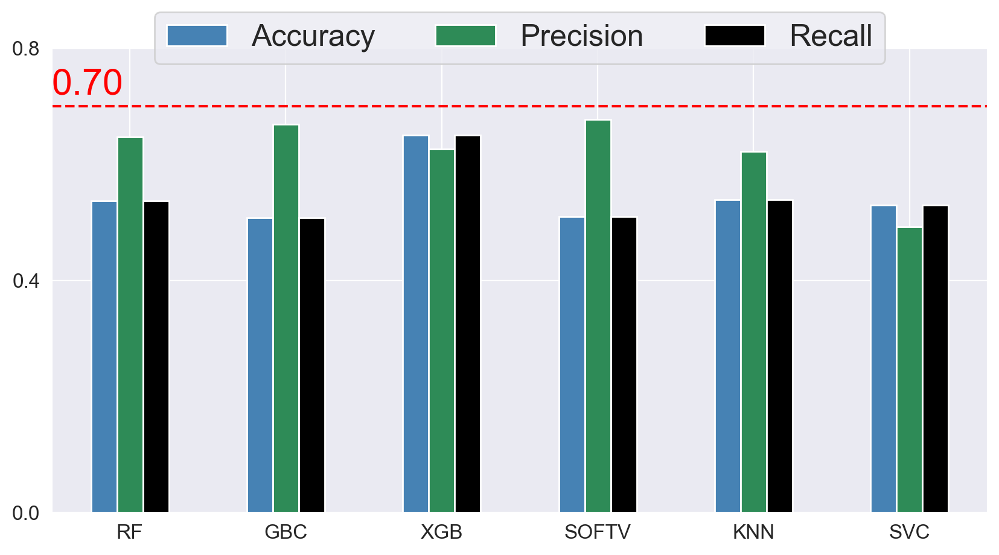

In [137]:
comparison_test_df.plot(kind='bar',
                        figsize=(10, 5),
                        fontsize=12,
                        color=colors_comp)

plt.legend(loc='upper center',
           ncol=len(comparison_test_df.columns),
           bbox_to_anchor=(0.5,1.11))
plt.xticks(rotation=0)
plt.yticks([0,0.4,0.8])

plt.axhline(y=0.70,color='red',linestyle='--')
plt.text(x=-0.5,y=0.72,s='0.70',size=font_size+2,color='red')

We see that the XGBoost Classifier provides a weighted precision score which is a good enough score for the model to be deployed, XGB is the most balanced model. So, we will select XGBoost Classifier as our optimal model

In [138]:
import pickle

#Saving model to disk
pickle.dump(best_xgb_clf.best_estimator_,open('f1model.pkl','wb'))
